In [182]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_diabetes

In [183]:
import sys
sys.maxsize

9223372036854775807

In [184]:
data = load_diabetes()
X = data.data
y = data.target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
y[0]

151.0

In [185]:
X_train_num = np.dot(X_train,1000).astype(int)
X_test_num = np.dot(X_test,1000).astype(int)
y_train_num = y_train
y_test_num = y_test

In [186]:
print(X_train_num)

[[ 70  50  12 ...  34  27  -1]
 [ -9  50 -18 ...  71   0  19]
 [  5 -44  49 ...  -2  17 -13]
 ...
 [ 30 -44 -20 ... -39 -10  -1]
 [-12 -44 -23 ...  -2 -38 -38]
 [-92 -44  28 ... -39  -5  -1]]


In [187]:
X_train_den = np.full(X_train.shape, 1000) 
X_test_den = np.full(X_test.shape, 1000) 
y_train_den = np.ones(len(y_train))
y_test_den = np.ones(len(y_test))

In [188]:
print(X_train_den)

[[1000 1000 1000 ... 1000 1000 1000]
 [1000 1000 1000 ... 1000 1000 1000]
 [1000 1000 1000 ... 1000 1000 1000]
 ...
 [1000 1000 1000 ... 1000 1000 1000]
 [1000 1000 1000 ... 1000 1000 1000]
 [1000 1000 1000 ... 1000 1000 1000]]


In [189]:
#shortening numners 
def shorter(c,d):
    c = int(c)
    d = int(d)
    if(c<0):
        n = c*(-1)
        if(len(str(n))==len(str(d)) and len(str(n))>3):      
            a = f"{n:.0f}"
            a = str(a[:-3])
            a = int(a)*(-1)
            b = f"{d:.0f}"
            b = str(b[:-3])
            b = int(b)
        elif(len(str(n))>=3 and len(str(d))>=3):
            a = f"{n:.0f}"
            a = str(a)
            b = f"{d:.0f}"
            b = str(b)
            if(len(str(a))<len(str(b))):
                s = len(str(a))-2
            else:
                s = len(str(b))-2
            a = int(a[:-s])
            b = int(b[:-s])
            a = a*-1 
        else:
            a = int(n*-1)
            b = d
    elif(len(str(c))==len(str(d)) and len(str(c))>3):      
            a = f"{c:.0f}"
            a = str(a[:-2])
            a = int(a)
            b = f"{d:.0f}"
            b = str(b[:-2])
            b = int(b)
#     elif(len(str(c))==1 and len(str(d))>3):
#         a = int(0)
#         b = int(1)
    elif(len(str(c))>3 and len(str(d))>3):
            a = f"{c:.0f}"
            a = str(a)
            b = f"{d:.0f}"
            b = str(b)
            if(len(str(a))<len(str(b))):
                s = len(str(a))-3
            else:
                s = len(str(b))-3
            a = int(a[:-s])
            b = int(b[:-s])
    else:
        a = c
        b = d
    return a,b

In [190]:
#condensed function multiply and add matrix with numerator and denominator one row at a time
# Python Program to find the L.C.M. of two input number
from math import gcd
def compute_lcm(x, y):
   # choose the greater number 
    if (x > y):
        greater = x
    else:
        greater = y
    while(True):
        if(x==0):
            lcm = y
            break
        elif(y==0):
            lcm = x
            break
        elif((greater % x == 0) and (greater % y == 0)):
            lcm = greater
            break
        greater += 1
    return lcm
 
#Subtracting 2 numbers of the form a/b -c/d
def subtraction(a,b,c,d):
    den = compute_lcm(b,d)
    if b ==0:
        num = c ; den = d
    elif d==0:
        num= a ; den = b
    else:    
        num = ((den/b)*a) - ((den/d)*c)
    return num,den

#adding array of elements of the form x/y
def add_array(a_num,a_den):
    #will work for an int array of any length
    lcm = 1;sum1 =0
    for i in a_den:
        lcm = int(lcm*i/gcd(lcm, i))
#     print("lcm is ",lcm)
    for i in range(len(a_num)):
        sum1 = sum1 + (a_num[i]*(a_den[i]/lcm))
#         print(a_num[i],a_den[i],lcm)      
#     print("sum is ", sum1)
    return sum1,lcm

#adding two numbers of the form a/b + c/d
def addition(a,b,c,d):
    den = compute_lcm(b,d)
    if b ==0:
        num = c ; den = d
    elif d==0:
        num= a ; den = b
    else:    
        num = ((den/b)*a) + ((den/d)*c)
    return int(num),int(den)

#multiplying two arrays of fraction and adding them  for row by column multiplication
def multiply(a_num,a_den,b_num, b_den):
#     print(type(a_num))
    z_num = np.zeros(len(a_num)).astype(int)
    z_den = np.zeros(len(a_den)).astype(int)
#     print("printing anum,aden,bnum,bden",a_num,a_den,b_num,b_den)                                   
    for i in range(len(a_num)):
        z_num[i]=(a_num[i]*b_num[i])     
        z_den[i]=(a_den[i]*b_den[i])
    
    x = z_num.tolist()
    y = z_den.tolist()
#     print("Printing z_num and z_den", x , y )
    num,den = add_array(x,y)
#     print("multiplication results is",num,den) 
    return num,den
    

In [191]:
#claculate y_hat =wx+b | x is in the form a single array and w is in the form of array too
# need toc hange w into wnum and wden
def y_hat(w_num,w_den,x_num,x_den,b):
    y_hat_num = np.zeros(x_num.shape[0]).astype(int)
    y_hat_den = np.zeros(x_den.shape[0]).astype(int)
    #multiplying w and x
    for i in range(x_num.shape[0]):
#         print("iteration number ",i)
        x_n = x_num[i] 
        x_d = x_den[i] 
#         print(x_n,x_d,w_num,w_den)
        temp_n, temp_d = multiply(x_n,x_d,w_num,w_den)
#         print("printing temporary values",temp_n,temp_d)
        y_hat_num[i],y_hat_den[i] = addition( temp_n, temp_d,b[0],b[1])
        y_hat_num[i],y_hat_den[i] = shorter(y_hat_num[i],y_hat_den[i])   #trying this
#     print("y_hat values for this iterationsa are",y_hat_num,y_hat_den)
    return y_hat_num,y_hat_den

In [192]:
#calculating mean square values
def mse(y_hat_num,y_hat_den,y_num,y_den,n):
    num=0;den =0
    for i in range(len(y_hat_num)):
        num1,den1=subtraction(y_num[i],y_den[i],y_hat_num[i],y_hat_den[i])
        num1 = num1*num1
        den1 = den1*den1
        num,den = addition(num,den,num1,den1)
    den = den * n
#     print(num,den)
    return num,den

In [193]:
#calculating subtraction of Y_hat Y
def y_hat_substraction(y_hat_num,y_hat_den,y_num,y_den):
    y_diff =np.zeros((y_hat_num.shape[0],2))
    for i in range(len(y_hat_num)):
        y_diff[i][0],y_diff[i][1] = subtraction(y_hat_num[i],y_hat_den[i], y_num[i], y_den[i])
    return y_diff



In [194]:
#getting delta w with respect 
#need change - can call the subtraction of y_hat from y
def delta_w(y_hat_diff,x_num, x_den, n):
    del_w_num = np.zeros(x_num.shape[1])
    del_w_den = np.zeros(x_num.shape[1])
    
    x_num = x_num.T
    x_den = x_den.T
    y_num = y_hat_diff[:,0]
    y_den = y_hat_diff[:,1]
    
#     print("getting delta w num and den ")
    for i in range(len(del_w_num)):
#         print("printing X",len(x_num[i]))
#         print("printing X",len(x_den[i]))
#         print("printing y diff",len( y_num))
#         print("printing y diff", len(y_den))
        del_w_num[i],del_w_den[i] = multiply(x_num[i],x_den[i],y_num,y_den)
        del_w_num[i] = del_w_num[i]*2
        del_w_den[i] = del_w_den[i]*n
#     print("delta w num and den are",del_w_num,del_w_den)
    return del_w_num,del_w_den

    
    

In [195]:
#getting delta b 
def delta_b(y_hat_diff):

#     print(type(y_hat_diff))
    yh_num = np.array(y_hat_diff[:,0]).astype(int)
    yh_den = np.array(y_hat_diff[:,1]).astype(int)
#     print(type(yh_num[0]))
#     print(type(yh_den[0]))    
#     print("printing yh_num",yh_num)
#     print("printing yh_den",yh_den)
    num,den = add_array(yh_num, yh_den)
    num = num*2
    den = den*len(yh_num)
#     print("printing delta_b", num,den)
    return num,den

In [196]:
# get new weights and biases
def get_new_params(lr, dw_num,dw_den,db_num,db_den,w_num,w_den,b_num,b_den):
    
    for i in range(len(dw_num)):
        dw_num[i]= dw_num[i]*lr[0]
        dw_den[i]= dw_den[i]*lr[1]
   
    btemp_num = lr[0] * db_num
    btemp_den = lr[1] * db_den 

    for i in range(len(dw_num)):
        dw_num[i],dw_den[i] = subtraction(w_num[i],w_den[i],dw_num[i],dw_den[i]) 
    
    db_num,db_den = subtraction(b_num,b_den,btemp_num,btemp_den)
#     print("printing new weight parameters", dw_num,dw_den)
#     print("printing new bias parameters",db_num,db_den)
    return  dw_num,dw_den,db_num,db_den

In [197]:
#normalize weights and bias
def normalize_weights_bias(wnum,wden, bnum,bden):
    wn_num = np.zeros(10) 
    wn_den = np.zeros(10)
    for i in range (len(wf_num)):
        wn_num[i] = int((wnum[i]/wden[i]) * 100)
        wn_den[i] = 100
    bnum = int(bnum/bden * 100)
    bden = 100
    
#     print("Normalizing weights and biases",wn_num,wn_den, bnum, bden)
    return wn_num, wn_den,bnum, bden

In [198]:
wnum = np.ones(10)
wden = np.ones(10)
b =[1,1]
bnum =1
bden =1
lr = [1,1000]

In [199]:
#getting y_hat = wx+b and , this matches with my main code
wnum = np.ones(10)
wden = np.ones(10)
b =[1,1]
bnum =1
bden =1
lr = [1,1000]
loss_num =[]
loss_den=[]
for i in range(1000):
    yh_num,yh_den = y_hat(wnum,wden,X_train_num, X_train_den,b)
#     print("bias is ",(b))
#     print("printing y_hat results",yh_num, yh_den)

    #getting MSE, MSE matches with my main code
    mse_num,mse_den= mse(yh_num, yh_den, y_train_num,y_train_den,len(yh_num))
    loss_num.append(mse_num)
    loss_den.append(mse_den)
#     print("loss is ",mse_num, mse_den)

    #getting y_hat differenc
    y_diff = y_hat_substraction(yh_num,yh_den,y_train_num,y_train_den)
    y_diff

    # get delta_W
    delw_num,delw_den = delta_w(y_diff,X_train_num,X_train_den, len(yh_num))

    # get delta_b
    delb_num, delb_den = delta_b(y_diff)

    #get new parameters
    wf_num,wf_den,bf_num,bf_den = get_new_params(lr, delw_num,delw_den,delb_num,delb_den,wnum,wden,bnum,bden)

    #normalize weights and bias parameters
    wnum,wden, bnum, bden = normalize_weights_bias(wf_num,wf_den,bf_num,bf_den)
    b[0] = bnum
    b[1] = bden
print(wnum,wden, bnum, bden)

[63. 62. 67. 66. 62. 62.  0. 63. 66. 66.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 12946 100


In [200]:
loss1000 = []
for i in range(len(loss_num)):
    loss1000.append(loss_num[i]/loss_den[i])

In [201]:
#getting y_hat = wx+b and , this matches with my main code
wnum = np.ones(10)
wden = np.ones(10)
b =[1,1]
bnum =1
bden =1
lr = [1,100]
loss_num =[]
loss_den=[]
for i in range(1000):
    yh_num,yh_den = y_hat(wnum,wden,X_train_num, X_train_den,b)
#     print("bias is ",(b))
#     print("printing y_hat results",yh_num, yh_den)

    #getting MSE, MSE matches with my main code
    mse_num,mse_den= mse(yh_num, yh_den, y_train_num,y_train_den,len(yh_num))
    loss_num.append(mse_num)
    loss_den.append(mse_den)
#     print("loss is ",mse_num, mse_den)

    #getting y_hat differenc
    y_diff = y_hat_substraction(yh_num,yh_den,y_train_num,y_train_den)
    y_diff

    # get delta_W
    delw_num,delw_den = delta_w(y_diff,X_train_num,X_train_den, len(yh_num))

    # get delta_b
    delb_num, delb_den = delta_b(y_diff)

    #get new parameters
    wf_num,wf_den,bf_num,bf_den = get_new_params(lr, delw_num,delw_den,delb_num,delb_den,wnum,wden,bnum,bden)

    #normalize weights and bias parameters
    wnum,wden, bnum, bden = normalize_weights_bias(wf_num,wf_den,bf_num,bf_den)
    b[0] = bnum
    b[1] = bden
print(wnum,wden, bnum, bden)

[ 1096.     0.  4021.  2979.  1095.   444. -1938.  2351.  3238.  2168.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15317 100


In [202]:
loss100 = []
for i in range(len(loss_num)):
    loss100.append(loss_num[i]/loss_den[i])

In [203]:
#getting y_hat = wx+b and , this matches with my main code
wnum = np.ones(10)
wden = np.ones(10)
b =[1,1]
bnum =1
bden =1
lr = [1,10]
loss_num =[]
loss_den=[]
for i in range(1000):
    yh_num,yh_den = y_hat(wnum,wden,X_train_num, X_train_den,b)
#     print("bias is ",(b))
#     print("printing y_hat results",yh_num, yh_den)

    #getting MSE, MSE matches with my main code
    mse_num,mse_den= mse(yh_num, yh_den, y_train_num,y_train_den,len(yh_num))
    loss_num.append(mse_num)
    loss_den.append(mse_den)
#     print("loss is ",mse_num, mse_den)

    #getting y_hat differenc
    y_diff = y_hat_substraction(yh_num,yh_den,y_train_num,y_train_den)
    y_diff

    # get delta_W
    delw_num,delw_den = delta_w(y_diff,X_train_num,X_train_den, len(yh_num))

    # get delta_b
    delb_num, delb_den = delta_b(y_diff)

    #get new parameters
    wf_num,wf_den,bf_num,bf_den = get_new_params(lr, delw_num,delw_den,delb_num,delb_den,wnum,wden,bnum,bden)

    #normalize weights and bias parameters
    wnum,wden, bnum, bden = normalize_weights_bias(wf_num,wf_den,bf_num,bf_den)
    b[0] = bnum
    b[1] = bden
print(wnum,wden, bnum, bden)

[  5389.  -3888.  26692.  19010.   2584.     86. -14313.  13568.  22168.
  13317.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15224 100


In [204]:
loss10 = []
for i in range(len(loss_num)):
    loss10.append(loss_num[i]/loss_den[i])

In [205]:
print(loss10)

[29393.418535016997, 26013.158901983003, 18823.88848555241, 14217.909514164307, 11267.327893767706, 9376.665657790369, 8163.659601416431, 7384.937877053824, 6883.76508470255, 6560.281305665722, 6350.311126912181, 6213.244673654391, 6122.942026912181, 6062.573724362606, 6021.197377620397, 5992.032472521247, 5970.792252974505, 5954.537645609065, 5941.538657223796, 5930.598966005666, 5920.916467988669, 5912.13158101983, 5903.895479320114, 5896.1247288951845, 5888.5403303116145, 5881.096759773372, 5873.8324569405095, 5866.584242776204, 5859.476175920679, 5852.361078186969, 5845.300838526912, 5838.281117847026, 5831.3317101983, 5824.287124645893, 5817.322385835694, 5810.357469405099, 5803.515210481586, 5796.544711048158, 5789.667937110482, 5782.798909631728, 5775.909879886685, 5769.086811331445, 5762.277039660056, 5755.497387252125, 5748.728084419264, 5742.064678186969, 5735.363468271955, 5728.6449569405095, 5722.025384135977, 5715.390557790368, 5708.785954390934, 5702.205404249292, 5695.65

In [206]:
#getting y_hat = wx+b and , this matches with my main code
wnum = np.ones(10)
wden = np.ones(10)
b =[1,1]
bnum =1
bden =1
lr = [5,10]
loss_num =[]
loss_den=[]
for i in range(1000):
    yh_num,yh_den = y_hat(wnum,wden,X_train_num, X_train_den,b)
#     print("bias is ",(b))
    print("printing y_hat results",yh_num, yh_den)

    #getting MSE, MSE matches with my main code
    mse_num,mse_den= mse(yh_num, yh_den, y_train_num,y_train_den,len(yh_num))
    loss_num.append(mse_num)
    loss_den.append(mse_den)
#     print("loss is ",mse_num, mse_den)
    print("mse",mse_num, mse_den)
    #getting y_hat differenc
    y_diff = y_hat_substraction(yh_num,yh_den,y_train_num,y_train_den)
    print("y_diff printing",y_diff)

    # get delta_W
    delw_num,delw_den = delta_w(y_diff,X_train_num,X_train_den, len(yh_num))
    print("delta w values", delw_num, delw_den)
    # get delta_b
    delb_num, delb_den = delta_b(y_diff)
    print("delta b ", delb_num, delb_den)
    #get new parameters
    wf_num,wf_den,bf_num,bf_den = get_new_params(lr, delw_num,delw_den,delb_num,delb_den,wnum,wden,bnum,bden)

    #normalize weights and bias parameters
    wnum,wden, bnum, bden = normalize_weights_bias(wf_num,wf_den,bf_num,bf_den)
    b[0] = bnum
    b[1] = bden
    print("normalized weights",wnum,wden, bnum, bden);

printing y_hat results [ 12  10  10 564 600 556  10  13 911 735 833  11 612  12 645  11 486 988
  10  12 830  10  11  12  12  11 867 751 886 589 997 865 772 828  11 977
  11  10 710  10 464  13 779  10  11  13  11  12  11 815  12 598  14  14
 657  12  13 994  12  12  11  12 948  10  13 897  10 664  10  12  12 904
 663 752 910  10  10  10 599 847 972  10 650 867  10  10  14  11  12  11
  12 945  12  11 740 891 926 738 964  11 958 407 825  12  10  15 718  13
  14  13 659  11  12  13 738 851  11  12 667  10  10  10  10 701 936  16
 962  12 899 810  12  10  11 609 941  14 838  12  14  13  14  13  10  11
  11  13  10  12 855  14 988  11 745 866 557 772 628  12 607  11  15  12
  11 632  11 728 898 660  11 865 963  10 963  12 421  11 898 988  10 483
  12  11  12  12 788 578 931 670  10  10 952  10 618  14  11 463  11 657
 927 544  11  11 855  11 737 896  12 781  11 761 626  10  12 887  13 956
 454 997  11  12  14 638 893 999 646  11 725  11 835 505 902 702  12 935
 426  12  11  11  11 864 917

printing y_hat results [15437 15387 15430 15261 15245 15231 15406 15505 15391 15284 15286 15423
 15299 15503 15280 15396 15251 15348 15368 15419 15363 15364 15413 15438
 15465 15435 15367 15338 15348 15277 15374 15355 15303 15285 15394 15358
 15396 15398 15307 15419 15253 15404 15287 15445 15448 15470 15411 15505
 15411 15282 15446 15273 15462 15513 15286 15488 15463 15372 15465 15408
 15418 15422 15413 15340 15470 15323 15402 15320 15325 15403 15399 15360
 15268 15275 15347 15341 15389 15378 15272 15327 15327 15392 15273 15337
 15397 15440 15505 15443 15465 15473 15394 15326 15435 15394 15285 15375
 15357 15289 15409 15457 15403 15252 15350 15414 15366 15509 15292 15507
 15455 15448 15321 15342 15472 15469 15334 15308 15377 15442 15254 15440
 15395 15388 15394 15315 15327 15504 15369 15448 15318 15286 15425 15360
 15446 15307 15342 15537 15342 15432 15488 15455 15442 15439 15363 15447
 15460 15494 15419 15369 15324 15499 15398 15424 15316 15259 15283 15313
 15264 15447 15302 15447 155

printing y_hat results [15474 15399 15456 15200 15176 15155 15421 15572 15400 15234 15241 15449
 15266 15567 15232 15408 15183 15337 15368 15440 15355 15364 15428 15474
 15512 15467 15367 15320 15336 15220 15376 15342 15271 15238 15404 15350
 15401 15414 15272 15445 15187 15423 15238 15481 15487 15515 15435 15568
 15433 15232 15479 15220 15515 15588 15240 15552 15515 15372 15515 15432
 15446 15451 15425 15320 15526 15301 15420 15290 15300 15427 15411 15352
 15211 15224 15332 15325 15400 15373 15218 15302 15302 15403 15225 15319
 15405 15471 15577 15477 15512 15522 15407 15299 15469 15410 15241 15374
 15354 15248 15424 15503 15417 15188 15335 15439 15365 15581 15245 15575
 15505 15491 15291 15317 15523 15523 15314 15273 15379 15475 15192 15473
 15405 15391 15409 15284 15305 15583 15365 15487 15286 15239 15456 15353
 15483 15270 15326 15620 15322 15466 15550 15499 15482 15479 15359 15482
 15499 15553 15441 15370 15293 15569 15410 15452 15289 15195 15234 15282
 15212 15487 15263 15485 156

delta w values [-4.70600280e+07 -3.53556000e+05 -1.51083688e+08 -1.13769470e+08
 -4.83862060e+07 -3.70060720e+07  9.48599120e+07 -1.06096888e+08
 -1.38707746e+08 -9.86971600e+07] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  400.0 35300
normalized weights [ 404.    0. 1358.  977.  358.  280. -701.  900. 1189.  847.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15367 100
printing y_hat results [15581 15433 15532 15020 14972 14932 15464 15769 15425 15087 15108 15525
 15167 15757 15090 15442 14983 15304 15365 15503 15329 15362 15469 15580
 15650 15562 15366 15266 15296 15054 15379 15301 15175 15096 15431 15327
 15415 15462 15168 15524 14994 15478 15093 15587 15600 15649 15503 15754
 15496 15083 15575 15063 15669 15811 15106 15740 15668 15370 15663 15502
 15525 15533 15462 15262 15689 15233 15470 15201 15226 15496 15445 15329
 15044 15072 15285 15278 15431 15358 15059 15228 15226 15433 15084 15265
 15429 15562 15789 1

delta w values [-4.51896980e+07  8.59852000e+05 -1.47500546e+08 -1.10818446e+08
 -4.55701340e+07 -3.43171560e+07  9.20312000e+07 -1.02114024e+08
 -1.34745284e+08 -9.52827900e+07] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  544.0 35300
normalized weights [ 6.620e+02 -1.000e+00  2.199e+03  1.609e+03  6.200e+02  4.780e+02
 -1.227e+03  1.485e+03  1.959e+03  1.392e+03] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15362 100
printing y_hat results [15719 15476 15631 14787 14708 14642 15521 16025 15459 14897 14935 15623
 15038 16004 14906 15486 14725 15260 15362 15585 15297 15359 15524 15718
 15829 15685 15365 15197 15246 14840 15384 15250 15049 14913 15466 15298
 15434 15523 15034 15625 14744 15548 14905 15726 15748 15822 15591 15998
 15577 14891 15699 14860 15867 16098 14931 15983 15864 15369 15854 15592
 15627 15639 15511 15186 15900 15145 15535 15087 15130 15583 15488 15300
 14827 14875 15226 15217 15472 15339 14853

 100 100 100 100 100 100 100 100 100 100 100]
mse 20053930531 3530000
y_diff printing [[  1351.    100.]
 [   486.    100.]
 [-12345.    100.]
 [  2230.    100.]
 [  8743.    100.]
 [  8071.    100.]
 [-12566.    100.]
 [-11613.    100.]
 [ -1233.    100.]
 [  5850.    100.]
 [  7692.    100.]
 [ -2154.    100.]
 [  6206.    100.]
 [-10936.    100.]
 [  4761.    100.]
 [ -4204.    100.]
 [  4961.    100.]
 [  9948.    100.]
 [  8261.    100.]
 [-10596.    100.]
 [ 10088.    100.]
 [  5158.    100.]
 [ -1063.    100.]
 [ -3149.    100.]
 [ -1428.    100.]
 [ -6285.    100.]
 [ -5236.    100.]
 [  5479.    100.]
 [  9233.    100.]
 [  8687.    100.]
 [ -8815.    100.]
 [  3137.    100.]
 [  2218.    100.]
 [  4467.    100.]
 [-11026.    100.]
 [  2090.    100.]
 [-12862.    100.]
 [ -1863.    100.]
 [  2100.    100.]
 [-10051.    100.]
 [   983.    100.]
 [  9265.    100.]
 [  5558.    100.]
 [ -7441.    100.]
 [ -5017.    100.]
 [-10236.    100.]
 [ -2288.    100.]
 [ -9743.    100.]
 [

printing y_hat results [15818 15507 15704 14618 14516 14431 15563 16212 15484 14758 14808 15694
 14944 16184 14773 15517 14538 15227 15359 15643 15274 15356 15564 15818
 15958 15775 15363 15147 15209 14685 15388 15213 14958 14778 15492 15276
 15448 15567 14936 15699 14563 15598 14768 15827 15856 15949 15655 16176
 15635 14751 15790 14713 16009 16306 14804 16159 16006 15368 15992 15656
 15701 15716 15548 15130 16052 15080 15582 15005 15059 15645 15519 15278
 14669 14731 15182 15171 15501 15326 14703 15063 15056 15499 14765 15143
 15484 15768 16263 15797 15961 15990 15522 15033 15783 15552 14810 15361
 15324 14857 15574 15942 15553 14579 15190 15666 15352 16263 14795 16222
 15968 15892 15002 15078 16010 16031 15117 14926 15396 15785 14592 15785
 15494 15419 15544 14985 15081 16319 15325 15864 14975 14789 15746 15288
 15833 14921 15171 16422 15129 15785 16133 15914 15851 15852 15315 15815
 15881 16115 15647 15376 14998 16234 15529 15711 15032 14579 14767 14981
 14709 15862 14890 15851 163

 100 100 100 100 100 100 100 100 100 100 100]
mse 19709700813 3530000
y_diff printing [[ 1.4510e+03  1.0000e+02]
 [ 5.1800e+02  1.0000e+02]
 [-1.2271e+04  1.0000e+02]
 [ 2.0630e+03  1.0000e+02]
 [ 8.5530e+03  1.0000e+02]
 [ 7.8620e+03  1.0000e+02]
 [-1.2523e+04  1.0000e+02]
 [-1.1426e+04  1.0000e+02]
 [-1.2080e+03  1.0000e+02]
 [ 5.7130e+03  1.0000e+02]
 [ 7.5670e+03  1.0000e+02]
 [-2.0820e+03  1.0000e+02]
 [ 6.1140e+03  1.0000e+02]
 [-1.0756e+04  1.0000e+02]
 [ 4.6290e+03  1.0000e+02]
 [-4.1720e+03  1.0000e+02]
 [ 4.7770e+03  1.0000e+02]
 [ 9.9170e+03  1.0000e+02]
 [ 8.2580e+03  1.0000e+02]
 [-1.0537e+04  1.0000e+02]
 [ 1.0067e+04  1.0000e+02]
 [ 5.1560e+03  1.0000e+02]
 [-1.0220e+03  1.0000e+02]
 [-3.0490e+03  1.0000e+02]
 [-1.2990e+03  1.0000e+02]
 [-6.1960e+03  1.0000e+02]
 [-5.2370e+03  1.0000e+02]
 [ 5.4310e+03  1.0000e+02]
 [ 9.1970e+03  1.0000e+02]
 [ 8.5340e+03  1.0000e+02]
 [-8.8110e+03  1.0000e+02]
 [ 3.1010e+03  1.0000e+02]
 [ 2.1280e+03  1.0000e+02]
 [ 4.3350e+03  1.0000e+

printing y_hat results [15915 15537 15776 14454 14328 14225 15604 16394 15508 14623 14684 15764
 14852 16361 14642 15547 14356 15195 15355 15700 15252 15353 15604 15915
 16085 15862 15362 15098 15173 14534 15391 15178 14867 14647 15516 15254
 15463 15610 14841 15770 14387 15645 14634 15926 15962 16073 15716 16351
 15692 14613 15880 14569 16146 16509 14680 16331 16144 15367 16127 15717
 15772 15790 15586 15076 16201 15016 15628 14925 14989 15704 15549 15258
 14515 14590 15140 15126 15529 15314 14557 14995 14985 15526 14634 15093
 15508 15855 16457 15889 16089 16125 15552 14958 15871 15591 14687 15358
 15314 14745 15618 16067 15593 14408 15150 15729 15347 16456 14668 16406
 16097 16005 14921 15009 16148 16174 15063 14827 15399 15873 14421 15875
 15519 15427 15582 14901 15016 16525 15314 15970 14886 14660 15827 15268
 15933 14823 15126 16650 15075 15874 16297 16031 15954 15956 15301 15910
 15991 16276 15706 15375 14915 16421 15564 15784 14959 14404 14635 14896
 14565 15968 14785 15955 165

delta b  538.0 35300
normalized weights [ 1147.   -22.  3823.  2822.  1097.   830. -2231.  2589.  3434.  2426.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15352 100
printing y_hat results [15978 15557 15825 14347 14206 14092 15631 16514 15525 14536 14603 15810
 14793 16478 14558 15567 14238 15174 15353 15738 15239 15350 15631 15979
 16168 15919 15362 15067 15150 14436 15393 15155 14809 14562 15533 15240
 15473 15638 14779 15817 14274 15675 14548 15992 16031 16154 15756 16466
 15729 14524 15939 14476 16236 16641 14600 16443 16235 15366 16215 15756
 15818 15839 15611 15040 16298 14974 15658 14874 14943 15742 15569 15245
 14415 14499 15113 15096 15548 15308 14462 14951 14939 15544 14548 15060
 15524 15912 16584 15950 16174 16214 15573 14909 15930 15617 14607 15357
 15307 14672 15647 16148 15620 14297 15124 15770 15344 16582 14586 16528
 16181 16079 14869 14965 16239 16267 15028 14764 15402 15931 14310 15934
 15537 15434 15607 14847 14975 16658 15308 16041 14829 14577 15880 15256


printing y_hat results [16039 15575 15871 14242 14085 13959 15658 16631 15540 14449 14522 15855
 14733 16592 14474 15586 14122 15153 15350 15773 15226 15346 15657 16041
 16249 15975 15361 15035 15126 14340 15395 15133 14750 14477 15548 15226
 15483 15664 14718 15863 14161 15704 14461 16056 16099 16234 15795 16579
 15765 14435 15996 14383 16323 16770 14520 16553 16322 15365 16301 15794
 15863 15885 15636 15005 16392 14932 15687 14822 14898 15779 15587 15232
 14316 14408 15086 15066 15565 15300 14368 14907 14893 15561 14463 15027
 15539 15968 16707 16009 16256 16301 15591 14860 15986 15641 14527 15356
 15300 14599 15676 16228 15645 14187 15098 15810 15340 16706 14504 16646
 16262 16150 14817 14922 16328 16358 14993 14700 15403 15988 14199 15992
 15553 15440 15630 14793 14932 16787 15302 16109 14772 14494 15932 15242
 16062 14697 15068 16945 15006 15989 16510 16182 16085 16089 15284 16035
 16134 16485 15784 15373 14808 16663 15609 15879 14864 14176 14465 14785
 14378 16105 14651 16089 168

printing y_hat results [16100 15594 15918 14139 13967 13829 15685 16748 15557 14365 14443 15899
 14676 16706 14392 15605 14008 15133 15348 15809 15214 15344 15683 16103
 16329 16030 15360 15006 15104 14246 15397 15112 14693 14394 15564 15212
 15493 15691 14659 15909 14051 15733 14378 16120 16167 16313 15834 16691
 15801 14348 16053 14293 16409 16898 14443 16661 16410 15365 16386 15832
 15907 15932 15662 14970 16485 14892 15717 14773 14853 15815 15606 15220
 14219 14319 15060 15037 15583 15294 14276 14864 14848 15578 14380 14996
 15555 16025 16830 16069 16338 16388 15610 14812 16042 15666 14450 15355
 15293 14528 15705 16307 15671 14080 15073 15849 15336 16828 14425 16764
 16342 16222 14768 14879 16416 16448 14959 14638 15405 16044 14092 16049
 15570 15446 15654 14741 14891 16915 15296 16177 14716 14413 15983 15230
 16126 14637 15040 17090 14973 16045 16614 16256 16150 16154 15275 16097
 16204 16588 15822 15371 14757 16781 15631 15925 14818 14064 14383 14731
 14288 16173 14586 16156 170

printing y_hat results [16160 15612 15965 14038 13851 13702 15711 16862 15573 14281 14366 15943
 14620 16818 14312 15623 13897 15113 15346 15845 15203 15340 15709 16164
 16408 16085 15360 14976 15082 14154 15399 15091 14637 14313 15579 15199
 15504 15717 14601 15954 13943 15761 14295 16183 16235 16392 15872 16802
 15836 14262 16110 14204 16493 17023 14366 16768 16495 15364 16470 15868
 15951 15978 15688 14937 16577 14852 15746 14725 14809 15850 15625 15208
 14124 14232 15035 15008 15601 15289 14187 14823 14804 15595 14298 14965
 15571 16081 16950 16128 16418 16473 15628 14765 16098 15689 14374 15355
 15287 14458 15734 16385 15697 13976 15049 15888 15333 16947 14348 16880
 16420 16291 14719 14837 16503 16536 14927 14577 15407 16100 13986 16106
 15587 15453 15677 14690 14851 17040 15291 16244 14662 14334 16033 15218
 16188 14578 15012 17233 14940 16100 16717 16329 16212 16218 15267 16158
 16274 16689 15860 15369 14707 16897 15654 15971 14773 13955 14302 14678
 14198 16239 14523 16221 171

printing y_hat results [16246 15637 16033 13889 13680 13513 15750 17030 15596 14158 14250 16007
 14535 16983 14193 15649 13733 15083 15341 15895 15186 15334 15747 16253
 16523 16164 15358 14932 15049 14019 15401 15060 14553 14191 15601 15179
 15519 15755 14514 16019 13785 15800 14173 16276 16333 16506 15926 16965
 15886 14135 16193 14074 16614 17206 14253 16923 16619 15363 16591 15920
 16013 16044 15727 14886 16710 14791 15787 14654 14743 15899 15651 15190
 13983 14102 14997 14964 15626 15281 14054 14761 14737 15619 14176 14918
 15595 16163 17126 16214 16536 16599 15653 14696 16178 15723 14260 15354
 15275 14354 15776 16498 15734 13821 15013 15943 15326 17122 14234 17050
 16533 16392 14648 14775 16629 16663 14878 14487 15408 16181 13829 16189
 15611 15463 15710 14614 14790 17220 15283 16341 14581 14216 16104 15199
 16280 14491 14970 17442 14892 16180 16865 16435 16302 16310 15253 16246
 16376 16837 15915 15364 14632 17065 15686 16037 14705 13793 14183 14600
 14065 16335 14429 16316 173

printing y_hat results [16275 15646 16056 13840 13624 13452 15763 17086 15604 14119 14213 16028
 14508 17038 14155 15658 13680 15073 15340 15912 15180 15332 15760 16282
 16561 16191 15358 14918 15039 13975 15402 15051 14525 14152 15608 15172
 15525 15767 14486 16041 13733 15813 14134 16306 16365 16544 15944 17019
 15903 14094 16220 14031 16654 17266 14217 16975 16660 15363 16632 15937
 16034 16066 15740 14869 16754 14771 15801 14631 14722 15915 15660 15185
 13937 14060 14985 14950 15634 15278 14011 14741 14716 15627 14136 14903
 15603 16190 17184 16243 16575 16641 15661 14673 16204 15734 14224 15354
 15272 14320 15790 16536 15747 13771 15001 15961 15323 17180 14197 17106
 16570 16425 14624 14755 16671 16705 14863 14457 15409 16208 13778 16217
 15619 15466 15722 14590 14770 17280 15281 16373 14554 14177 16128 15193
 16310 14462 14956 17511 14877 16206 16914 16470 16331 16340 15248 16276
 16410 16886 15934 15363 14608 17121 15697 16059 14683 13740 14145 14574
 14021 16367 14399 16347 174

printing y_hat results [16359 15671 16124 13698 13459 13270 15801 17249 15628 14001 14102 16090
 14428 17199 14041 15683 13523 15044 15335 15962 15166 15326 15798 16368
 16673 16268 15357 14877 15008 13845 15405 15023 14445 14035 15630 15153
 15541 15804 14404 16105 13581 15850 14017 16398 16461 16656 15997 17178
 15952 13972 16301 13906 16771 17443 14109 17126 16780 15362 16750 15986
 16095 16130 15779 14820 16882 14713 15842 14564 14658 15962 15685 15169
 13802 13936 14950 14907 15658 15272 13883 14682 14652 15652 14018 14859
 15627 16272 17354 16327 16690 16764 15685 14606 16283 15767 14115 15355
 15261 14220 15832 16646 15785 13624 14967 16015 15317 17349 14087 17271
 16679 16523 14557 14696 16795 16829 14817 14370 15410 16287 13627 16298
 15644 15477 15754 14519 14712 17453 15274 16468 14477 14064 16198 15175
 16399 14380 14916 17714 14831 16284 17059 16573 16418 16429 15235 16364
 16511 17031 15989 15357 14538 17284 15730 16124 14618 13584 14031 14499
 13893 16461 14311 16440 175

 100 100 100 100 100 100 100 100 100 100 100]
mse 17943181085 3530000
y_diff printing [[ 1.9860e+03  1.0000e+02]
 [ 6.7900e+02  1.0000e+02]
 [-1.1854e+04  1.0000e+02]
 [ 1.1510e+03  1.0000e+02]
 [ 7.5050e+03  1.0000e+02]
 [ 6.7110e+03  1.0000e+02]
 [-1.2286e+04  1.0000e+02]
 [-1.0397e+04  1.0000e+02]
 [-1.0650e+03  1.0000e+02]
 [ 4.9620e+03  1.0000e+02]
 [ 6.8650e+03  1.0000e+02]
 [-1.6890e+03  1.0000e+02]
 [ 5.6010e+03  1.0000e+02]
 [-9.7480e+03  1.0000e+02]
 [ 3.9040e+03  1.0000e+02]
 [-4.0090e+03  1.0000e+02]
 [ 3.7720e+03  1.0000e+02]
 [ 9.7340e+03  1.0000e+02]
 [ 8.2340e+03  1.0000e+02]
 [-1.0222e+04  1.0000e+02]
 [ 9.9610e+03  1.0000e+02]
 [ 5.1240e+03  1.0000e+02]
 [-7.8900e+02  1.0000e+02]
 [-2.5030e+03  1.0000e+02]
 [-5.9000e+02  1.0000e+02]
 [-5.7060e+03  1.0000e+02]
 [-5.2430e+03  1.0000e+02]
 [ 5.1640e+03  1.0000e+02]
 [ 8.9970e+03  1.0000e+02]
 [ 7.7030e+03  1.0000e+02]
 [-8.7940e+03  1.0000e+02]
 [ 2.9140e+03  1.0000e+02]
 [ 1.6180e+03  1.0000e+02]
 [ 3.5970e+03  1.0000e+

printing y_hat results [16492 15709 16234 13468 13193 12976 15863 17513 15665 13810 13920 16190
 14296 17460 13857 15722 13271 14995 15326 16040 15143 15313 15860 16506
 16853 16392 15355 14811 14957 13637 15409 14978 14312 13846 15663 15121
 15567 15862 14270 16207 13337 15907 13828 16545 16616 16836 16080 17436
 16030 13773 16432 13703 16956 17726 13933 17367 16971 15360 16939 16063
 16190 16231 15844 14740 17088 14617 15907 14456 14553 16034 15725 15142
 13583 13734 14892 14836 15696 15262 13677 14586 14548 15689 13827 14787
 15666 16404 17627 16464 16875 16964 15721 14498 16407 15817 13938 15356
 15242 14056 15901 16823 15845 13387 14913 16099 15304 17621 13912 17538
 16850 16679 14448 14600 16993 17026 14744 14230 15410 16415 13383 16429
 15682 15494 15805 14403 14615 17727 15264 16620 14351 13880 16308 15144
 16542 14247 14850 18041 14758 16406 17290 16737 16554 16569 15212 16505
 16673 17264 16077 15346 14424 17545 15782 16227 14512 13330 13849 14376
 13684 16610 14168 16589 179

 100 100 100 100 100 100 100 100 100 100 100]
mse 17298563558 3530000
y_diff printing [[ 2.1950e+03  1.0000e+02]
 [ 7.3900e+02  1.0000e+02]
 [-1.1679e+04  1.0000e+02]
 [ 7.9200e+02  1.0000e+02]
 [ 7.0890e+03  1.0000e+02]
 [ 6.2510e+03  1.0000e+02]
 [-1.2188e+04  1.0000e+02]
 [-9.9830e+03  1.0000e+02]
 [-1.0050e+03  1.0000e+02]
 [ 4.6640e+03  1.0000e+02]
 [ 6.5810e+03  1.0000e+02]
 [-1.5320e+03  1.0000e+02]
 [ 5.3960e+03  1.0000e+02]
 [-9.3370e+03  1.0000e+02]
 [ 3.6160e+03  1.0000e+02]
 [-3.9480e+03  1.0000e+02]
 [ 3.3780e+03  1.0000e+02]
 [ 9.6580e+03  1.0000e+02]
 [ 8.2190e+03  1.0000e+02]
 [-1.0100e+04  1.0000e+02]
 [ 9.9270e+03  1.0000e+02]
 [ 5.1030e+03  1.0000e+02]
 [-6.9100e+02  1.0000e+02]
 [-2.2860e+03  1.0000e+02]
 [-3.0900e+02  1.0000e+02]
 [-5.5110e+03  1.0000e+02]
 [-5.2460e+03  1.0000e+02]
 [ 5.0600e+03  1.0000e+02]
 [ 8.9180e+03  1.0000e+02]
 [ 7.3790e+03  1.0000e+02]
 [-8.7880e+03  1.0000e+02]
 [ 2.8450e+03  1.0000e+02]
 [ 1.4100e+03  1.0000e+02]
 [ 3.3000e+03  1.0000e+

y_diff printing [[  2220.    100.]
 [   746.    100.]
 [-11658.    100.]
 [   749.    100.]
 [  7038.    100.]
 [  6195.    100.]
 [-12176.    100.]
 [ -9933.    100.]
 [  -997.    100.]
 [  4628.    100.]
 [  6546.    100.]
 [ -1513.    100.]
 [  5372.    100.]
 [ -9287.    100.]
 [  3581.    100.]
 [ -3941.    100.]
 [  3332.    100.]
 [  9649.    100.]
 [  8217.    100.]
 [-10085.    100.]
 [  9923.    100.]
 [  5100.    100.]
 [  -679.    100.]
 [ -2260.    100.]
 [  -275.    100.]
 [ -5488.    100.]
 [ -5246.    100.]
 [  5048.    100.]
 [  8909.    100.]
 [  7341.    100.]
 [ -8787.    100.]
 [  2837.    100.]
 [  1385.    100.]
 [  3264.    100.]
 [-10804.    100.]
 [  1890.    100.]
 [-12705.    100.]
 [ -1483.    100.]
 [  1244.    100.]
 [ -9394.    100.]
 [  -595.    100.]
 [  9659.    100.]
 [  4348.    100.]
 [ -6512.    100.]
 [ -4033.    100.]
 [ -9089.    100.]
 [ -1740.    100.]
 [ -8113.    100.]
 [-10096.    100.]
 [  8482.    100.]
 [ -7140.    100.]
 [  6410.    10

 [-15378.    100.]]
delta w values [-3.14455660e+07  9.47995600e+06 -1.20441384e+08 -8.86220600e+07
 -2.52787520e+07 -1.50772200e+07  7.09307040e+07 -7.28509740e+07
 -1.05211702e+08 -6.99136920e+07] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  426.0 35300
normalized weights [ 2515.  -261.  8774.  6493.  2313.  1642. -5208.  5746.  7836.  5424.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15322 100
printing y_hat results [16717 15773 16427 13081 12742 12479 15972 17964 15732 13488 13611 16362
 14075 17910 13546 15787 12848 14913 15310 16172 15110 15289 15969 16743
 17158 16605 15352 14700 14872 13290 15416 14906 14086 13523 15721 15066
 15617 15959 14046 16382 12928 15997 13508 16800 16884 17146 16220 17883
 16160 13435 16658 13361 17265 18205 13638 17778 17295 15358 17259 16187
 16349 16401 15963 14604 17435 14452 16018 14278 14373 16150 15792 15100
 13213 13390 14797 14713 15761 15251 13330 14424 14369 15754 13

delta w values [-3.04605720e+07  1.00741800e+07 -1.18440666e+08 -8.69861160e+07
 -2.38568080e+07 -1.37402300e+07  6.93893340e+07 -7.07507180e+07
 -1.03057744e+08 -6.80697440e+07] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  474.0 35300
normalized weights [ 2645.  -301.  9278.  6863.  2415.  1701. -5504.  6049.  8274.  5715.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15319 100
printing y_hat results [16788 15793 16489 12959 12599 12321 16007 18108 15754 13386 13512 16416
 14005 18055 13447 15807 12715 14886 15304 16213 15101 15280 16005 16817
 17255 16672 15351 14666 14845 13181 15418 14885 14014 13420 15739 15049
 15634 15989 13976 16437 12799 16024 13407 16881 16970 17245 16264 18026
 16201 13327 16731 13254 17361 18355 13544 17907 17397 15357 17360 16225
 16398 16455 16003 14560 17544 14399 16053 14223 14315 16185 15813 15088
 13095 13281 14767 14673 15781 15249 13220 14373 14312 15774 13397 14626
 15761 167

delta w values [-3.01377260e+07  1.02683640e+07 -1.17783476e+08 -8.64481660e+07
 -2.33926600e+07 -1.33040480e+07  6.88847400e+07 -7.00644240e+07
 -1.02352370e+08 -6.74674180e+07] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  436.0 35300
normalized weights [ 2687.  -315.  9444.  6985.  2448.  1719. -5601.  6148.  8418.  5810.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15318 100
printing y_hat results [16811 15799 16510 12919 12553 12269 16019 18155 15761 13353 13479 16434
 13982 18102 13415 15813 12672 14877 15302 16227 15098 15276 16016 16842
 17287 16694 15351 14654 14836 13145 15419 14878 13990 13386 15744 15043
 15639 15999 13953 16455 12757 16033 13374 16908 16998 17278 16278 18073
 16215 13292 16755 13218 17392 18404 13513 17950 17430 15357 17393 16237
 16414 16472 16016 14546 17579 14382 16065 14205 14296 16196 15819 15083
 13057 13245 14757 14660 15787 15249 13185 14356 14293 15780 13363 14613
 15768 167

printing y_hat results [16856 15811 16551 12841 12460 12167 16042 18248 15775 13287 13415 16469
 13936 18196 13352 15826 12586 14860 15298 16253 15092 15270 16040 16890
 17349 16737 15350 14632 14818 13075 15420 14864 13943 13319 15756 15031
 15650 16018 13907 16491 12674 16049 13309 16962 17054 17342 16306 18167
 16241 13222 16802 13148 17453 18501 13453 18033 17496 15357 17459 16260
 16446 16506 16043 14518 17649 14347 16087 14170 14258 16217 15832 15075
 12980 13174 14738 14633 15800 15248 13114 14323 14256 15793 13295 14588
 15784 16786 18378 16853 17394 17531 15811 14198 16751 15951 13448 15370
 15184 13600 16103 17316 16022 12745 14768 16325 15260 18368 13434 18283
 17306 17104 14160 14337 17544 17562 14552 13841 15404 16772 12707 16800
 15795 15551 15943 14092 14345 18461 15243 17043 14005 13371 16607 15056
 16942 13892 14665 18952 14564 16741 17924 17188 16918 16946 15145 16905
 17132 17917 16328 15299 14116 18258 15933 16512 14221 12625 13353 14039
 13102 17025 13786 17003 187

delta w values [-2.88786500e+07  1.10181840e+07 -1.15204146e+08 -8.43419860e+07
 -2.15853720e+07 -1.16087280e+07  6.69053700e+07 -6.73794060e+07
 -9.95866420e+07 -6.51032360e+07] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  336.0 35300
normalized weights [ 2851.  -374. 10100.  7465.  2572.  1787. -5982.  6534.  8987.  6182.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15314 100
printing y_hat results [16901 15823 16591 12763 12369 12066 16065 18341 15790 13222 13351 16504
 13891 18289 13289 15838 12502 14842 15293 16279 15087 15263 16063 16938
 17411 16780 15350 14610 14801 13006 15421 14851 13896 13253 15767 15020
 15662 16037 13862 16526 12592 16065 13244 17014 17109 17406 16333 18259
 16266 13152 16848 13080 17513 18597 13393 18116 17560 15356 17523 16283
 16476 16539 16070 14490 17718 14312 16110 14135 14220 16238 15845 15067
 12905 13104 14719 14607 15812 15247 13044 14290 14219 15806 13228 14563
 15800 168

printing y_hat results [16966 15840 16652 12650 12235 11918 16098 18476 15810 13127 13257 16555
 13825 18427 13197 15855 12379 14817 15286 16317 15081 15253 16098 17007
 17501 16843 15349 14578 14775 12905 15423 14832 13827 13155 15783 15003
 15679 16064 13796 16578 12473 16087 13149 17093 17191 17499 16372 18396
 16304 13050 16917 12979 17600 18736 13305 18236 17654 15355 17617 16316
 16521 16588 16110 14448 17819 14261 16142 14085 14164 16267 15864 15056
 12795 13001 14692 14567 15830 15247 12941 14242 14164 15825 13129 14526
 15823 16908 18607 16976 17554 17710 15834 14106 16855 15989 13297 15376
 15164 13458 16168 17466 16078 12551 14724 16391 15244 18596 13290 18513
 17440 17232 14075 14256 17714 17723 14495 13721 15399 16882 12499 16915
 15831 15571 15984 13998 14259 18677 15239 17173 13898 13213 16696 15027
 17065 13787 14607 19232 14506 16841 18117 17325 17025 17058 15122 17031
 17276 18120 16407 15280 14024 18474 15980 16599 14130 12407 13203 13934
 12920 17152 13671 17131 190

delta b  92.0 35300
normalized weights [ 3085.  -470. 11057.  8164.  2739.  1871. -6534.  7083.  9812.  6715.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15308 100
printing y_hat results [17028 15856 16711 12540 12105 11773 16131 18609 15831 13035 13165 16605
 13761 18561 13107 15872 12260 14791 15279 16354 15075 15242 16132 17075
 17589 16904 15347 14548 14751 12808 15424 14814 13759 13060 15799 14986
 15696 16091 13732 16628 12357 16108 13057 17169 17270 17591 16411 18530
 16340 12951 16984 12881 17683 18872 13220 18354 17745 15354 17708 16346
 16563 16635 16150 14407 17916 14211 16174 14036 14109 16295 15882 15045
 12688 12901 14665 14528 15848 15247 12842 14196 14110 15843 13033 14491
 15846 16980 18739 17047 17648 17814 15847 14052 16916 16010 13209 15380
 15151 13375 16206 17554 16111 12439 14700 16429 15233 18728 13207 18647
 17516 17306 14027 14209 17812 17816 14462 13652 15396 16946 12378 16983
 15852 15583 16008 13944 14209 18800 15237 17248 13837 13122 16747 15010
 

delta w values [-2.67818980e+07  1.22481360e+07 -1.10871206e+08 -8.08061300e+07
 -1.86011260e+07 -8.81849600e+06  6.35965500e+07 -6.29147220e+07
 -9.49604660e+07 -6.11556360e+07] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  10.0 35300
normalized weights [ 3122.  -487. 11214.  8278.  2765.  1883. -6624.  7172.  9946.  6801.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15307 100
printing y_hat results [17049 15862 16730 12504 12062 11726 16142 18652 15838 13004 13134 16621
 13740 18606 13078 15877 12221 14783 15277 16366 15073 15238 16143 17098
 17618 16924 15347 14538 14743 12776 15425 14808 13737 13029 15804 14980
 15701 16099 13711 16645 12319 16115 13027 17194 17297 17621 16423 18574
 16351 12918 17006 12849 17711 18916 13192 18392 17774 15354 17738 16356
 16577 16650 16164 14394 17948 14194 16185 14020 14091 16303 15887 15041
 12653 12868 14657 14516 15854 15247 12809 14180 14093 15849 13001 14479
 15854 1700

printing y_hat results [17091 15873 16770 12434 11979 11633 16165 18739 15852 12945 13075 16654
 13699 18695 13021 15889 12145 14767 15273 16390 15071 15231 16166 17143
 17676 16965 15347 14519 14728 12714 15427 14798 13694 12968 15815 14971
 15714 16117 13670 16679 12246 16128 12968 17245 17350 17682 16448 18662
 16375 12854 17051 12786 17765 19005 13137 18469 17834 15354 17798 16376
 16606 16682 16191 14368 18011 14162 16206 13990 14056 16321 15900 15035
 12584 12803 14640 14491 15866 15249 12745 14151 14059 15861 12939 14456
 15871 17052 18869 17119 17740 17918 15860 14000 16976 16032 13124 15386
 15139 13295 16245 17640 16144 12332 14677 16466 15224 18857 13127 18780
 17590 17378 13981 14165 17910 17907 14432 13585 15393 17010 12261 17050
 15873 15596 16031 13893 14160 18920 15237 17323 13777 13033 16797 14994
 17207 13669 14540 19556 14442 16956 18338 17482 17145 17184 15095 17177
 17444 18355 16499 15255 13920 18721 16037 16699 14027 12156 13034 13815
 12712 17298 13543 17278 193

 100 100 100 100 100 100 100 100 100 100 100]
mse 15811636025 3530000
y_diff printing [[  2710.    100.]
 [   878.    100.]
 [-11210.    100.]
 [  -101.    100.]
 [  6037.    100.]
 [  5086.    100.]
 [-11924.    100.]
 [ -8918.    100.]
 [  -841.    100.]
 [  3916.    100.]
 [  5846.    100.]
 [ -1130.    100.]
 [  4878.    100.]
 [ -8262.    100.]
 [  2892.    100.]
 [ -3806.    100.]
 [  2407.    100.]
 [  9459.    100.]
 [  8171.    100.]
 [ -9798.    100.]
 [  9869.    100.]
 [  5027.    100.]
 [  -423.    100.]
 [ -1736.    100.]
 [   404.    100.]
 [ -5015.    100.]
 [ -5253.    100.]
 [  4809.    100.]
 [  8720.    100.]
 [  6583.    100.]
 [ -8773.    100.]
 [  2692.    100.]
 [   872.    100.]
 [  2537.    100.]
 [-10680.    100.]
 [  1765.    100.]
 [-12580.    100.]
 [ -1274.    100.]
 [   750.    100.]
 [ -9005.    100.]
 [ -1491.    100.]
 [  9834.    100.]
 [  3638.    100.]
 [ -5930.    100.]
 [ -3425.    100.]
 [ -8389.    100.]
 [ -1440.    100.]
 [ -7094.    100.]
 [

y_diff printing [[  2750.    100.]
 [   888.    100.]
 [-11172.    100.]
 [  -170.    100.]
 [  5955.    100.]
 [  4995.    100.]
 [-11903.    100.]
 [ -8834.    100.]
 [  -827.    100.]
 [  3857.    100.]
 [  5787.    100.]
 [ -1098.    100.]
 [  4837.    100.]
 [ -8176.    100.]
 [  2836.    100.]
 [ -3796.    100.]
 [  2333.    100.]
 [  9442.    100.]
 [  8166.    100.]
 [ -9775.    100.]
 [  9866.    100.]
 [  5019.    100.]
 [  -400.    100.]
 [ -1693.    100.]
 [   459.    100.]
 [ -4977.    100.]
 [ -5254.    100.]
 [  4790.    100.]
 [  8704.    100.]
 [  6523.    100.]
 [ -8772.    100.]
 [  2681.    100.]
 [   829.    100.]
 [  2477.    100.]
 [-10670.    100.]
 [  1754.    100.]
 [-12569.    100.]
 [ -1258.    100.]
 [   710.    100.]
 [ -8973.    100.]
 [ -1563.    100.]
 [  9846.    100.]
 [  3580.    100.]
 [ -5881.    100.]
 [ -3374.    100.]
 [ -8331.    100.]
 [ -1416.    100.]
 [ -7008.    100.]
 [ -9791.    100.]
 [  7659.    100.]
 [ -6584.    100.]
 [  5593.    10

printing y_hat results [17226 15906 16904 12195 11694 11316 16239 19031 15899 12743 12871 16763
 13557 18994 12825 15923 11887 14710 15255 16469 15062 15203 16243 17291
 17868 17099 15344 14452 14673 12505 15430 14761 13543 12758 15849 14933
 15754 16173 13531 16789 11996 16168 12766 17415 17526 17884 16529 18960
 16452 12634 17200 12573 17942 19298 12951 18724 18030 15352 17995 16437
 16696 16782 16286 14278 18221 14049 16275 13887 13932 16374 15937 15012
 12349 12582 14583 14402 15902 15253 12528 14049 13939 15900 12725 14377
 15924 17215 19156 17278 17946 18150 15882 13882 17106 16075 12930 15398
 15109 13111 16332 17831 16219 12091 14624 16545 15197 19143 12947 19075
 17749 17536 13878 14062 18125 18106 14363 13432 15382 17151 11996 17199
 15920 15624 16081 13777 14048 19179 15235 17487 13642 12833 16905 14955
 17364 13540 14463 19913 14372 17079 18580 17654 17272 17319 15063 17340
 17631 18616 16602 15221 13806 18990 16100 16808 13911 11875 12848 13682
 12479 17457 13403 17440 196

 100 100 100 100 100 100 100 100 100 100 100]
mse 15446787702 3530000
y_diff printing [[ 2.8450e+03  1.0000e+02]
 [ 9.1100e+02  1.0000e+02]
 [-1.1076e+04  1.0000e+02]
 [-3.3600e+02  1.0000e+02]
 [ 5.7560e+03  1.0000e+02]
 [ 4.7740e+03  1.0000e+02]
 [-1.1850e+04  1.0000e+02]
 [-8.6280e+03  1.0000e+02]
 [-7.9400e+02  1.0000e+02]
 [ 3.7170e+03  1.0000e+02]
 [ 5.6440e+03  1.0000e+02]
 [-1.0210e+03  1.0000e+02]
 [ 4.7390e+03  1.0000e+02]
 [-7.9640e+03  1.0000e+02]
 [ 2.6990e+03  1.0000e+02]
 [-3.7710e+03  1.0000e+02]
 [ 2.1530e+03  1.0000e+02]
 [ 9.4030e+03  1.0000e+02]
 [ 8.1540e+03  1.0000e+02]
 [-9.7200e+03  1.0000e+02]
 [ 9.8620e+03  1.0000e+02]
 [ 5.0000e+03  1.0000e+02]
 [-3.4500e+02  1.0000e+02]
 [-1.5880e+03  1.0000e+02]
 [ 5.9500e+02  1.0000e+02]
 [-4.8820e+03  1.0000e+02]
 [-5.2550e+03  1.0000e+02]
 [ 4.7440e+03  1.0000e+02]
 [ 8.6670e+03  1.0000e+02]
 [ 6.3770e+03  1.0000e+02]
 [-8.7690e+03  1.0000e+02]
 [ 2.6570e+03  1.0000e+02]
 [ 7.2300e+02  1.0000e+02]
 [ 2.3300e+03  1.0000e+

delta w values [-2.32308300e+07  1.42764560e+07 -1.03392912e+08 -7.47169440e+07
 -1.36207340e+07 -4.18746000e+06  5.79287140e+07 -5.53488840e+07
 -8.70450120e+07 -5.44168240e+07] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  288.0 35300
normalized weights [ 3573.  -727. 13175.  9699.  3050.  1990. -7732.  8248. 11608.  7853.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15296 100
printing y_hat results [17299 15924 16979 12067 11540 11144 16281 19191 15926 12634 12760 16824
 13481 19160 12719 15942 11749 14679 15246 16512 15059 15187 16287 17373
 17973 17173 15343 14418 14645 12392 15432 14743 13461 12643 15867 14913
 15778 16204 13456 16850 11861 16188 12657 17510 17624 17996 16573 19126
 16494 12515 17284 12457 18037 19458 12850 18863 18137 15352 18104 16469
 16745 16836 16341 14229 18335 13988 16314 13832 13865 16402 15957 15001
 12222 12462 14553 14353 15923 15258 12411 13994 13874 15922 12608 14335
 15956 173

y_diff printing [[  2917.    100.]
 [   928.    100.]
 [-11002.    100.]
 [  -465.    100.]
 [  5602.    100.]
 [  4602.    100.]
 [-11809.    100.]
 [ -8469.    100.]
 [  -768.    100.]
 [  3607.    100.]
 [  5532.    100.]
 [  -962.    100.]
 [  4662.    100.]
 [ -7800.    100.]
 [  2593.    100.]
 [ -3754.    100.]
 [  2015.    100.]
 [  9371.    100.]
 [  8143.    100.]
 [ -9678.    100.]
 [  9859.    100.]
 [  4982.    100.]
 [  -302.    100.]
 [ -1508.    100.]
 [   699.    100.]
 [ -4809.    100.]
 [ -5257.    100.]
 [  4709.    100.]
 [  8637.    100.]
 [  6265.    100.]
 [ -8768.    100.]
 [  2638.    100.]
 [   641.    100.]
 [  2215.    100.]
 [-10628.    100.]
 [  1708.    100.]
 [-12517.    100.]
 [ -1189.    100.]
 [   538.    100.]
 [ -8836.    100.]
 [ -1872.    100.]
 [  9892.    100.]
 [  3330.    100.]
 [ -5667.    100.]
 [ -3152.    100.]
 [ -8077.    100.]
 [ -1316.    100.]
 [ -6633.    100.]
 [ -9696.    100.]
 [  7385.    100.]
 [ -6396.    100.]
 [  5329.    10

y_diff printing [[  2970.    100.]
 [   941.    100.]
 [-10947.    100.]
 [  -557.    100.]
 [  5490.    100.]
 [  4478.    100.]
 [-11778.    100.]
 [ -8352.    100.]
 [  -748.    100.]
 [  3529.    100.]
 [  5451.    100.]
 [  -918.    100.]
 [  4607.    100.]
 [ -7678.    100.]
 [  2517.    100.]
 [ -3741.    100.]
 [  1916.    100.]
 [  9349.    100.]
 [  8135.    100.]
 [ -9647.    100.]
 [  9858.    100.]
 [  4970.    100.]
 [  -269.    100.]
 [ -1448.    100.]
 [   775.    100.]
 [ -4756.    100.]
 [ -5258.    100.]
 [  4684.    100.]
 [  8617.    100.]
 [  6185.    100.]
 [ -8766.    100.]
 [  2626.    100.]
 [   581.    100.]
 [  2132.    100.]
 [-10615.    100.]
 [  1693.    100.]
 [-12499.    100.]
 [ -1167.    100.]
 [   484.    100.]
 [ -8791.    100.]
 [ -1968.    100.]
 [  9906.    100.]
 [  3252.    100.]
 [ -5597.    100.]
 [ -3080.    100.]
 [ -7995.    100.]
 [ -1284.    100.]
 [ -6512.    100.]
 [ -9666.    100.]
 [  7298.    100.]
 [ -6335.    100.]
 [  5246.    10

normalized weights [ 3849.  -913. 14454. 10619.  3196.  2019. -8440.  8915. 12677.  8513.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15289 100
printing y_hat results [17454 15960 17144 11795 11210 10776 16373 19536 15984 12402 12519 16953
 13317 19519 12494 15979 11457 14611 15222 16602 15058 15148 16384 17546
 18198 17330 15341 14345 14583 12156 15436 14707 13284 12397 15906 14869
 15831 16268 13297 16979 11578 16225 12425 17716 17836 18237 16665 19485
 16582 12257 17463 12212 18234 19796 12636 19159 18362 15351 18333 16532
 16845 16950 16464 14123 18576 13853 16395 13719 13717 16453 15999 14979
 11950 12203 14490 14245 15965 15272 12161 13878 13732 15967 12357 14243
 16026 17506 19646 17561 18304 18560 15915 13681 17331 16146 12598 15427
 15053 12794 16492 18161 16354 11690 14540 16677 15147 19631 12647 19587
 18009 17804 13712 13891 18498 18441 14254 13172 15360 17397 11543 17462
 16005 15682 16164 13587 13853 19604 15239 17771 13413 12490 17086 14886
 17637 13330 14331 20

delta b  360.0 35300
normalized weights [ 3878.  -935. 14592. 10718.  3210.  2020. -8516.  8985. 12792.  8583.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15288 100
printing y_hat results [17470 15964 17161 11766 11175 10737 16382 19573 15991 12377 12493 16966
 13299 19557 12470 15983 11426 14603 15219 16611 15057 15144 16394 17565
 18221 17347 15340 14337 14576 12131 15436 14703 13264 12370 15910 14864
 15837 16274 13280 16993 11547 16228 12400 17737 17859 18263 16674 19523
 16590 12229 17482 12185 18254 19831 12613 19190 18386 15350 18357 16538
 16855 16962 16477 14111 18601 13838 16404 13708 13701 16458 16003 14976
 11921 12175 14483 14233 15969 15274 12134 13865 13717 15972 12330 14233
 16033 17528 19681 17581 18330 18590 15916 13666 17346 16151 12573 15430
 15049 12771 16504 18185 16363 11661 14534 16685 15143 19666 12626 19625
 18027 17822 13700 13878 18525 18465 14246 13153 15358 17415 11510 17481
 16011 15686 16170 13573 13838 19634 15239 17791 13396 12464 17098 14881


printing y_hat results [17518 15974 17215 11681 11071 10621 16412 19682 16010 12305 12417 17007
 13248 19672 12399 15994 11336 14582 15211 16640 15059 15130 16426 17620
 18292 17396 15340 14314 14557 12058 15438 14694 13208 12292 15922 14850
 15855 16294 13231 17034 11459 16238 12327 17803 17926 18340 16703 19638
 16618 12148 17540 12109 18314 19937 12546 19283 18456 15350 18429 16556
 16886 16997 16518 14078 18676 13795 16429 13673 13653 16472 16016 14970
 11835 12094 14464 14198 15982 15280 12056 13829 13672 15986 12250 14205
 16057 17593 19785 17644 18408 18681 15922 13623 17394 16165 12502 15437
 15036 12702 16540 18256 16394 11577 14517 16712 15131 19770 12563 19736
 18080 17879 13667 13842 18606 18536 14224 13097 15353 17468 11413 17538
 16030 15700 16187 13533 13795 19721 15242 17852 13348 12391 17136 14865
 17716 13272 14292 20709 14227 17345 19108 18030 17536 17605 14987 17712
 18058 19201 16839 15130 13565 19575 16247 17048 13657 11254 12450 13390
 11959 17810 13109 17801 204

 100 100 100 100 100 100 100 100 100 100 100]
mse 14537581339 3530000
y_diff printing [[ 3.1950e+03  1.0000e+02]
 [ 9.9000e+02  1.0000e+02]
 [-1.0698e+04  1.0000e+02]
 [-9.5600e+02  1.0000e+02]
 [ 5.0040e+03  1.0000e+02]
 [ 3.9340e+03  1.0000e+02]
 [-1.1640e+04  1.0000e+02]
 [-7.8410e+03  1.0000e+02]
 [-6.5900e+02  1.0000e+02]
 [ 3.1870e+03  1.0000e+02]
 [ 5.0920e+03  1.0000e+02]
 [-7.2700e+02  1.0000e+02]
 [ 4.3640e+03  1.0000e+02]
 [-7.1410e+03  1.0000e+02]
 [ 2.1850e+03  1.0000e+02]
 [-3.6890e+03  1.0000e+02]
 [ 1.4910e+03  1.0000e+02]
 [ 9.2460e+03  1.0000e+02]
 [ 8.0970e+03  1.0000e+02]
 [-9.5160e+03  1.0000e+02]
 [ 9.8610e+03  1.0000e+02]
 [ 4.9070e+03  1.0000e+02]
 [-1.2300e+02  1.0000e+02]
 [-1.1920e+03  1.0000e+02]
 [ 1.1060e+03  1.0000e+02]
 [-4.5240e+03  1.0000e+02]
 [-5.2620e+03  1.0000e+02]
 [ 4.5780e+03  1.0000e+02]
 [ 8.5260e+03  1.0000e+02]
 [ 5.8410e+03  1.0000e+02]
 [-8.7600e+03  1.0000e+02]
 [ 2.5780e+03  1.0000e+02]
 [ 3.1600e+02  1.0000e+02]
 [ 1.7650e+03  1.0000e+

 100 100 100 100 100 100 100 100 100 100 100]
mse 14500317151 3530000
y_diff printing [[  3209.    100.]
 [   993.    100.]
 [-10681.    100.]
 [  -982.    100.]
 [  4971.    100.]
 [  3897.    100.]
 [-11631.    100.]
 [ -7807.    100.]
 [  -653.    100.]
 [  3164.    100.]
 [  5067.    100.]
 [  -714.    100.]
 [  4347.    100.]
 [ -7105.    100.]
 [  2162.    100.]
 [ -3686.    100.]
 [  1462.    100.]
 [  9238.    100.]
 [  8094.    100.]
 [ -9508.    100.]
 [  9862.    100.]
 [  4902.    100.]
 [  -113.    100.]
 [ -1175.    100.]
 [  1128.    100.]
 [ -4509.    100.]
 [ -5262.    100.]
 [  4571.    100.]
 [  8519.    100.]
 [  5818.    100.]
 [ -8760.    100.]
 [  2575.    100.]
 [   297.    100.]
 [  1740.    100.]
 [-10555.    100.]
 [  1622.    100.]
 [-12410.    100.]
 [ -1070.    100.]
 [   234.    100.]
 [ -8588.    100.]
 [ -2410.    100.]
 [  9954.    100.]
 [  2886.    100.]
 [ -5269.    100.]
 [ -2743.    100.]
 [ -7612.    100.]
 [ -1145.    100.]
 [ -5938.    100.]
 [

delta b  212.0 35300
normalized weights [ 4225. -1232. 16330. 11958.  3354.  1997. -9455.  9839. 14220.  9436.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15278 100
printing y_hat results [17667 16005 17387 11414 10743 10254 16507 20030 16071 12075 12171 17136
 13083 20040 12175 16026 11052 14510 15182 16726 15065 15082 16528 17792
 18515 17552 15337 14244 14495 11830 15441 14664 13026 12042 15959 14804
 15914 16354 13073 17162 11183 16262 12096 18014 18142 18585 16788 20007
 16700 11887 17723 11866 18497 20266 12332 19574 18674 15348 18654 16605
 16978 17105 16655 13969 18908 13653 16509 13568 13499 16509 16054 14949
 11564 11833 14403 14083 16021 15301 11809 13712 13526 16029 11994 14112
 16133 17803 20113 17843 18655 18970 15932 13485 17543 16206 12273 15463
 14990 12481 16657 18479 16490 11314 14464 16793 15088 20096 12365 20088
 18239 18053 13563 13726 18859 18755 14155 12919 15330 17637 11103 17721
 16090 15744 16240 13408 13656 19985 15250 18044 13192 12156 17251 14813


delta w values [-17098738.  17564008. -89956722. -63829476.  -5275998.   3468148.
  47916512. -42268464. -73063084. -42581904.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  130.0 35300
normalized weights [ 4322. -1328. 16842. 12320.  3384.  1978. -9727. 10080. 14636.  9678.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15275 100
printing y_hat results [17722 16015 17454 11315 10619 10115 16544 20162 16095 11988 12077 17185
 13021 20181 12091 16037 10947 14483 15170 16758 15070 15063 16568 17857
 18599 17611 15335 14218 14472 11745 15442 14655 12956 11946 15973 14786
 15938 16376 13015 17211 11080 16269 12009 18095 18225 18678 16819 20148
 16730 11788 17793 11774 18564 20390 12252 19684 18755 15347 18738 16622
 17011 17145 16709 13928 18994 13599 16539 13529 13440 16520 16067 14942
 11462 11735 14381 14038 16035 15311 11716 13669 13470 16046 11896 14076
 16163 17884 20235 17919 18749 19081 15934 13433 17599 16220 

delta w values [-16508362.  17860940. -88617940. -62749312.  -4494726.   4175646.
  46933708. -41007986. -71690292. -41426152.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  188.0 35300
normalized weights [ 4391. -1403. 17219. 12586.  3403.  1960. -9926. 10255. 14941.  9854.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15273 100
printing y_hat results [17762 16023 17503 11243 10530 10014 16571 20259 16113 11926 12008 17221
 12976 20285 12030 16045 10871 14462 15162 16782 15074 15048 16597 17905
 18660 17655 15335 14200 14455 11685 15444 14648 12906 11877 15983 14773
 15955 16392 12972 17246 11006 16273 11945 18155 18286 18747 16842 20253
 16752 11715 17845 11708 18612 20479 12194 19764 18815 15347 18800 16633
 17035 17174 16750 13898 19057 13559 16562 13502 13396 16527 16077 14938
 11387 11662 14365 14005 16046 15320 11649 13637 13429 16057 11825 14051
 16186 17945 20325 17976 18818 19163 15936 13395 17639 16230 

delta w values [-15933450.  18146356. -87308952. -61693892.  -3738526.   4859424.
  45973126. -39781356. -70350682. -40298324.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  230.0 35300
normalized weights [  4458.  -1478.  17590.  12848.   3419.   1939. -10122.  10424.  15240.
  10026.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15271 100
printing y_hat results [17801 16030 17552 11173 10442  9916 16598 20354 16131 11865 11941 17256
 12931 20387 11970 16053 10797 14442 15153 16804 15079 15033 16627 17951
 18720 17697 15334 14182 14439 11626 15445 14643 12856 11809 15992 14760
 15973 16407 12931 17281 10934 16276 11884 18213 18346 18814 16864 20356
 16773 11645 17896 11644 18657 20566 12137 19842 18872 15347 18860 16643
 17058 17202 16791 13868 19118 13520 16583 13476 13353 16533 16086 14933
 11315 11592 14350 13972 16056 15328 11584 13606 13388 16069 11755 14026
 16208 18005 20412 18032 18886 19244 15936 13358 1

printing y_hat results [17839 16037 17601 11105 10356  9819 16624 20447 16148 11805 11875 17290
 12888 20488 11912 16060 10726 14423 15144 16826 15084 15018 16656 17997
 18778 17738 15333 14165 14423 11569 15446 14637 12807 11742 16001 14747
 15991 16422 12890 17315 10864 16278 11824 18271 18404 18880 16885 20457
 16794 11575 17946 11581 18701 20651 12082 19917 18927 15346 18918 16652
 17080 17228 16832 13839 19176 13481 16604 13451 13311 16538 16095 14929
 11244 11523 14335 13940 16066 15337 11520 13576 13349 16080 11686 14001
 16231 18065 20497 18087 18952 19324 15936 13322 17718 16248 12000 15501
 14932 12216 16804 18745 16612 11011 14406 16883 15031 20480 12137 20512
 18414 18254 13449 13589 19162 19008 14081 12709 15297 17839 10736 17944
 16165 15804 16300 13266 13486 20276 15266 18273 13009 11876 17381 14749
 18126 12989 14085 21635 14075 17635 19703 18453 17803 17903 14883 18160
 18572 19893 17126 14984 13303 20227 16429 17320 13360 10522 12011 13052
 11343 18211 12795 18219 212

 100 100 100 100 100 100 100 100 100 100 100]
mse 13902488162 3530000
y_diff printing [[ 3.4510e+03  1.0000e+02]
 [ 1.0390e+03  1.0000e+02]
 [-1.0384e+04  1.0000e+02]
 [-1.4180e+03  1.0000e+02]
 [ 4.4280e+03  1.0000e+02]
 [ 3.2870e+03  1.0000e+02]
 [-1.1467e+04  1.0000e+02]
 [-7.2230e+03  1.0000e+02]
 [-5.4600e+02  1.0000e+02]
 [ 2.7850e+03  1.0000e+02]
 [ 4.6530e+03  1.0000e+02]
 [-4.9900e+02  1.0000e+02]
 [ 4.0740e+03  1.0000e+02]
 [-6.4790e+03  1.0000e+02]
 [ 1.7930e+03  1.0000e+02]
 [-3.6380e+03  1.0000e+02]
 [ 1.0020e+03  1.0000e+02]
 [ 9.1160e+03  1.0000e+02]
 [ 8.0400e+03  1.0000e+02]
 [-9.3670e+03  1.0000e+02]
 [ 9.8850e+03  1.0000e+02]
 [ 4.8120e+03  1.0000e+02]
 [ 6.5000e+01  1.0000e+02]
 [-8.8900e+02  1.0000e+02]
 [ 1.4970e+03  1.0000e+02]
 [-4.2490e+03  1.0000e+02]
 [-5.2670e+03  1.0000e+02]
 [ 4.4590e+03  1.0000e+02]
 [ 8.4180e+03  1.0000e+02]
 [ 5.4500e+03  1.0000e+02]
 [-8.7550e+03  1.0000e+02]
 [ 2.5350e+03  1.0000e+02]
 [-1.0000e+01  1.0000e+02]
 [ 1.3200e+03  1.0000e+

printing y_hat results [17899 16047 17680 10996 10219  9664 16668 20598 16177 11710 11768 17346
 12819 20652 11819 16071 10612 14391 15128 16861 15094 14992 16704 18070
 18873 17805 15332 14138 14398 11478 15447 14630 12727 11634 16016 14727
 16021 16445 12826 17370 10753 16280 11727 18366 18500 18988 16918 20622
 16827 11463 18027 11480 18770 20787 11993 20040 19017 15346 19012 16665
 17115 17271 16900 13792 19271 13418 16638 13412 13241 16544 16109 14923
 11130 11411 14312 13887 16081 15353 11417 13528 13284 16098 11575 13962
 16269 18162 20634 18177 19060 19454 15935 13264 17780 16262 11902 15517
 14910 12120 16860 18841 16657 10906 14387 16913 15009 20617 12057 20666
 18472 18325 13411 13541 19271 19096 14056 12634 15284 17913 10605 18025
 16193 15828 16321 13217 13424 20374 15274 18355 12943 11776 17427 14725
 18207 12938 14043 21817 14048 17689 19816 18534 17850 17957 14862 18251
 18676 20030 17185 14950 13255 20350 16466 17373 13302 10378 11930 12986
 11221 18289 12739 18302 214

delta w values [-14305266.  18935496. -83539330. -58658702.  -1625330.   6757402.
  43225370. -36301966. -66517884. -37078538.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  202.0 35300
normalized weights [  4646.  -1710.  18672.  13608.   3446.   1858. -10684.  10902.  16105.
  10514.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15265 100
printing y_hat results [17910 16048 17696 10974 10191  9633 16677 20627 16182 11690 11746 17356
 12805 20684 11800 16073 10590 14384 15125 16867 15095 14986 16713 18084
 18891 17818 15332 14133 14392 11460 15447 14629 12711 11612 16019 14722
 16027 16449 12813 17381 10731 16280 11708 18384 18519 19009 16924 20654
 16833 11440 18043 11460 18783 20813 11975 20063 19034 15346 19030 16667
 17121 17279 16913 13782 19289 13405 16645 13404 13227 16545 16111 14922
 11107 11389 14307 13876 16084 15356 11397 13519 13271 16102 11553 13954
 16276 18181 20660 18194 19081 19479 15934 13252 1

printing y_hat results [17933 16052 17727 10933 10138  9573 16694 20686 16194 11654 11704 17378
 12778 20748 11764 16077 10546 14372 15119 16881 15100 14976 16732 18113
 18928 17844 15332 14122 14383 11426 15448 14626 12680 11570 16025 14715
 16039 16458 12788 17402 10688 16280 11670 18421 18557 19051 16937 20718
 16845 11397 18075 11422 18809 20865 11941 20110 19068 15346 19066 16672
 17134 17295 16941 13764 19325 13380 16658 13389 13200 16546 16117 14920
 11063 11346 14298 13855 16090 15362 11358 13500 13246 16109 11510 13939
 16291 18220 20713 18229 19123 19530 15933 13229 17816 16269 11845 15527
 14896 12064 16892 18896 16684 10845 14375 16930 14995 20696 12011 20755
 18505 18365 13389 13513 19335 19146 14042 12589 15275 17956 10528 18073
 16210 15842 16333 13189 13388 20429 15279 18403 12905 11717 17452 14710
 18253 12909 14019 21922 14033 17720 19882 18581 17876 17987 14848 18304
 18737 20110 17219 14929 13227 20422 16488 17403 13268 10294 11882 12947
 11150 18334 12706 18349 215

printing y_hat results [17956 16056 17759 10892 10086  9514 16711 20744 16206 11618 11663 17399
 12752 20811 11729 16081 10504 14360 15113 16894 15104 14966 16751 18141
 18964 17869 15331 14113 14373 11393 15449 14625 12649 11529 16031 14707
 16052 16467 12764 17423 10647 16280 11634 18458 18594 19092 16949 20782
 16857 11354 18107 11384 18835 20916 11907 20156 19101 15346 19102 16676
 17146 17311 16968 13746 19360 13356 16671 13375 13174 16548 16122 14918
 11020 11304 14290 13834 16095 15369 11319 13482 13222 16116 11467 13924
 16306 18258 20765 18264 19165 19581 15932 13207 17839 16274 11807 15534
 14887 12027 16914 18933 16701 10806 14369 16941 14986 20747 11982 20814
 18526 18392 13376 13495 19377 19180 14034 12561 15270 17984 10478 18104
 16221 15852 16341 13171 13364 20465 15282 18434 12881 11679 17469 14701
 18285 12891 14003 21992 14023 17740 19925 18612 17893 18007 14840 18340
 18777 20163 17242 14915 13209 20468 16503 17423 13246 10239 11852 12923
 11103 18363 12685 18381 215

printing y_hat results [17977 16058 17789 10851 10034  9456 16727 20800 16216 11582 11622 17420
 12725 20873 11693 16084 10461 14346 15106 16906 15108 14954 16769 18167
 18998 17893 15330 14102 14363 11359 15449 14622 12618 11487 16035 14698
 16063 16475 12740 17443 10605 16279 11597 18493 18629 19132 16960 20845
 16868 11311 18137 11345 18858 20965 11873 20201 19133 15345 19136 16678
 17158 17326 16995 13727 19394 13331 16683 13361 13146 16548 16126 14916
 10977 11261 14281 13813 16100 15376 11280 13464 13196 16121 11424 13908
 16320 18295 20815 18298 19205 19630 15929 13185 17861 16277 11770 15539
 14877 11990 16935 18968 16718 10767 14361 16951 14976 20797 11952 20871
 18545 18417 13362 13477 19417 19211 14024 12532 15263 18011 10428 18134
 16231 15860 16348 13153 13339 20498 15285 18464 12856 11641 17484 14691
 18314 12872 13986 22059 14013 17759 19966 18641 17908 18025 14830 18373
 18816 20214 17263 14900 13191 20513 16516 17442 13223 10184 11821 12897
 11056 18391 12664 18411 216

delta b  214.0 35300
normalized weights [  4796.  -1925.  19594.  14252.   3449.   1768. -11154.  11290.  16834.
  10914.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15260 100
printing y_hat results [17999 16061 17819 10812  9984  9399 16744 20856 16227 11547 11582 17440
 12699 20935 11659 16087 10421 14334 15100 16919 15113 14944 16788 18194
 19033 17918 15330 14093 14354 11327 15449 14620 12589 11447 16041 14691
 16075 16483 12716 17463 10565 16278 11562 18529 18665 19173 16972 20907
 16880 11269 18168 11309 18882 21014 11841 20245 19165 15345 19170 16682
 17169 17341 17022 13710 19428 13307 16696 13348 13120 16548 16131 14914
 10935 11220 14273 13793 16106 15383 11243 13446 13172 16128 11383 13894
 16335 18333 20864 18332 19245 19679 15928 13163 17884 16281 11734 15546
 14868 11954 16957 19003 16736 10729 14355 16961 14967 20847 11923 20928
 18565 18442 13349 13459 19457 19243 14016 12505 15258 18038 10380 18165
 16242 15870 16355 13135 13316 20532 15289 18494 12832 11604 1

printing y_hat results [18020 16064 17850 10774  9934  9343 16761 20912 16239 11513 11542 17461
 12674 20996 11626 16091 10381 14323 15094 16931 15118 14933 16807 18221
 19067 17942 15330 14084 14345 11295 15450 14619 12559 11408 16046 14683
 16087 16491 12693 17483 10526 16277 11527 18565 18701 19212 16983 20969
 16891 11228 18199 11273 18905 21063 11809 20289 19197 15345 19204 16684
 17181 17356 17049 13693 19461 13283 16708 13335 13094 16548 16136 14912
 10894 11179 14265 13772 16111 15390 11206 13429 13148 16135 11342 13879
 16350 18370 20914 18366 19285 19728 15926 13142 17906 16286 11698 15553
 14859 11919 16978 19038 16753 10693 14348 16971 14957 20896 11896 20985
 18584 18467 13337 13442 19497 19274 14008 12477 15252 18065 10332 18196
 16252 15880 16362 13119 13293 20564 15293 18524 12808 11568 17516 14672
 18374 12838 13955 22193 13995 17797 20049 18700 17939 18062 14813 18442
 18894 20317 17308 14872 13157 20602 16545 17480 13181 10078 11764 12849
 10966 18448 12625 18471 217

delta b  -188.0 35300
normalized weights [  4865.  -2035.  20042.  14564.   3444.   1717. -11380.  11472.  17186.
  11102.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15258 100
printing y_hat results [18040 16067 17880 10736  9885  9287 16777 20966 16250 11480 11503 17481
 12649 21057 11593 16094 10342 14311 15087 16943 15124 14922 16825 18247
 19101 17966 15330 14075 14336 11265 15451 14618 12530 11368 16051 14675
 16099 16499 12671 17503 10488 16275 11493 18600 18736 19252 16994 21030
 16902 11187 18229 11237 18928 21110 11778 20332 19228 15345 19237 16687
 17192 17370 17076 13676 19493 13260 16720 13322 13069 16548 16140 14911
 10853 11139 14257 13753 16116 15397 11171 13412 13125 16141 11302 13865
 16365 18408 20962 18399 19324 19777 15924 13122 17928 16289 11663 15560
 14850 11884 17000 19072 16771 10657 14342 16981 14948 20944 11869 21041
 18602 18491 13325 13425 19536 19304 14001 12451 15246 18092 10286 18226
 16263 15890 16370 13102 13270 20595 15297 18554 12786 11532 

printing y_hat results [18061 16070 17910 10699  9837  9233 16794 21020 16261 11447 11465 17501
 12625 21117 11560 16097 10304 14299 15081 16955 15129 14912 16844 18273
 19134 17990 15329 14066 14327 11235 15452 14617 12501 11330 16056 14668
 16111 16507 12649 17522 10451 16274 11459 18634 18771 19291 17005 21091
 16913 11147 18259 11203 18950 21156 11747 20375 19258 15345 19269 16689
 17202 17384 17104 13659 19525 13236 16732 13310 13043 16547 16144 14910
 10813 11099 14250 13733 16121 15405 11135 13396 13101 16147 11262 13851
 16380 18444 21009 18433 19363 19825 15922 13101 17950 16293 11628 15567
 14841 11849 17021 19106 16788 10622 14336 16990 14939 20991 11842 21096
 18620 18515 13314 13409 19575 19334 13994 12424 15240 18118 10240 18256
 16274 15899 16377 13086 13247 20625 15301 18583 12763 11497 17545 14654
 18432 12806 13925 22323 13978 17833 20128 18756 17968 18097 14796 18509
 18971 20416 17351 14844 13126 20687 16574 17517 13140  9975 11709 12803
 10878 18503 12589 18530 218

mse 13351030140 3530000
y_diff printing [[ 3.6790e+03  1.0000e+02]
 [ 1.0710e+03  1.0000e+02]
 [-1.0061e+04  1.0000e+02]
 [-1.8380e+03  1.0000e+02]
 [ 3.8890e+03  1.0000e+02]
 [ 2.6780e+03  1.0000e+02]
 [-1.1291e+04  1.0000e+02]
 [-6.6270e+03  1.0000e+02]
 [-4.2900e+02  1.0000e+02]
 [ 2.4140e+03  1.0000e+02]
 [ 4.2260e+03  1.0000e+02]
 [-2.8100e+02  1.0000e+02]
 [ 3.8000e+03  1.0000e+02]
 [-5.8250e+03  1.0000e+02]
 [ 1.4270e+03  1.0000e+02]
 [-3.6010e+03  1.0000e+02]
 [ 5.6600e+02  1.0000e+02]
 [ 8.9860e+03  1.0000e+02]
 [ 7.9740e+03  1.0000e+02]
 [-9.2340e+03  1.0000e+02]
 [ 9.9340e+03  1.0000e+02]
 [ 4.7000e+03  1.0000e+02]
 [ 2.6100e+02  1.0000e+02]
 [-6.0200e+02  1.0000e+02]
 [ 1.8660e+03  1.0000e+02]
 [-3.9880e+03  1.0000e+02]
 [-5.2720e+03  1.0000e+02]
 [ 4.3570e+03  1.0000e+02]
 [ 8.3170e+03  1.0000e+02]
 [ 5.1050e+03  1.0000e+02]
 [-8.7490e+03  1.0000e+02]
 [ 2.5150e+03  1.0000e+02]
 [-3.2800e+02  1.0000e+02]
 [ 8.9000e+02  1.0000e+02]
 [-1.0440e+04  1.0000e+02]
 [ 1.4590e+03  

printing y_hat results [18099 16074 17969 10627  9743  9126 16825 21125 16282 11382 11388 17538
 12576 21234 11496 16101 10229 14275 15068 16977 15140 14889 16879 18323
 19198 18035 15328 14049 14309 11176 15452 14615 12444 11253 16065 14652
 16134 16521 12605 17559 10377 16268 11393 18702 18839 19366 17024 21209
 16932 11068 18317 11134 18990 21245 11686 20456 19316 15344 19332 16691
 17221 17410 17157 13625 19586 13189 16755 13287 12992 16544 16151 14906
 10734 11021 14234 13692 16130 15419 11065 13362 13054 16158 11182 13823
 16409 18516 21100 18497 19439 19918 15915 13060 17990 16299 11559 15580
 14822 11780 17062 19171 16821 10553 14324 17007 14919 21082 11789 21203
 18652 18560 13291 13375 19650 19391 13979 12371 15227 18169 10148 18313
 16293 15918 16389 13054 13201 20682 15308 18638 12718 11426 17573 14635
 18488 12775 13894 22448 13962 17867 20203 18810 17994 18129 14778 18573
 19045 20513 17393 14814 13094 20768 16600 17552 13099  9873 11655 12757
 10791 18555 12553 18586 220

delta w values [-11146738.  20350248. -75962624. -52583154.   2348490.  10269594.
  37785626. -29547042. -58925264. -30744170.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  282.0 35300
normalized weights [  4993.  -2259.  20914.  15167.   3420.   1603. -11814.  11815.  17863.
  11458.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15253 100
printing y_hat results [18118 16076 17998 10592  9697  9074 16841 21177 16292 11351 11351 17557
 12553 21292 11465 16104 10194 14263 15061 16988 15146 14878 16897 18347
 19229 18057 15328 14041 14300 11148 15453 14615 12416 11216 16070 14645
 16146 16528 12584 17578 10342 16265 11361 18735 18873 19404 17034 21268
 16942 11030 18345 11101 19010 21289 11657 20496 19344 15344 19362 16692
 17231 17423 17184 13609 19615 13167 16766 13276 12967 16542 16155 14905
 10697 10983 14227 13672 16134 15427 11032 13346 13031 16164 11144 13809
 16423 18552 21145 18529 19476 19964 15912 13041 1

delta b  -30.0 35300
normalized weights [  5008.  -2287.  21021.  15241.   3416.   1588. -11867.  11856.  17945.
  11501.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15253 100
printing y_hat results [18127 16077 18013 10575  9675  9049 16850 21203 16298 11336 11332 17567
 12542 21321 11451 16106 10177 14258 15058 16994 15149 14873 16906 18360
 19245 18069 15328 14037 14297 11135 15453 14615 12403 11198 16072 14642
 16152 16532 12574 17587 10325 16264 11345 18752 18890 19423 17039 21297
 16947 11011 18360 11085 19020 21311 11643 20516 19358 15344 19378 16693
 17236 17430 17198 13601 19631 13156 16772 13271 12955 16541 16157 14905
 10678 10965 14224 13663 16137 15432 11016 13339 13021 16167 11125 13803
 16431 18571 21167 18546 19495 19988 15911 13031 18021 16303 11509 15591
 14809 11731 17094 19220 16846 10504 14317 17020 14906 21150 11752 21282
 18675 18593 13277 13352 19705 19433 13970 12334 15219 18207 10083 18357
 16309 15933 16399 13032 13169 20722 15315 18680 12686 11376 1

printing y_hat results [18145 16078 18041 10541  9629  8997 16864 21253 16308 11304 11295 17585
 12518 21377 11420 16107 10141 14246 15051 17003 15154 14861 16923 18383
 19275 18090 15327 14029 14288 11107 15453 14614 12375 11160 16076 14633
 16163 16538 12553 17604 10290 16260 11313 18784 18922 19459 17048 21354
 16956 10972 18388 11052 19038 21352 11613 20554 19385 15343 19407 16693
 17244 17441 17224 13584 19658 13133 16782 13260 12930 16538 16160 14903
 10640 10927 14217 13643 16140 15439 10982 13323 12997 16172 11087 13789
 16445 18605 21210 18577 19531 20033 15907 13011 18040 16305 11476 15598
 14799 11698 17114 19250 16862 10472 14311 17027 14895 21192 11727 21333
 18689 18614 13266 13336 19741 19459 13963 12308 15211 18231 10039 18384
 16318 15941 16404 13017 13146 20747 15318 18706 12664 11342 17605 14612
 18556 12740 13857 22599 13943 17908 20294 18874 18024 18166 14756 18653
 19136 20630 17445 14777 13058 20865 16634 17595 13050  9751 11592 12702
 10686 18618 12512 18654 221

delta w values [-10447776.  20638844. -74226148. -51195948.   3200338.  11009942.
  36554338. -28047910. -57208386. -29319374.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  162.0 35300
normalized weights [  5066.  -2402.  21443.  15531.   3397.   1525. -12074.  12015.  18270.
  11667.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15250 100
printing y_hat results [18162 16080 18070 10508  9585  8947 16880 21303 16319 11275 11259 17603
 12496 21434 11390 16109 10108 14234 15044 17014 15161 14850 16941 18406
 19305 18111 15327 14021 14280 11081 15454 14614 12348 11124 16080 14626
 16175 16544 12533 17622 10257 16257 11282 18817 18955 19495 17057 21411
 16965 10935 18416 11021 19056 21394 11585 20593 19412 15343 19436 16693
 17253 17453 17251 13569 19687 13110 16793 13250 12905 16535 16163 14902
 10604 10890 14210 13623 16145 15447 10950 13308 12975 16177 11049 13776
 16459 18641 21252 18608 19567 20078 15904 12992 1

printing y_hat results [18180 16081 18098 10475  9542  8898 16895 21353 16329 11245 11223 17621
 12473 21490 11361 16111 10074 14223 15038 17024 15167 14838 16959 18430
 19335 18132 15327 14014 14272 11055 15454 14614 12321 11088 16084 14619
 16186 16551 12513 17640 10224 16253 11252 18849 18987 19531 17066 21468
 16974 10898 18444 10989 19073 21435 11558 20630 19438 15343 19465 16693
 17261 17465 17278 13553 19714 13088 16804 13240 12881 16532 16167 14901
 10568 10854 14204 13604 16149 15455 10918 13293 12953 16182 11012 13763
 16474 18676 21295 18639 19603 20123 15900 12974 18078 16310 11412 15612
 14781 11633 17155 19312 16895 10410 14302 17042 14876 21278 11680 21434
 18717 18655 13248 13306 19811 19511 13951 12260 15199 18279  9954 18440
 16338 15961 16415 12989 13103 20796 15327 18759 12623 11278 17630 14594
 18609 12713 13828 22718 13929 17939 20364 18924 18046 18194 14739 18715
 19207 20722 17486 14747 13030 20941 16660 17628 13013  9656 11544 12660
 10605 18667 12481 18708 222

delta w values [ -9910766.  20852084. -72876248. -50119166.   3847666.  11568428.
  35604124. -26897842. -55880360. -28220700.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  272.0 35300
normalized weights [  5122.  -2518.  21857.  15815.   3375.   1459. -12276.  12168.  18588.
  11827.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15248 100
printing y_hat results [18197 16083 18127 10443  9500  8850 16911 21401 16340 11216 11188 17639
 12451 21545 11332 16113 10042 14212 15031 17034 15173 14827 16976 18452
 19364 18153 15326 14007 14264 11030 15455 14615 12295 11053 16089 14612
 16198 16557 12494 17657 10192 16249 11222 18881 19019 19566 17074 21524
 16982 10862 18471 10959 19090 21475 11530 20667 19464 15343 19493 16693
 17269 17477 17305 13538 19741 13066 16814 13231 12858 16529 16170 14901
 10532 10818 14197 13585 16153 15463 10887 13278 12932 16187 10976 13751
 16488 18711 21336 18670 19638 20168 15896 12955 1

printing y_hat results [18213 16084 18155 10412  9458  8802 16926 21450 16350 11188 11153 17656
 12430 21600 11304 16114 10010 14201 15025 17044 15180 14816 16993 18475
 19393 18174 15326 14000 14256 11005 15456 14615 12269 11018 16093 14605
 16210 16563 12474 17674 10160 16245 11193 18913 19051 19601 17082 21580
 16991 10826 18498 10929 19107 21514 11504 20704 19490 15343 19521 16692
 17276 17488 17331 13522 19768 13045 16825 13221 12834 16526 16173 14900
 10497 10783 14191 13567 16157 15472 10857 13263 12910 16192 10940 13738
 16503 18746 21377 18700 19673 20211 15892 12937 18114 16314 11349 15627
 14763 11571 17195 19371 16927 10351 14293 17056 14857 21360 11635 21533
 18742 18695 13231 13277 19880 19561 13940 12213 15186 18326  9872 18494
 16358 15980 16427 12962 13061 20841 15336 18810 12583 11215 17653 14576
 18660 12689 13800 22832 13917 17969 20431 18973 18067 18221 14721 18776
 19277 20812 17525 14717 13004 21013 16687 17659 12976  9563 11498 12620
 10526 18715 12452 18759 223

printing y_hat results [18221 16084 18168 10396  9437  8778 16933 21473 16355 11173 11135 17664
 12419 21626 11290 16115  9994 14195 15021 17048 15183 14810 17001 18485
 19407 18183 15326 13996 14252 10993 15455 14615 12255 11001 16094 14601
 16215 16566 12465 17682 10145 16242 11178 18928 19066 19618 17086 21606
 16994 10808 18511 10914 19114 21533 11490 20721 19502 15343 19534 16691
 17280 17493 17344 13514 19780 13033 16829 13217 12822 16523 16173 14899
 10480 10765 14188 13557 16158 15475 10841 13256 12899 16194 10922 13731
 16510 18762 21396 18715 19689 20233 15890 12928 18123 16314 11333 15630
 14758 11555 17205 19386 16934 10336 14290 17059 14851 21379 11624 21557
 18748 18704 13226 13269 19896 19572 13937 12201 15182 18337  9852 18507
 16362 15984 16429 12955 13050 20851 15338 18822 12573 11199 17658 14572
 18672 12682 13793 22860 13913 17976 20447 18984 18071 18227 14717 18791
 19294 20833 17535 14709 12997 21030 16693 17667 12967  9540 11487 12609
 10506 18726 12444 18771 223

printing y_hat results [18246 16086 18210 10352  9376  8709 16956 21544 16370 11133 11084 17690
 12388 21707 11249 16117  9949 14180 15012 17062 15194 14793 17028 18519
 19449 18214 15326 13987 14241 10958 15457 14617 12217 10950 16100 14591
 16233 16575 12438 17707 10100 16236 11136 18975 19113 19670 17098 21689
 17007 10756 18552 10871 19138 21590 11452 20774 19539 15343 19575 16690
 17291 17509 17384 13492 19819 13002 16845 13204 12787 16518 16178 14899
 10429 10714 14180 13529 16164 15488 10797 13235 12868 16202 10870 13714
 16531 18814 21455 18760 19741 20298 15884 12902 18150 16317 11289 15641
 14745 11510 17235 19429 16959 10295 14285 17069 14837 21439 11592 21629
 18765 18733 13215 13249 19946 19608 13930 12167 15172 18372  9793 18547
 16377 15999 16437 12937 13019 20882 15346 18859 12544 11153 17675 14559
 18710 12665 13773 22944 13905 17997 20496 19019 18086 18246 14704 18836
 19345 20899 17565 14686 12979 21082 16712 17690 12941  9473 11455 12580
 10448 18761 12424 18809 224

delta w values [ -9022016.  21194560. -70603632. -48310550.   4903316.  12472616.
  34008756. -24985328. -53656720. -26385110.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  64.0 35300
normalized weights [  5211.  -2722.  22563.  16298.   3328.   1336. -12617.  12420.  19126.
  12093.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15244 100
printing y_hat results [18253 16086 18223 10336  9356  8685 16963 21567 16375 11119 11066 17698
 12377 21733 11235 16117  9934 14174 15008 17066 15197 14787 17036 18529
 19463 18223 15325 13983 14237 10946 15456 14617 12204 10933 16102 14587
 16239 16577 12428 17714 10084 16233 11121 18990 19128 19686 17101 21715
 17010 10739 18564 10856 19145 21608 11438 20791 19550 15343 19588 16688
 17294 17514 17397 13485 19831 12991 16849 13200 12775 16515 16179 14898
 10412 10697 14176 13519 16166 15492 10782 13228 12857 16204 10852 13707
 16538 18830 21474 18775 19757 20319 15881 12893 18

printing y_hat results [18276 16088 18265 10293  9297  8618 16985 21636 16391 11079 11017 17723
 12347 21813 11196 16119  9890 14158 14998 17080 15208 14770 17062 18561
 19504 18253 15325 13974 14226 10913 15458 14619 12167 10883 16108 14577
 16256 16586 12402 17739 10042 16226 11080 19037 19174 19737 17113 21796
 17022 10688 18604 10814 19167 21663 11401 20843 19586 15343 19628 16686
 17304 17530 17437 13463 19867 12960 16864 13189 12741 16508 16183 14898
 10363 10647 14169 13492 16171 15506 10740 13208 12826 16211 10800 13689
 16560 18882 21532 18819 19808 20383 15875 12868 18184 16320 11229 15656
 14727 11450 17275 19486 16990 10241 14277 17081 14818 21515 11551 21723
 18786 18769 13200 13221 20011 19654 13921 12123 15159 18416  9716 18599
 16396 16018 16447 12913 12978 20920 15355 18907 12507 11094 17696 14541
 18759 12644 13746 23052 13894 18024 20559 19064 18103 18269 14687 18895
 19412 20984 17603 14655 12955 21148 16738 17720 12906  9385 11413 12541
 10373 18805 12399 18858 225

printing y_hat results [18305 16088 18319 10238  9220  8531 17014 21725 16411 11028 10951 17755
 12307 21916 11144 16121  9834 14137 14984 17097 15222 14747 17095 18603
 19557 18290 15325 13962 14212 10870 15459 14622 12118 10818 16115 14563
 16279 16596 12367 17770  9986 16215 11027 19096 19233 19802 17126 21901
 17036 10621 18655 10759 19193 21733 11352 20909 19631 15343 19678 16682
 17316 17549 17490 13435 19914 12918 16883 13174 12696 16498 16187 14898
 10299 10582 14158 13456 16177 15523 10684 13182 12786 16220 10733 13666
 16588 18948 21605 18877 19873 20467 15865 12834 18216 16322 11172 15671
 14709 11392 17314 19540 17021 10190 14270 17091 14798 21589 11511 21814
 18805 18803 13187 13195 20074 19697 13913 12080 15145 18460  9641 18650
 16414 16038 16456 12890 12938 20955 15365 18954 12471 11036 17715 14524
 18806 12624 13719 23157 13883 18049 20619 19107 18118 18290 14670 18952
 19478 21067 17641 14624 12933 21212 16763 17748 12873  9299 11373 12504
 10299 18848 12374 18905 226

 100 100 100 100 100 100 100 100 100 100 100]
mse 12740266433 3530000
y_diff printing [[ 3.9330e+03  1.0000e+02]
 [ 1.0890e+03  1.0000e+02]
 [-9.6280e+03  1.0000e+02]
 [-2.3160e+03  1.0000e+02]
 [ 3.2460e+03  1.0000e+02]
 [ 1.9460e+03  1.0000e+02]
 [-1.1057e+04  1.0000e+02]
 [-5.8880e+03  1.0000e+02]
 [-2.7000e+02  1.0000e+02]
 [ 1.9780e+03  1.0000e+02]
 [ 3.6870e+03  1.0000e+02]
 [-1.4000e+01  1.0000e+02]
 [ 3.4680e+03  1.0000e+02]
 [-4.9830e+03  1.0000e+02]
 [ 9.9500e+02  1.0000e+02]
 [-3.5780e+03  1.0000e+02]
 [ 8.1000e+01  1.0000e+02]
 [ 8.8160e+03  1.0000e+02]
 [ 7.8710e+03  1.0000e+02]
 [-9.0870e+03  1.0000e+02]
 [ 1.0037e+04  1.0000e+02]
 [ 4.5240e+03  1.0000e+02]
 [ 5.2800e+02  1.0000e+02]
 [-2.5800e+02  1.0000e+02]
 [ 2.3080e+03  1.0000e+02]
 [-3.6730e+03  1.0000e+02]
 [-5.2760e+03  1.0000e+02]
 [ 4.2510e+03  1.0000e+02]
 [ 8.1980e+03  1.0000e+02]
 [ 4.7290e+03  1.0000e+02]
 [-8.7400e+03  1.0000e+02]
 [ 2.5250e+03  1.0000e+02]
 [-7.3000e+02  1.0000e+02]
 [ 3.5500e+02  1.0000e+

delta b  24.0 35300
normalized weights [  5385.  -3202.  24096.  17338.   3183.   1023. -13339.  12930.  20277.
  12635.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15236 100
printing y_hat results [18365 16088 18436 10119  9056  8343 17077 21917 16454 10918 10808 17824
 12221 22139 11034 16123  9717 14090 14953 17132 15255 14694 17168 18690
 19668 18370 15323 13937 14181 10780 15460 14629 12011 10677 16128 14533
 16330 16616 12294 17836  9868 16186 10912 19226 19362 19943 17153 22129
 17064 10477 18766 10643 19246 21880 11248 21048 19725 15342 19784 16667
 17338 17587 17608 13372 20011 12827 16922 13144 12597 16471 16194 14897
 10162 10441 14136 13375 16190 15563 10566 13125 12697 16238 10587 13615
 16651 19094 21760 19002 20013 20648 15840 12762 18285 16323 11047 15705
 14668 11265 17400 19656 17088 10082 14256 17112 14753 21745 11428 22010
 18840 18875 13161 13138 20208 19787 13897 11987 15113 18552  9480 18760
 16454 16080 16475 12841 12850 21023 15387 19053 12393 10911 17

printing y_hat results [18385 16088 18475 10083  9005  8284 17098 21980 16468 10883 10763 17846
 12194 22212 11000 16123  9681 14076 14943 17143 15268 14677 17193 18718
 19705 18396 15323 13930 14172 10752 15461 14633 11977 10632 16133 14524
 16348 16623 12271 17857  9832 16177 10876 19268 19404 19989 17162 22203
 17073 10431 18802 10606 19262 21927 11215 21093 19754 15342 19818 16662
 17345 17599 17647 13353 20041 12798 16936 13136 12565 16461 16197 14897
 10119 10396 14130 13349 16194 15577 10529 13108 12669 16244 10541 13599
 16672 19142 21810 19043 20058 20707 15832 12740 18307 16324 11008 15717
 14655 11225 17429 19694 17110 10049 14252 17118 14739 21795 11403 22074
 18851 18897 13154 13121 20251 19815 13893 11958 15103 18583  9429 18796
 16468 16095 16481 12827 12822 21043 15396 19085 12368 10872 17767 14473
 18941 12571 13642 23456 13857 18119 20786 19226 18156 18346 14620 19118
 19666 21305 17749 14530 12872 21388 16835 17828 12778  9055 11263 12398
 10087 18969 12310 19039 229

printing y_hat results [18409 16087 18526 10035  8937  8206 17125 22060 16487 10839 10703 17875
 12159 22307 10955 16123  9634 14056 14929 17157 15283 14653 17225 18754
 19751 18429 15322 13921 14159 10717 15462 14638 11933 10573 16139 14511
 16370 16631 12241 17884  9785 16162 10828 19323 19458 20048 17172 22300
 17084 10371 18849 10559 19281 21986 11172 21150 19792 15342 19861 16654
 17353 17614 17699 13327 20080 12759 16952 13126 12523 16447 16199 14898
 10062 10337 14122 13314 16199 15596 10480 13084 12631 16251 10479 13578
 16700 19205 21873 19097 20117 20784 15820 12710 18335 16323 10956 15732
 14637 11172 17466 19742 17140 10007 14247 17125 14718 21858 11369 22156
 18862 18926 13145 13098 20307 19851 13887 11920 15088 18621  9362 18842
 16485 16114 16488 12808 12785 21066 15406 19126 12336 10821 17782 14456
 18983 12556 13617 23549 13850 18139 20838 19263 18165 18361 14603 19171
 19727 21380 17784 14498 12853 21442 16858 17852 12748  8977 11230 12365
 10020 19006 12291 19081 229

 [-16160.    100.]]
delta w values [ -6103554.  22137944. -62751906. -42097472.   8182498.  15187592.
  28612844. -18701182. -46124296. -20225548.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  64.0 35300
normalized weights [  5482.  -3541.  25089.  18005.   3057.    787. -13794.  13232.  21011.
  12961.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15231 100
printing y_hat results [18431 16086 18576  9990  8872  8131 17152 22139 16506 10796 10644 17902
 12124 22400 10911 16122  9589 14036 14915 17170 15300 14629 17256 18789
 19796 18461 15322 13912 14146 10684 15463 14643 11889 10515 16144 14498
 16392 16638 12212 17911  9741 16147 10783 19377 19511 20106 17181 22395
 17094 10312 18895 10513 19298 22043 11131 21205 19828 15342 19903 16644
 17359 17628 17750 13301 20117 12721 16967 13117 12481 16431 16201 14898
 10007 10280 14114 13280 16203 15614 10434 13062 12594 16258 10419 13557
 16727 19267 21934 19149 20175 

printing y_hat results [18459 16084 18638  9936  8793  8041 17185 22234 16529 10744 10573 17936
 12083 22515 10858 16121  9537 14012 14898 17186 15321 14600 17295 18832
 19850 18501 15322 13902 14132 10644 15464 14651 11835 10445 16150 14483
 16420 16647 12178 17943  9688 16128 10728 19443 19576 20178 17192 22512
 17106 10241 18952 10458 19318 22112 11082 21272 19872 15342 19954 16632
 17367 17645 17815 13271 20161 12674 16987 13106 12431 16412 16204 14900
  9941 10211 14105 13238 16209 15639 10378 13035 12549 16266 10347 13532
 16761 19344 22008 19214 20245 20953 15792 12647 18394 16320 10844 15767
 14596 11057 17549 19846 17204  9919 14238 17139 14674 21994 11300 22335
 18883 18985 13130 13049 20428 19927 13878 11838 15055 18706  9220 18944
 16523 16157 16503 12770 12704 21111 15431 19214 12268 10710 17812 14419
 19075 12527 13563 23752 13835 18182 20948 19342 18183 18392 14565 19287
 19859 21544 17861 14427 12816 21557 16909 17905 12683  8810 11162 12294
  9874 19086 12253 19171 231

delta w values [ -5290012.  22342096. -60424870. -40267468.   9032860.  15858586.
  27048512. -16942102. -43940838. -18459116.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -4.0 35300
normalized weights [  5549.  -3820.  25868.  18525.   2942.    584. -14144.  13453.  21578.
  13202.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15228 100
printing y_hat results [18480 16082 18687  9895  8733  7972 17211 22309 16548 10705 10518 17963
 12051 22604 10819 16121  9498 13994 14885 17199 15339 14577 17326 18866
 19893 18532 15322 13895 14121 10616 15466 14658 11795 10391 16156 14471
 16443 16655 12152 17968  9648 16113 10686 19496 19628 20233 17201 22604
 17116 10187 18997 10416 19333 22165 11044 21324 19906 15343 19993 16622
 17373 17658 17866 13248 20195 12638 17002 13100 12391 16396 16205 14902
  9891 10158 14099 13206 16213 15659 10335 13016 12515 16273 10291 13514
 16789 19405 22065 19266 20300 21027 15779 12620 18

printing y_hat results [18499 16079 18735  9855  8674  7903 17237 22381 16566 10666 10463 17988
 12019 22692 10779 16119  9459 13976 14871 17210 15356 14553 17356 18897
 19933 18560 15321 13888 14110 10587 15467 14664 11753 10338 16160 14459
 16464 16660 12127 17992  9609 16096 10645 19546 19678 20287 17208 22693
 17123 10133 19040 10375 19345 22215 11007 21373 19937 15342 20030 16610
 17376 17669 17917 13224 20226 12602 17016 13093 12352 16379 16206 14903
  9841 10105 14092 13173 16216 15678 10293 12995 12480 16278 10235 13494
 16815 19464 22120 19315 20353 21098 15765 12594 18443 16317 10751 15799
 14561 10960 17621 19933 17260  9848 14233 17149 14634 22107 11245 22485
 18896 19033 13120 13009 20528 19987 13872 11769 15026 18777  9101 19031
 16556 16195 16515 12740 12635 21141 15454 19288 12213 10618 17836 14387
 19153 12507 13517 23922 13826 18217 21038 19406 18194 18415 14533 19386
 19972 21683 17927 14363 12787 21650 16953 17949 12630  8669 11107 12235
  9751 19153 12225 19247 233

mse 12280447661 3530000
y_diff printing [[ 4.1130e+03  1.0000e+02]
 [ 1.0780e+03  1.0000e+02]
 [-9.2290e+03  1.0000e+02]
 [-2.6730e+03  1.0000e+02]
 [ 2.7320e+03  1.0000e+02]
 [ 1.3540e+03  1.0000e+02]
 [-1.0844e+04  1.0000e+02]
 [-5.2650e+03  1.0000e+02]
 [-1.2100e+02  1.0000e+02]
 [ 1.6390e+03  1.0000e+02]
 [ 3.2230e+03  1.0000e+02]
 [ 2.0700e+02  1.0000e+02]
 [ 3.1970e+03  1.0000e+02]
 [-4.2440e+03  1.0000e+02]
 [ 6.5100e+02  1.0000e+02]
 [-3.5820e+03  1.0000e+02]
 [-2.6800e+02  1.0000e+02]
 [ 8.6620e+03  1.0000e+02]
 [ 7.7610e+03  1.0000e+02]
 [-8.9820e+03  1.0000e+02]
 [ 1.0169e+04  1.0000e+02]
 [ 4.3350e+03  1.0000e+02]
 [ 7.7900e+02  1.0000e+02]
 [ 2.1000e+01  1.0000e+02]
 [ 2.6630e+03  1.0000e+02]
 [-3.4180e+03  1.0000e+02]
 [-5.2790e+03  1.0000e+02]
 [ 4.1840e+03  1.0000e+02]
 [ 8.1020e+03  1.0000e+02]
 [ 4.4680e+03  1.0000e+02]
 [-8.7320e+03  1.0000e+02]
 [ 2.5700e+03  1.0000e+02]
 [-1.0760e+03  1.0000e+02]
 [-1.0100e+02  1.0000e+02]
 [-1.0337e+04  1.0000e+02]
 [ 1.2510e+03  

printing y_hat results [18531 16074 18817  9790  8576  7789 17280 22504 16596 10602 10371 18031
 11967 22840 10714 16115  9397 13944 14846 17228 15386 14511 17408 18950
 20001 18609 15321 13877 14092 10542 15468 14677 11684 10247 16167 14439
 16502 16670 12084 18033  9545 16065 10576 19633 19762 20379 17219 22846
 17136 10041 19114 10306 19364 22297 10945 21455 19989 15342 20092 16589
 17382 17687 18005 13184 20278 12540 17040 13084 12285 16347 16207 14906
  9758 10017 14082 13117 16222 15712 10224 12962 12421 16288 10141 13462
 16862 19566 22210 19400 20444 21220 15740 12550 18482 16312 10672 15827
 14531 10878 17683 20005 17307  9792 14229 17154 14599 22199 11200 22611
 18902 19071 13113 12976 20612 20036 13869 11712 15000 18836  9002 19104
 16584 16228 16524 12716 12576 21159 15474 19348 12166 10541 17853 14359
 19217 12491 13478 24063 13819 18244 21111 19459 18200 18432 14505 19469
 20067 21799 17983 14307 12763 21726 16991 17985 12585  8551 11063 12186
  9648 19208 12204 19310 234

delta w values [ -4010116.  22594252. -56600238. -37273140.  10297208.  16813770.
  24518888. -14168174. -40406414. -15623922.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -364.0 35300
normalized weights [  5645.  -4317.  27183.  19393.   2713.    205. -14718.  13794.  22522.
  13578.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15221 100
printing y_hat results [18552 16070 18875  9746  8509  7711 17310 22588 16618 10559 10307 18061
 11930 22944 10669 16112  9356 13922 14829 17240 15409 14481 17445 18987
 20048 18643 15320 13870 14079 10512 15469 14686 11636 10185 16172 14424
 16529 16676 12055 18060  9503 16043 10529 19693 19821 20442 17226 22952
 17144  9979 19165 10260 19375 22353 10903 21510 20023 15342 20135 16572
 17384 17699 18068 13157 20313 12497 17056 13079 12238 16323 16207 14908
  9701  9956 14075 13078 16225 15737 10177 12939 12380 16294 10076 13440
 16895 19638 22272 19459 20506 21305 15722 12520 

delta w values [ -3790776.  22624304. -55921778. -36746824.  10505316.  16965072.
  24077664. -13692566. -39787632. -15131364.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -248.0 35300
normalized weights [  5660.  -4413.  27420.  19549.   2668.    132. -14820.  13851.  22690.
  13641.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15220 100
printing y_hat results [18564 16067 18909  9721  8470  7666 17329 22638 16631 10534 10269 18078
 11909 23005 10643 16110  9333 13909 14818 17248 15422 14463 17467 19008
 20075 18663 15321 13866 14072 10495 15470 14693 11609 10148 16174 14416
 16545 16679 12039 18076  9479 16029 10502 19728 19856 20479 17230 23015
 17148  9942 19195 10233 19380 22385 10879 21543 20044 15342 20159 16562
 17385 17705 18105 13141 20333 12472 17066 13077 12211 16308 16207 14910
  9669  9921 14072 13055 16227 15752 10150 12926 12356 16298 10038 13427
 16915 19680 22308 19494 20543 21355 15711 12503 

  13722.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15218 100
printing y_hat results [18578 16062 18954  9688  8419  7607 17352 22702 16647 10502 10220 18100
 11881 23084 10609 16106  9303 13891 14804 17256 15441 14439 17496 19036
 20110 18687 15320 13861 14062 10474 15471 14701 11571 10100 16177 14404
 16566 16683 12017 18097  9448 16009 10466 19774 19900 20528 17233 23097
 17153  9894 19235 10198 19386 22425 10847 21584 20069 15342 20190 16547
 17385 17713 18154 13120 20357 12438 17077 13074 12174 16288 16205 14911
  9626  9874 14067 13024 16229 15772 10114 12909 12324 16301  9988 13410
 16941 19736 22353 19539 20591 21421 15695 12480 18543 16300 10545 15874
 14478 10746 17786 20120 17385  9706 14225 17160 14539 22344 11132 22814
 18904 19128 13108 12924 20746 20109 13866 11621 14954 18930  8844 19224
 16630 16284 16537 12680 12478 21178 15509 19445 12092 10417 17878 14312
 19321 12472 13413 24289 13811 18283 21226 19541 18203 18452 14456 19606
 20222 21987 18074 14211 1272

printing y_hat results [18593 16059 18999  9658  8371  7551 17376 22765 16665 10471 10172 18122
 11855 23163 10577 16103  9275 13875 14790 17265 15459 14415 17525 19063
 20144 18712 15321 13857 14053 10454 15473 14710 11536 10053 16181 14393
 16587 16688 11996 18117  9419 15990 10432 19820 19945 20576 17238 23178
 17158  9847 19274 10165 19392 22465 10817 21625 20094 15343 20222 16533
 17386 17721 18204 13100 20381 12405 17090 13072 12139 16268 16205 14914
  9585  9829 14063 12995 16231 15793 10080 12893 12293 16306  9939 13393
 16967 19792 22398 19585 20639 21486 15680 12458 18562 16296 10506 15890
 14461 10704 17820 20157 17412  9681 14225 17161 14519 22389 11112 22879
 18904 19146 13108 12908 20789 20132 13867 11593 14939 18961  8795 19263
 16645 16303 16541 12670 12447 21181 15522 19476 12070 10379 17885 14297
 19355 12468 13393 24361 13809 18296 21262 19567 18203 18458 14441 19651
 20272 22048 18104 14179 12719 21880 17072 18060 12491  8299 10977 12083
  9426 19322 12166 19443 237

printing y_hat results [18610 16053 19053  9621  8311  7482 17404 22841 16685 10434 10114 18148
 11822 23259 10537 16099  9241 13854 14773 17276 15482 14385 17560 19095
 20186 18742 15321 13852 14041 10430 15474 14721 11493  9996 16184 14379
 16612 16693 11970 18142  9383 15966 10391 19875 19998 20634 17242 23277
 17164  9790 19322 10123 19398 22512 10780 21674 20124 15343 20259 16514
 17385 17729 18265 13076 20409 12365 17104 13070 12095 16242 16203 14916
  9534  9773 14058 12958 16233 15818 10039 12873 12255 16310  9879 13372
 16999 19859 22451 19640 20696 21565 15661 12432 18584 16290 10456 15910
 14440 10653 17861 20201 17443  9650 14225 17162 14495 22444 11087 22958
 18901 19166 13108 12888 20840 20160 13867 11558 14920 18997  8735 19310
 16663 16326 16545 12657 12409 21184 15537 19513 12042 10331 17893 14278
 19395 12463 13367 24448 13808 18309 21305 19598 18202 18464 14421 19705
 20333 22121 18140 14139 12707 21924 17096 18081 12464  8224 10954 12054
  9360 19355 12157 19482 237

printing y_hat results [18623 16048 19097  9593  8266  7429 17427 22901 16702 10406 10068 18169
 11797 23335 10507 16095  9216 13838 14759 17284 15502 14362 17588 19121
 20218 18765 15321 13849 14033 10413 15476 14731 11459  9951 16187 14369
 16633 16696 11951 18161  9357 15947 10359 19919 20041 20680 17245 23355
 17168  9746 19360 10092 19402 22549 10752 21712 20147 15343 20288 16499
 17384 17736 18314 13057 20431 12333 17115 13070 12061 16221 16202 14919
  9496  9731 14055 12930 16235 15839 10008 12858 12226 16314  9833 13357
 17025 19913 22492 19684 20741 21627 15646 12412 18601 16286 10419 15926
 14423 10613 17895 20236 17468  9628 14226 17162 14475 22486 11069 23020
 18898 19182 13110 12874 20881 20180 13869 11531 14905 19026  8689 19348
 16677 16345 16549 12648 12379 21184 15549 19542 12022 10295 17899 14263
 19427 12460 13347 24515 13807 18320 21338 19622 18200 18468 14406 19747
 20381 22179 18169 14108 12698 21958 17116 18097 12443  8167 10937 12031
  9309 19380 12151 19512 238

delta b  176.0 35300
normalized weights [  5740.  -5085.  29002.  20577.   2324.   -382. -15480.  14200.  23800.
  14031.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15212 100
printing y_hat results [18635 16043 19139  9566  8221  7377 17449 22958 16717 10377 10023 18188
 11772 23408 10477 16091  9192 13821 14744 17290 15520 14337 17615 19145
 20249 18787 15321 13846 14023 10396 15477 14740 11425  9907 16189 14357
 16653 16699 11932 18179  9331 15926 10327 19961 20082 20724 17247 23431
 17170  9702 19396 10062 19403 22582 10724 21748 20167 15343 20315 16482
 17382 17741 18361 13038 20451 12301 17125 13069 12027 16199 16200 14921
  9458  9688 14052 12900 16236 15859  9977 12842 12196 16317  9787 13341
 17049 19966 22531 19726 20785 21688 15629 12391 18617 16280 10381 15941
 14406 10574 17927 20269 17492  9606 14226 17161 14455 22526 11050 23079
 18893 19195 13111 12858 20919 20199 13870 11504 14889 19054  8643 19383
 16691 16363 16552 12639 12348 21182 15561 19569 12000 10259 1

delta w values [ -2209924.  22710940. -50733672. -32733036.  11891286.  17893290.
  20764050. -10230872. -35135344. -11471284.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -290.0 35300
normalized weights [  5752.  -5213.  29289.  20761.   2256.   -482. -15596.  14257.  23999.
  14095.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15211 100
printing y_hat results [18647 16038 19181  9541  8178  7327 17471 23015 16734 10351  9979 18208
 11748 23481 10448 16087  9169 13806 14731 17298 15539 14314 17642 19169
 20279 18809 15321 13843 14015 10381 15478 14750 11393  9864 16192 14347
 16673 16702 11914 18197  9307 15906 10298 20003 20123 20768 17249 23506
 17173  9660 19433 10032 19405 22616 10698 21783 20188 15343 20342 16466
 17380 17746 18410 13020 20470 12271 17135 13070 11994 16177 16198 14924
  9421  9648 14049 12873 16237 15880  9947 12829 12168 16320  9743 13326
 17075 20018 22569 19768 20828 21748 15613 12372 

delta b  -280.0 35300
normalized weights [  5759.  -5309.  29502.  20897.   2204.   -557. -15682.  14298.  24146.
  14141.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15210 100
printing y_hat results [18655 16034 19212  9522  8147  7290 17488 23057 16746 10332  9947 18222
 11730 23535 10427 16083  9153 13794 14720 17303 15554 14296 17662 19186
 20301 18824 15321 13841 14009 10370 15480 14758 11369  9832 16193 14339
 16688 16704 11901 18210  9290 15890 10275 20034 20152 20800 17250 23562
 17175  9629 19460 10011 19406 22640 10679 21808 20203 15343 20361 16454
 17378 17750 18445 13007 20484 12248 17143 13071 11969 16160 16197 14926
  9395  9618 14047 12852 16238 15895  9926 12818 12146 16323  9710 13314
 17094 20057 22597 19800 20860 21793 15601 12358 18644 16271 10318 15969
 14377 10508 17983 20326 17535  9571 14228 17160 14421 22594 11022 23181
 18885 19219 13116 12834 20985 20231 13873 11461 14863 19101  8568 19446
 16715 16395 16557 12626 12298 21176 15583 19616 11966 10199 

printing y_hat results [18665 16028 19254  9499  8107  7243 17509 23112 16762 10308  9905 18240
 11708 23606 10401 16079  9133 13779 14707 17309 15573 14273 17689 19209
 20330 18845 15322 13840 14002 10356 15481 14768 11338  9791 16195 14329
 16707 16707 11884 18227  9268 15869 10247 20075 20192 20842 17251 23635
 17178  9589 19495  9984 19406 22670 10654 21842 20222 15344 20386 16437
 17375 17755 18493 12990 20501 12218 17153 13072 11937 16138 16194 14929
  9360  9579 14045 12825 16239 15916  9899 12805 12119 16326  9668 13300
 17119 20109 22633 19841 20902 21852 15584 12340 18659 16265 10284 15986
 14360 10471 18015 20357 17559  9553 14230 17158 14402 22631 11007 23238
 18879 19232 13119 12821 21021 20248 13876 11437 14848 19127  8526 19481
 16729 16413 16560 12619 12270 21171 15596 19641 11948 10167 17916 14208
 19538 12455 13274 24753 13808 18354 21450 19704 18186 18475 14348 19900
 20553 22384 18273 13990 12670 22071 17185 18154 12370  7961 10879 11951
  9125 19468 12133 19618 240

printing y_hat results [18674 16022 19294  9476  8067  7196 17530 23164 16776 10283  9863 18258
 11685 23674 10374 16074  9113 13763 14692 17315 15592 14248 17715 19230
 20357 18864 15322 13837 13993 10343 15482 14778 11306  9750 16197 14318
 16726 16709 11867 18243  9247 15848 10219 20114 20230 20883 17251 23706
 17179  9549 19529  9956 19404 22699 10629 21873 20240 15344 20410 16419
 17370 17758 18540 12972 20517 12188 17162 13073 11905 16114 16191 14931
  9326  9540 14042 12797 16239 15936  9871 12791 12090 16327  9625 13285
 17143 20159 22666 19880 20942 21908 15567 12322 18672 16258 10249 16001
 14343 10434 18046 20387 17581  9535 14231 17156 14382 22666 10992 23292
 18871 19243 13122 12808 21056 20264 13878 11412 14831 19152  8485 19514
 16741 16431 16561 12612 12241 21163 15607 19665 11929 10134 17919 14193
 19566 12455 13255 24811 13808 18360 21477 19723 18180 18475 14332 19938
 20596 22435 18299 13958 12663 22098 17202 18167 12350  7908 10865 11930
  9078 19489 12129 19644 241

printing y_hat results [18683 16016 19334  9455  8028  7152 17551 23216 16792 10260  9822 18276
 11663 23743 10348 16069  9095 13748 14678 17321 15611 14225 17741 19252
 20385 18884 15322 13836 13986 10331 15484 14789 11277  9710 16199 14308
 16746 16711 11851 18259  9227 15827 10192 20153 20268 20924 17252 23777
 17180  9510 19564  9930 19403 22727 10606 21904 20257 15344 20434 16402
 17367 17761 18587 12956 20533 12159 17171 13076 11873 16092 16189 14934
  9293  9503 14040 12771 16240 15957  9845 12779 12064 16330  9584 13271
 17167 20209 22700 19920 20982 21965 15550 12305 18686 16253 10216 16017
 14327 10399 18077 20417 17605  9519 14233 17154 14362 22701 10978 23346
 18864 19254 13127 12796 21090 20280 13881 11389 14816 19177  8446 19548
 16754 16449 16563 12606 12214 21156 15620 19690 11912 10103 17922 14179
 19594 12456 13237 24869 13809 18368 21503 19743 18175 18475 14317 19977
 20639 22486 18325 13927 12658 22125 17219 18181 12333  7857 10853 11911
  9033 19511 12127 19670 241

printing y_hat results [18692 16010 19374  9435  7992  7108 17572 23267 16807 10238  9783 18293
 11642 23810 10324 16064  9078 13734 14665 17327 15631 14202 17767 19273
 20411 18903 15323 13835 13978 10321 15486 14800 11248  9671 16200 14298
 16765 16713 11836 18274  9208 15805 10166 20192 20304 20963 17252 23846
 17181  9473 19597  9906 19401 22754 10584 21934 20274 15345 20456 16384
 17362 17764 18633 12940 20548 12130 17180 13079 11843 16069 16186 14937
  9262  9466 14039 12745 16240 15978  9820 12767 12037 16332  9544 13257
 17192 20258 22732 19959 21022 22021 15534 12288 18699 16246 10183 16032
 14311 10365 18108 20445 17628  9504 14235 17151 14343 22734 10965 23399
 18855 19265 13132 12784 21124 20294 13884 11367 14801 19201  8408 19581
 16767 16467 16566 12600 12187 21148 15633 19713 11895 10073 17924 14165
 19621 12457 13219 24926 13811 18374 21529 19762 18170 18475 14302 20015
 20681 22536 18351 13896 12653 22150 17237 18194 12316  7807 10842 11893
  8988 19531 12125 19695 242

delta b  -110.0 35300
normalized weights [  5791.  -5948.  30857.  21760.   1843.  -1057. -16216.  14534.  25070.
  14408.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15204 100
printing y_hat results [18700 16004 19413  9416  7956  7066 17592 23317 16822 10217  9744 18310
 11621 23876 10300 16059  9062 13719 14651 17332 15651 14178 17793 19293
 20437 18921 15324 13834 13971 10311 15487 14811 11219  9633 16202 14288
 16783 16715 11821 18290  9190 15784 10141 20230 20341 21002 17252 23915
 17182  9436 19630  9881 19399 22780 10562 21963 20290 15345 20479 16367
 17358 17767 18680 12924 20562 12102 17189 13082 11813 16045 16183 14940
  9231  9431 14037 12720 16241 15999  9796 12755 12012 16334  9504 13243
 17216 20307 22763 19998 21060 22076 15517 12272 18711 16240 10152 16048
 14295 10332 18138 20474 17651  9490 14238 17149 14324 22767 10953 23451
 18847 19275 13137 12772 21157 20309 13888 11346 14786 19225  8371 19613
 16780 16485 16568 12595 12161 21139 15646 19736 11879 10043 

normalized weights [  5794.  -6041.  31052.  21883.   1786.  -1134. -16291.  14564.  25202.
  14443.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15203 100
printing y_hat results [18706 15999 19442  9401  7929  7035 17607 23354 16833 10201  9715 18322
 11606 23924 10282 16055  9051 13708 14641 17335 15665 14161 17812 19307
 20455 18935 15324 13833 13966 10303 15488 14819 11198  9605 16203 14281
 16798 16716 11810 18301  9177 15767 10123 20258 20368 21031 17252 23965
 17182  9409 19654  9864 19396 22798 10546 21984 20301 15345 20494 16353
 17354 17769 18714 12913 20571 12081 17195 13085 11790 16027 16180 14942
  9208  9405 14036 12700 16241 16014  9778 12746 11992 16335  9475 13234
 17234 20343 22785 20026 21088 22116 15504 12260 18720 16235 10128 16060
 14283 10307 18161 20494 17667  9479 14240 17146 14310 22790 10944 23488
 18839 19282 13141 12764 21181 20318 13890 11330 14774 19242  8343 19637
 16790 16498 16569 12591 12141 21131 15655 19753 11867 10021 17927 14141
 19666 124

printing y_hat results [18713 15993 19480  9384  7895  6995 17627 23402 16848 10181  9677 18338
 11587 23988 10260 16050  9037 13694 14627 17340 15685 14138 17837 19326
 20480 18952 15324 13833 13960 10295 15490 14830 11170  9569 16205 14272
 16817 16717 11797 18315  9161 15745 10099 20295 20403 21068 17251 24031
 17183  9373 19687  9842 19391 22821 10525 22010 20316 15345 20515 16334
 17348 17771 18760 12897 20584 12054 17203 13089 11761 16003 16177 14946
  9179  9371 14035 12675 16241 16035  9756 12735 11967 16337  9437 13221
 17258 20391 22814 20064 21125 22170 15487 12244 18732 16228 10098 16075
 14268 10274 18191 20521 17689  9467 14243 17143 14291 22820 10933 23538
 18829 19291 13147 12753 21212 20330 13894 11309 14759 19265  8308 19668
 16802 16515 16570 12587 12115 21119 15667 19775 11851  9993 17928 14127
 19691 12464 13171 25074 13817 18390 21594 19809 18150 18471 14262 20116
 20795 22668 18420 13812 12640 22214 17283 18229 12270  7676 10814 11844
  8870 19585 12123 19761 243

printing y_hat results [18721 15984 19527  9362  7854  6946 17651 23459 16865 10157  9630 18357
 11563 24065 10232 16042  9020 13677 14610 17344 15709 14108 17867 19349
 20508 18973 15324 13832 13951 10285 15491 14844 11135  9523 16205 14259
 16839 16717 11780 18332  9142 15717 10069 20339 20446 21113 17249 24112
 17182  9330 19725  9814 19384 22849 10500 22042 20332 15345 20539 16310
 17340 17772 18816 12878 20598 12019 17212 13094 11724 15972 16172 14950
  9143  9329 14034 12643 16240 16060  9728 12721 11936 16338  9390 13205
 17287 20449 22848 20109 21170 22234 15464 12225 18744 16219 10061 16094
 14247 10233 18227 20553 17716  9452 14246 17138 14267 22856 10919 23598
 18815 19300 13154 12739 21249 20344 13899 11283 14739 19292  8264 19706
 16817 16537 16571 12581 12083 21102 15683 19801 11832  9958 17928 14110
 19721 12467 13149 25138 13820 18395 21620 19828 18140 18467 14244 20159
 20844 22725 18450 13773 12635 22240 17304 18242 12250  7618 10802 11822
  8818 19607 12123 19788 243

printing y_hat results [18726 15977 19564  9347  7822  6909 17670 23505 16880 10139  9594 18372
 11544 24127 10212 16036  9008 13663 14596 17348 15729 14085 17892 19367
 20531 18989 15324 13832 13945 10278 15493 14855 11108  9488 16207 14250
 16858 16718 11767 18346  9127 15694 10047 20375 20480 21149 17247 24176
 17181  9296 19756  9793 19379 22870 10481 22067 20344 15345 20557 16291
 17334 17773 18861 12863 20608 11993 17220 13099 11695 15948 16169 14953
  9116  9297 14033 12618 16240 16081  9707 12711 11912 16340  9354 13192
 17310 20496 22875 20145 21205 22286 15447 12210 18755 16212 10032 16110
 14232 10202 18256 20578 17738  9441 14249 17134 14248 22884 10910 23645
 18803 19307 13161 12729 21278 20354 13904 11263 14724 19314  8231 19736
 16829 16554 16572 12578 12058 21088 15695 19821 11817  9931 17928 14097
 19745 12471 13132 25188 13823 18399 21641 19843 18131 18463 14229 20194
 20883 22771 18473 13742 12632 22260 17320 18254 12234  7574 10794 11806
  8778 19625 12124 19810 244

printing y_hat results [18732 15971 19601  9332  7791  6872 17689 23550 16894 10121  9558 18387
 11526 24187 10191 16031  8997 13650 14583 17352 15748 14062 17916 19384
 20552 19005 15325 13832 13939 10272 15494 14867 11082  9454 16208 14241
 16876 16719 11755 18359  9114 15672 10025 20410 20513 21184 17245 24239
 17180  9264 19786  9773 19372 22890 10462 22091 20357 15346 20576 16272
 17327 17774 18906 12849 20618 11966 17227 13104 11667 15923 16165 14957
  9089  9265 14033 12594 16240 16102  9686 12701 11888 16341  9319 13180
 17334 20542 22901 20180 21240 22337 15430 12196 18765 16205 10004 16125
 14217 10172 18285 20602 17759  9431 14252 17129 14229 22911 10901 23691
 18791 19314 13168 12719 21306 20365 13908 11244 14709 19335  8199 19766
 16841 16571 16573 12575 12034 21074 15708 19841 11803  9905 17928 14083
 19769 12476 13116 25237 13826 18403 21661 19858 18123 18460 14215 20228
 20921 22815 18497 13712 12629 22280 17336 18264 12220  7530 10787 11791
  8738 19642 12125 19831 244

y_diff printing [[ 4.3360e+03  1.0000e+02]
 [ 9.6500e+02  1.0000e+02]
 [-8.3720e+03  1.0000e+02]
 [-3.1790e+03  1.0000e+02]
 [ 1.8680e+03  1.0000e+02]
 [ 3.4500e+02  1.0000e+02]
 [-1.0397e+04  1.0000e+02]
 [-4.1180e+03  1.0000e+02]
 [ 2.0400e+02  1.0000e+02]
 [ 1.1080e+03  1.0000e+02]
 [ 2.3320e+03  1.0000e+02]
 [ 5.9800e+02  1.0000e+02]
 [ 2.7120e+03  1.0000e+02]
 [-2.7680e+03  1.0000e+02]
 [ 7.6000e+01  1.0000e+02]
 [-3.6740e+03  1.0000e+02]
 [-7.1100e+02  1.0000e+02]
 [ 8.3390e+03  1.0000e+02]
 [ 7.4720e+03  1.0000e+02]
 [-8.8460e+03  1.0000e+02]
 [ 1.0563e+04  1.0000e+02]
 [ 3.8450e+03  1.0000e+02]
 [ 1.3340e+03  1.0000e+02]
 [ 4.9600e+02  1.0000e+02]
 [ 3.2680e+03  1.0000e+02]
 [-2.9830e+03  1.0000e+02]
 [-5.2750e+03  1.0000e+02]
 [ 4.1320e+03  1.0000e+02]
 [ 7.9340e+03  1.0000e+02]
 [ 4.1670e+03  1.0000e+02]
 [-8.7050e+03  1.0000e+02]
 [ 2.7760e+03  1.0000e+02]
 [-1.7380e+03  1.0000e+02]
 [-9.7200e+02  1.0000e+02]
 [-1.0292e+04  1.0000e+02]
 [ 1.0340e+03  1.0000e+02]
 [-1.1410e+0

printing y_hat results [18742 15957 19674  9304  7732  6802 17726 23636 16921 10088  9489 18416
 11491 24305 10152 16019  8977 13623 14556 17358 15788 14017 17963 19417
 20595 19036 15326 13833 13927 10261 15498 14891 11031  9387 16209 14223
 16912 16719 11731 18384  9089 15627  9983 20477 20578 21253 17241 24363
 17178  9200 19846  9734 19358 22927 10427 22136 20379 15346 20611 16233
 17313 17775 18994 12822 20636 11915 17241 13115 11612 15873 16157 14964
  9038  9204 14032 12547 16239 16143  9647 12682 11841 16343  9249 13157
 17380 20632 22950 20250 21308 22436 15395 12169 18783 16190  9949 16156
 14186 10113 18342 20650 17801  9413 14259 17120 14192 22963 10884 23781
 18766 19327 13183 12701 21361 20383 13918 11207 14679 19375  8136 19824
 16865 16606 16574 12569 11986 21042 15733 19880 11777  9855 17926 14057
 19814 12485 13084 25330 13833 18410 21699 19886 18104 18451 14187 20295
 20996 22901 18543 13652 12625 22316 17367 18285 12191  7445 10774 11760
  8661 19675 12129 19873 245

printing y_hat results [18746 15949 19709  9291  7704  6769 17744 23678 16935 10072  9455 18429
 11474 24363 10134 16013  8968 13610 14542 17362 15807 13994 17987 19433
 20615 19050 15326 13834 13921 10257 15499 14903 11007  9354 16210 14213
 16930 16719 11720 18396  9078 15604  9964 20510 20610 21286 17238 24423
 17176  9169 19875  9716 19351 22945 10410 22158 20390 15347 20627 16213
 17305 17774 19038 12809 20644 11889 17248 13121 11585 15848 16152 14967
  9013  9174 14032 12524 16238 16164  9629 12672 11818 16343  9215 13145
 17403 20676 22973 20284 21340 22484 15377 12156 18791 16182  9923 16171
 14171 10084 18370 20673 17821  9405 14263 17115 14174 22987 10876 23824
 18753 19332 13191 12692 21388 20392 13923 11190 14663 19395  8107 19852
 16876 16623 16575 12567 11962 21026 15746 19898 11764  9831 17925 14044
 19836 12491 13068 25376 13837 18412 21717 19899 18094 18446 14173 20328
 21032 22943 18566 13622 12623 22333 17382 18295 12177  7404 10768 11746
  8624 19691 12131 19893 245

printing y_hat results [18750 15942 19744  9280  7677  6736 17762 23718 16949 10057  9422 18442
 11458 24420 10115 16006  8960 13597 14529 17364 15827 13971 18010 19449
 20635 19064 15327 13835 13915 10253 15501 14915 10983  9322 16210 14204
 16947 16719 11709 18408  9067 15581  9944 20543 20641 21318 17235 24482
 17174  9139 19903  9698 19343 22961 10394 22179 20400 15347 20643 16193
 17297 17774 19082 12796 20651 11864 17254 13128 11558 15823 16148 14971
  8990  9145 14032 12501 16237 16185  9611 12663 11796 16344  9182 13134
 17425 20720 22995 20318 21373 22532 15359 12144 18799 16175  9897 16186
 14156 10056 18398 20695 17841  9397 14267 17110 14155 23011 10869 23867
 18739 19337 13199 12683 21414 20400 13929 11172 14648 19414  8078 19880
 16887 16640 16575 12565 11939 21008 15759 19916 11752  9807 17923 14031
 19857 12497 13052 25420 13841 18415 21734 19911 18084 18441 14159 20360
 21068 22984 18588 13592 12621 22350 17397 18304 12164  7363 10763 11732
  8587 19706 12134 19912 246

printing y_hat results [18752 15936 19770  9271  7656  6712 17775 23748 16958 10046  9398 18452
 11445 24461 10102 16001  8954 13587 14518 17366 15842 13954 18027 19460
 20649 19074 15327 13835 13911 10250 15502 14923 10965  9298 16210 14197
 16960 16719 11701 18416  9060 15563  9930 20566 20663 21342 17233 24526
 17172  9117 19924  9685 19336 22973 10382 22194 20407 15347 20655 16178
 17290 17773 19114 12786 20656 11845 17259 13133 11538 15804 16144 14973
  8972  9124 14032 12484 16236 16200  9598 12657 11779 16343  9158 13125
 17442 20753 23011 20342 21396 22567 15346 12134 18804 16169  9877 16198
 14144 10035 18418 20711 17856  9392 14270 17106 14141 23028 10864 23898
 18728 19341 13205 12677 21432 20405 13932 11160 14637 19428  8056 19900
 16895 16652 16576 12563 11922 20994 15768 19928 11743  9790 17922 14021
 19873 12501 13040 25452 13844 18416 21746 19920 18076 18437 14148 20383
 21094 23014 18604 13570 12620 22361 17408 18311 12154  7333 10759 11721
  8559 19717 12137 19926 246

printing y_hat results [18757 15927 19813  9257  7624  6674 17797 23797 16975 10029  9358 18468
 11425 24530 10080 15993  8945 13572 14502 17370 15866 13926 18056 19479
 20673 19091 15328 13837 13904 10247 15505 14939 10936  9259 16211 14186
 16981 16719 11688 18430  9047 15535  9907 20606 20701 21381 17229 24598
 17169  9081 19959  9663 19325 22992 10363 22219 20419 15348 20674 16153
 17280 17772 19167 12771 20664 11815 17266 13141 11506 15773 16138 14977
  8944  9089 14033 12457 16235 16225  9577 12646 11751 16344  9118 13111
 17470 20806 23037 20383 21436 22625 15324 12120 18814 16159  9846 16216
 14126 10001 18452 20738 17881  9384 14276 17099 14119 23056 10856 23949
 18711 19346 13216 12667 21463 20415 13939 11139 14618 19451  8022 19935
 16909 16673 16576 12561 11893 20972 15783 19949 11729  9762 17920 14005
 19899 12509 13021 25504 13849 18418 21766 19935 18063 18430 14131 20422
 21138 23064 18631 13534 12618 22381 17426 18322 12138  7284 10754 11705
  8515 19735 12141 19949 247

printing y_hat results [18760 15919 19847  9247  7599  6644 17814 23835 16988 10015  9327 18480
 11410 24584 10063 15987  8939 13559 14489 17372 15886 13903 18078 19493
 20691 19104 15329 13839 13899 10244 15507 14951 10913  9228 16211 14178
 16998 16719 11678 18441  9039 15512  9889 20636 20730 21412 17225 24655
 17167  9052 19986  9647 19316 23006 10348 22238 20428 15348 20689 16133
 17271 17771 19210 12759 20670 11791 17272 13148 11481 15747 16134 14981
  8922  9061 14033 12435 16234 16246  9560 12638 11730 16344  9086 13100
 17492 20849 23057 20415 21466 22671 15306 12108 18820 16151  9821 16231
 14111  9975 18479 20759 17901  9378 14280 17094 14100 23078 10850 23989
 18696 19350 13225 12659 21487 20422 13945 11123 14603 19469  7995 19961
 16920 16689 16576 12560 11871 20953 15796 19966 11717  9740 17918 13992
 19919 12516 13006 25545 13854 18420 21781 19947 18052 18424 14117 20453
 21172 23102 18653 13504 12617 22395 17441 18330 12126  7245 10750 11692
  8479 19749 12145 19967 247

normalized weights [  5775.  -7556.  33962.  23684.    846.  -2395. -17352.  14914.  27117.
  14836.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15190 100
printing y_hat results [18762 15911 19880  9237  7574  6615 17831 23873 17001 10002  9296 18492
 11395 24638 10047 15980  8933 13547 14475 17374 15905 13881 18100 19507
 20708 19117 15329 13840 13893 10242 15508 14963 10891  9199 16211 14169
 17015 16718 11668 18451  9030 15489  9871 20667 20759 21443 17221 24711
 17164  9024 20013  9631 19306 23020 10333 22256 20436 15348 20703 16113
 17262 17769 19252 12748 20675 11767 17277 13155 11456 15722 16129 14984
  8900  9035 14034 12413 16233 16266  9545 12630 11708 16344  9055 13090
 17514 20890 23076 20447 21496 22715 15288 12097 18827 16143  9797 16246
 14097  9948 18506 20779 17920  9373 14285 17088 14082 23098 10845 24028
 18681 19353 13234 12652 21511 20428 13951 11107 14588 19486  7968 19987
 16931 16706 16576 12559 11849 20933 15808 19982 11706  9719 17915 13980
 19939 125

printing y_hat results [18765 15904 19913  9228  7550  6587 17848 23909 17014  9989  9266 18504
 11380 24690 10031 15974  8928 13535 14462 17375 15925 13859 18122 19520
 20725 19129 15330 13842 13888 10241 15510 14975 10869  9169 16211 14160
 17031 16718 11659 18462  9022 15466  9854 20697 20787 21472 17218 24766
 17161  8997 20039  9616 19296 23033 10319 22274 20443 15348 20716 16093
 17253 17768 19294 12736 20680 11744 17283 13163 11431 15697 16124 14988
  8879  9008 14034 12392 16232 16286  9529 12623 11687 16343  9025 13079
 17535 20932 23094 20478 21526 22760 15270 12086 18833 16135  9774 16261
 14082  9923 18532 20799 17939  9368 14289 17082 14064 23118 10839 24066
 18666 19357 13244 12644 21533 20434 13957 11092 14573 19503  7943 20013
 16941 16722 16576 12558 11828 20913 15821 19997 11696  9697 17912 13967
 19958 12530 12977 25624 13863 18422 21810 19968 18030 18411 14090 20513
 21238 23178 18694 13446 12616 22422 17469 18347 12102  7171 10743 11667
  8411 19775 12153 20002 248

printing y_hat results [18766 15896 19946  9220  7527  6559 17864 23945 17026  9978  9236 18515
 11366 24741 10016 15967  8923 13523 14449 17377 15944 13837 18144 19533
 20741 19141 15331 13844 13883 10240 15512 14987 10847  9140 16211 14152
 17047 16717 11650 18471  9015 15443  9838 20726 20815 21501 17214 24820
 17158  8971 20065  9601 19285 23045 10306 22290 20450 15348 20729 16072
 17244 17766 19335 12724 20684 11721 17288 13170 11406 15671 16118 14991
  8859  8983 14035 12370 16230 16306  9515 12615 11667 16343  8996 13069
 17556 20972 23111 20508 21555 22803 15252 12075 18839 16127  9751 16275
 14068  9898 18558 20818 17958  9365 14294 17076 14047 23138 10835 24104
 18650 19359 13253 12637 21556 20439 13963 11077 14558 19520  7918 20038
 16951 16738 16575 12558 11806 20892 15833 20012 11686  9677 17909 13955
 19977 12538 12962 25662 13868 18422 21823 19978 18018 18404 14077 20542
 21271 23215 18714 13417 12616 22434 17482 18354 12091  7135 10741 11655
  8378 19787 12158 20018 248

printing y_hat results [18768 15886 19986  9210  7500  6526 17885 23989 17042  9964  9199 18529
 11349 24805  9998 15958  8919 13509 14433 17379 15968 13809 18171 19549
 20761 19156 15332 13847 13878 10240 15514 15003 10821  9105 16211 14142
 17067 16716 11640 18484  9007 15414  9818 20762 20849 21537 17208 24887
 17153  8938 20098  9584 19272 23059 10290 22311 20459 15349 20745 16046
 17232 17763 19387 12711 20688 11692 17295 13181 11376 15639 16112 14996
  8834  8952 14036 12345 16229 16331  9497 12606 11642 16343  8960 13056
 17583 21023 23133 20546 21590 22857 15230 12062 18846 16117  9723 16293
 14050  9867 18590 20841 17981  9361 14300 17068 14025 23161 10829 24150
 18630 19362 13266 12628 21583 20445 13971 11059 14539 19540  7888 20069
 16964 16758 16575 12558 11780 20866 15849 20030 11674  9653 17905 13940
 20000 12548 12944 25708 13874 18423 21839 19989 18003 18395 14060 20578
 21311 23260 18740 13382 12616 22449 17500 18364 12077  7090 10739 11641
  8338 19803 12164 20038 248

printing y_hat results [18769 15878 20018  9203  7478  6500 17901 24023 17054  9953  9171 18540
 11335 24855  9984 15951  8916 13497 14420 17380 15988 13787 18192 19561
 20777 19167 15332 13849 13873 10240 15516 15015 10800  9077 16211 14133
 17083 16715 11631 18493  9001 15391  9802 20790 20876 21564 17204 24939
 17150  8913 20123  9570 19261 23069 10278 22327 20465 15349 20757 16026
 17222 17760 19428 12700 20692 11670 17300 13189 11352 15614 16106 14999
  8815  8927 14037 12324 16227 16351  9483 12599 11622 16342  8931 13046
 17604 21063 23149 20576 21618 22899 15212 12052 18851 16108  9701 16308
 14036  9843 18616 20860 17999  9358 14305 17061 14007 23179 10825 24186
 18614 19364 13276 12621 21604 20450 13977 11044 14524 19556  7865 20094
 16974 16773 16574 12557 11759 20844 15861 20044 11664  9633 17901 13928
 20018 12556 12930 25744 13879 18423 21852 19998 17990 18387 14047 20606
 21342 23295 18759 13353 12616 22460 17513 18371 12066  7056 10737 11630
  8306 19814 12170 20054 249

printing y_hat results [18770 15870 20050  9196  7457  6475 17917 24057 17066  9942  9142 18551
 11321 24904  9970 15944  8913 13486 14407 17381 16007 13765 18213 19573
 20792 19177 15333 13851 13868 10240 15518 15028 10780  9049 16211 14125
 17099 16714 11623 18502  8996 15367  9787 20818 20902 21592 17199 24991
 17146  8888 20147  9557 19249 23079 10265 22341 20471 15349 20768 16005
 17212 17758 19468 12689 20694 11648 17304 13197 11328 15588 16101 15003
  8796  8903 14038 12304 16225 16371  9470 12592 11602 16341  8903 13037
 17625 21102 23164 20605 21645 22940 15194 12042 18855 16100  9679 16322
 14022  9819 18641 20878 18017  9355 14310 17054 13989 23196 10822 24221
 18597 19365 13286 12615 21624 20453 13983 11030 14509 19571  7842 20118
 16984 16789 16574 12558 11739 20822 15873 20058 11655  9614 17897 13915
 20035 12564 12916 25779 13885 18422 21863 20007 17978 18379 14034 20634
 21373 23330 18779 13325 12616 22470 17526 18377 12056  7021 10736 11619
  8274 19826 12175 20069 249

printing y_hat results [18771 15862 20081  9190  7437  6451 17932 24089 17078  9932  9115 18561
 11308 24952  9956 15937  8911 13474 14394 17382 16026 13744 18233 19585
 20807 19188 15334 13853 13863 10241 15520 15040 10760  9022 16210 14116
 17114 16713 11615 18510  8991 15344  9772 20845 20928 21619 17194 25042
 17142  8863 20172  9544 19237 23088 10253 22356 20476 15350 20780 15984
 17202 17755 19509 12679 20696 11625 17308 13205 11305 15562 16095 15006
  8778  8880 14039 12284 16224 16390  9457 12586 11582 16340  8875 13027
 17646 21141 23179 20634 21672 22981 15176 12033 18859 16091  9658 16336
 14008  9796 18666 20895 18035  9353 14315 17048 13972 23212 10819 24255
 18580 19367 13296 12608 21644 20457 13990 11017 14494 19586  7819 20142
 16993 16805 16573 12558 11719 20799 15885 20071 11646  9596 17893 13903
 20053 12573 12902 25814 13890 18422 21874 20016 17965 18371 14021 20661
 21403 23364 18798 13297 12617 22481 17539 18384 12045  6988 10735 11608
  8243 19837 12181 20084 249

printing y_hat results [18771 15853 20111  9184  7417  6427 17948 24121 17090  9922  9088 18571
 11295 25000  9942 15930  8908 13463 14381 17383 16045 13722 18254 19596
 20821 19198 15334 13855 13858 10242 15522 15052 10740  8995 16210 14108
 17129 16712 11607 18519  8985 15321  9758 20872 20953 21645 17189 25092
 17137  8839 20196  9531 19225 23097 10242 22370 20482 15350 20791 15964
 17191 17752 19548 12669 20698 11603 17313 13214 11282 15537 16090 15009
  8760  8856 14041 12264 16222 16410  9445 12579 11563 16339  8848 13017
 17667 21179 23194 20662 21699 23022 15158 12023 18864 16083  9637 16351
 13994  9773 18690 20912 18053  9351 14320 17041 13954 23229 10815 24289
 18563 19368 13306 12603 21664 20461 13996 11003 14479 19601  7798 20165
 17003 16820 16573 12558 11698 20776 15897 20084 11637  9578 17889 13891
 20070 12581 12888 25847 13896 18421 21885 20024 17953 18363 14008 20688
 21433 23397 18817 13269 12618 22491 17551 18390 12035  6954 10734 11598
  8212 19848 12186 20099 249

delta b  -136.0 35300
normalized weights [  5710.  -8541.  35669.  24710.    198.  -3220. -17925.  15035.  28205.
  14956.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15183 100
printing y_hat results [18773 15846 20143  9179  7398  6405 17964 24154 17102  9914  9062 18581
 11283 25047  9930 15924  8908 13453 14369 17385 16065 13702 18275 19608
 20836 19209 15336 13859 13855 10244 15524 15065 10722  8970 16210 14101
 17145 16711 11601 18528  8982 15299  9745 20899 20979 21672 17184 25143
 17134  8817 20221  9519 19214 23106 10231 22384 20488 15351 20803 15944
 17182 17749 19589 12660 20700 11583 17318 13223 11261 15512 16085 15013
  8744  8835 14043 12246 16221 16430  9433 12574 11545 16339  8822 13009
 17688 21218 23209 20691 21726 23062 15142 12015 18868 16075  9617 16365
 13982  9752 18716 20930 18071  9350 14326 17035 13938 23245 10813 24323
 18548 19370 13318 12598 21683 20465 14003 10991 14466 19616  7777 20189
 17013 16836 16573 12559 11680 20754 15910 20098 11630  9561 

printing y_hat results [18773 15840 20165  9175  7383  6388 17975 24177 17111  9907  9042 18589
 11274 25082  9920 15919  8906 13445 14359 17385 16078 13685 18290 19616
 20846 19216 15336 13860 13851 10244 15526 15074 10708  8950 16210 14094
 17156 16710 11595 18534  8978 15282  9734 20919 20998 21691 17180 25179
 17130  8799 20239  9510 19205 23112 10223 22394 20491 15351 20810 15929
 17174 17747 19618 12653 20701 11567 17320 13229 11244 15493 16080 15016
  8731  8817 14043 12232 16219 16445  9424 12569 11530 16338  8802 13001
 17703 21246 23219 20712 21745 23092 15128 12008 18871 16069  9602 16375
 13971  9735 18733 20942 18084  9348 14329 17030 13925 23257 10811 24347
 18535 19370 13325 12593 21697 20467 14007 10981 14454 19627  7761 20205
 17020 16847 16572 12559 11665 20737 15919 20107 11624  9548 17882 13871
 20099 12598 12866 25905 13906 18420 21903 20038 17932 18349 13986 20735
 21484 23455 18850 13222 12620 22507 17574 18402 12019  6898 10733 11581
  8160 19867 12197 20124 250

mse 11167390991 3530000
y_diff printing [[ 4.3730e+03  1.0000e+02]
 [ 8.3300e+02  1.0000e+02]
 [-7.8130e+03  1.0000e+02]
 [-3.3290e+03  1.0000e+02]
 [ 1.4690e+03  1.0000e+02]
 [-1.2900e+02  1.0000e+02]
 [-1.0115e+04  1.0000e+02]
 [-3.5000e+03  1.0000e+02]
 [ 4.1900e+02  1.0000e+02]
 [ 9.0000e+02  1.0000e+02]
 [ 1.8220e+03  1.0000e+02]
 [ 7.9500e+02  1.0000e+02]
 [ 2.4640e+03  1.0000e+02]
 [-1.8840e+03  1.0000e+02]
 [-1.8900e+02  1.0000e+02]
 [-3.7870e+03  1.0000e+02]
 [-7.9500e+02  1.0000e+02]
 [ 8.1360e+03  1.0000e+02]
 [ 7.2490e+03  1.0000e+02]
 [-8.8140e+03  1.0000e+02]
 [ 1.0892e+04  1.0000e+02]
 [ 3.4690e+03  1.0000e+02]
 [ 1.7040e+03  1.0000e+02]
 [ 7.2400e+02  1.0000e+02]
 [ 3.5560e+03  1.0000e+02]
 [-2.7770e+03  1.0000e+02]
 [-5.2640e+03  1.0000e+02]
 [ 4.1620e+03  1.0000e+02]
 [ 7.8470e+03  1.0000e+02]
 [ 4.1450e+03  1.0000e+02]
 [-8.6730e+03  1.0000e+02]
 [ 2.9830e+03  1.0000e+02]
 [-2.1070e+03  1.0000e+02]
 [-1.4690e+03  1.0000e+02]
 [-1.0291e+04  1.0000e+02]
 [ 8.8800e+02  

printing y_hat results [18773 15826 20217  9167  7352  6350 18001 24231 17131  9893  8997 18605
 11252 25162  9899 15907  8906 13426 14337 17387 16111 13649 18325 19635
 20870 19233 15338 13865 13844 10248 15530 15096 10676  8906 16209 14081
 17182 16708 11582 18548  8972 15243  9711 20964 21040 21735 17172 25264
 17123  8760 20280  9490 19184 23125 10205 22417 20499 15352 20829 15894
 17155 17741 19686 12637 20703 11531 17328 13245 11206 15450 16071 15022
  8702  8780 14046 12199 16217 16479  9404 12559 11499 16336  8758 12986
 17738 21312 23242 20760 21790 23160 15098 11994 18877 16055  9568 16400
 13948  9698 18776 20970 18114  9347 14339 17018 13896 23283 10807 24404
 18505 19371 13344 12584 21729 20473 14019 10960 14430 19651  7727 20245
 17036 16874 16572 12561 11632 20697 15940 20128 11611  9519 17875 13852
 20128 12614 12843 25960 13916 18418 21921 20051 17910 18335 13965 20781
 21535 23511 18882 13175 12622 22523 17595 18413 12003  6844 10734 11565
  8110 19885 12209 20148 250

delta b  -328.0 35300
normalized weights [  5673.  -8947.  36341.  25108.    -64.  -3556. -18141.  15064.  28628.
  14980.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15180 100
printing y_hat results [18773 15817 20246  9163  7334  6329 18015 24260 17142  9885  8971 18614
 11240 25206  9887 15900  8905 13415 14324 17388 16130 13628 18345 19645
 20883 19242 15339 13868 13840 10250 15532 15108 10658  8881 16208 14073
 17196 16707 11575 18555  8968 15220  9698 20988 21063 21759 17166 25311
 17118  8738 20302  9479 19172 23132 10195 22428 20503 15352 20838 15873
 17144 17738 19724 12628 20704 11510 17332 13254 11184 15425 16065 15025
  8686  8758 14048 12181 16215 16498  9393 12553 11481 16334  8732 12976
 17758 21348 23254 20787 21814 23198 15081 11986 18879 16047  9548 16413
 13935  9677 18799 20986 18130  9346 14344 17011 13879 23298 10805 24435
 18488 19371 13355 12579 21747 20476 14026 10948 14415 19664  7708 20267
 17045 16889 16571 12561 11613 20674 15952 20139 11603  9503 

printing y_hat results [18772 15811 20268  9160  7321  6313 18026 24281 17150  9879  8952 18620
 11231 25239  9878 15894  8905 13407 14314 17388 16143 13611 18359 19652
 20892 19248 15339 13870 13836 10252 15534 15117 10645  8862 16208 14066
 17206 16705 11569 18560  8966 15203  9688 21006 21080 21777 17162 25346
 17113  8722 20319  9470 19163 23137 10187 22437 20506 15352 20845 15858
 17136 17735 19753 12621 20703 11494 17334 13260 11168 15405 16060 15027
  8674  8742 14048 12168 16213 16512  9385 12549 11467 16333  8713 12969
 17773 21374 23263 20806 21833 23225 15067 11980 18881 16040  9534 16423
 13925  9661 18816 20997 18142  9346 14348 17005 13866 23308 10803 24457
 18475 19371 13363 12574 21759 20478 14030 10939 14404 19674  7693 20283
 17051 16900 16571 12562 11599 20656 15960 20147 11598  9491 17867 13831
 20154 12630 12820 26013 13926 18415 21936 20063 17888 18319 13942 20824
 21582 23565 18913 13129 12623 22538 17615 18422 11987  6790 10735 11549
  8060 19902 12220 20170 251

printing y_hat results [18772 15803 20297  9157  7305  6294 18041 24311 17162  9872  8928 18630
 11220 25283  9867 15888  8906 13397 14303 17390 16162 13591 18379 19663
 20905 19258 15341 13874 13833 10255 15537 15130 10628  8838 16208 14059
 17221 16705 11563 18568  8964 15182  9676 21031 21104 21802 17157 25393
 17109  8701 20342  9460 19151 23144 10179 22450 20511 15353 20856 15838
 17125 17732 19791 12613 20704 11475 17338 13270 11148 15381 16055 15031
  8660  8722 14051 12151 16212 16531  9375 12544 11450 16332  8689 12960
 17793 21411 23275 20833 21858 23263 15051 11973 18884 16033  9516 16437
 13913  9641 18840 21013 18160  9347 14354 16999 13850 23322 10803 24488
 18459 19371 13374 12570 21777 20481 14038 10928 14391 19687  7676 20306
 17060 16916 16571 12563 11581 20633 15973 20159 11592  9476 17863 13820
 20170 12640 12807 26043 13932 18414 21945 20070 17876 18311 13930 20850
 21610 23596 18931 13103 12625 22547 17628 18428 11980  6761 10736 11541
  8033 19912 12227 20183 251

printing y_hat results [18771 15794 20325  9153  7288  6274 18054 24338 17172  9865  8904 18638
 11208 25326  9856 15881  8907 13387 14290 17390 16180 13570 18398 19672
 20917 19266 15342 13876 13828 10258 15539 15142 10611  8814 16207 14051
 17235 16703 11556 18574  8961 15159  9664 21055 21126 21825 17151 25439
 17104  8680 20364  9450 19138 23149 10169 22460 20514 15353 20864 15818
 17114 17727 19829 12605 20704 11455 17341 13279 11127 15356 16049 15034
  8645  8701 14052 12133 16209 16550  9365 12539 11432 16330  8665 12951
 17812 21446 23286 20859 21881 23299 15033 11965 18886 16024  9497 16450
 13899  9621 18862 21027 18176  9347 14359 16992 13833 23335 10801 24518
 18441 19370 13385 12566 21793 20483 14044 10917 14376 19700  7658 20327
 17068 16930 16571 12564 11563 20609 15985 20170 11585  9461 17858 13809
 20185 12649 12795 26071 13938 18412 21952 20076 17863 18302 13918 20874
 21636 23625 18948 13077 12627 22554 17639 18433 11971  6732 10737 11532
  8005 19921 12234 20195 251

printing y_hat results [18770 15786 20353  9151  7272  6255 18068 24366 17183  9859  8880 18646
 11197 25368  9845 15873  8908 13377 14277 17390 16198 13550 18417 19681
 20928 19274 15343 13879 13824 10261 15541 15154 10594  8790 16206 14043
 17249 16701 11550 18581  8959 15137  9652 21078 21148 21848 17145 25483
 17098  8660 20385  9440 19125 23153 10160 22470 20517 15353 20873 15797
 17102 17723 19866 12597 20703 11435 17344 13288 11106 15331 16043 15037
  8630  8681 14054 12116 16207 16569  9355 12533 11415 16328  8641 12942
 17831 21481 23296 20884 21904 23335 15016 11958 18888 16016  9479 16463
 13886  9601 18885 21041 18191  9347 14365 16984 13817 23347 10800 24546
 18423 19370 13396 12561 21809 20485 14051 10906 14362 19712  7640 20347
 17077 16945 16570 12565 11545 20584 15996 20180 11578  9446 17852 13798
 20199 12659 12782 26099 13944 18410 21960 20081 17850 18293 13906 20898
 21662 23654 18964 13051 12629 22560 17650 18438 11963  6704 10739 11524
  7979 19929 12241 20207 251

printing y_hat results [18768 15777 20380  9148  7257  6236 18081 24392 17193  9852  8856 18654
 11186 25409  9834 15866  8909 13367 14265 17390 16216 13529 18436 19690
 20939 19281 15343 13882 13820 10265 15543 15166 10578  8766 16205 14035
 17262 16700 11544 18587  8957 15114  9640 21101 21170 21870 17139 25528
 17093  8640 20407  9430 19112 23158 10151 22480 20520 15353 20881 15777
 17091 17719 19903 12588 20702 11415 17348 13297 11086 15306 16037 15040
  8616  8662 14055 12099 16205 16587  9345 12528 11398 16326  8618 12934
 17850 21515 23306 20909 21927 23371 14999 11951 18889 16007  9461 16476
 13874  9582 18907 21055 18207  9348 14370 16977 13800 23359 10799 24575
 18406 19369 13407 12556 21824 20486 14057 10894 14348 19724  7623 20368
 17085 16959 16569 12566 11527 20560 16007 20190 11572  9431 17847 13786
 20213 12669 12769 26126 13950 18408 21967 20087 17837 18283 13893 20921
 21688 23683 18981 13025 12630 22567 17661 18442 11955  6675 10740 11516
  7952 19938 12248 20218 252

 100 100 100 100 100 100 100 100 100 100 100]
mse 11047050774 3530000
y_diff printing [[  4368.    100.]
 [   772.    100.]
 [ -7598.    100.]
 [ -3353.    100.]
 [  1346.    100.]
 [  -277.    100.]
 [-10008.    100.]
 [ -3287.    100.]
 [   502.    100.]
 [   848.    100.]
 [  1639.    100.]
 [   861.    100.]
 [  2378.    100.]
 [ -1559.    100.]
 [  -273.    100.]
 [ -3839.    100.]
 [  -789.    100.]
 [  8060.    100.]
 [  7156.    100.]
 [ -8809.    100.]
 [ 11030.    100.]
 [  3314.    100.]
 [  1850.    100.]
 [   797.    100.]
 [  3648.    100.]
 [ -2712.    100.]
 [ -5255.    100.]
 [  4185.    100.]
 [  7818.    100.]
 [  4168.    100.]
 [ -8655.    100.]
 [  3075.    100.]
 [ -2234.    100.]
 [ -1650.    100.]
 [-10295.    100.]
 [   830.    100.]
 [-11028.    100.]
 [  -701.    100.]
 [ -1360.    100.]
 [ -7107.    100.]
 [ -4744.    100.]
 [  8798.    100.]
 [   332.    100.]
 [ -2082.    100.]
 [   387.    100.]
 [ -4213.    100.]
 [  -765.    100.]
 [  -239.    100.]
 [

  7556 17794 12672 12230 13843] [100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 10

 100 100 100 100 100 100 100 100 100 100 100]
mse 11021710638 3530000
y_diff printing [[  4366.    100.]
 [   757.    100.]
 [ -7551.    100.]
 [ -3356.    100.]
 [  1320.    100.]
 [  -307.    100.]
 [ -9984.    100.]
 [ -3241.    100.]
 [   520.    100.]
 [   838.    100.]
 [  1600.    100.]
 [   874.    100.]
 [  2360.    100.]
 [ -1488.    100.]
 [  -290.    100.]
 [ -3851.    100.]
 [  -786.    100.]
 [  8043.    100.]
 [  7135.    100.]
 [ -8808.    100.]
 [ 11061.    100.]
 [  3280.    100.]
 [  1883.    100.]
 [   812.    100.]
 [  3668.    100.]
 [ -2699.    100.]
 [ -5253.    100.]
 [  4191.    100.]
 [  7811.    100.]
 [  4175.    100.]
 [ -8650.    100.]
 [  3097.    100.]
 [ -2261.    100.]
 [ -1690.    100.]
 [-10296.    100.]
 [   817.    100.]
 [-11004.    100.]
 [  -703.    100.]
 [ -1370.    100.]
 [ -7096.    100.]
 [ -4746.    100.]
 [  8760.    100.]
 [   313.    100.]
 [ -2042.    100.]
 [   424.    100.]
 [ -4174.    100.]
 [  -775.    100.]
 [  -163.    100.]
 [

printing y_hat results [18764 15747 20483  9142  7203  6173 18132 24490 17233  9832  8772 18684
 11148 25562  9798 15840  8917 13331 14220 17391 16284 13455 18505 19723
 20981 19310 15348 13895 13806 10280 15553 15212 10520  8683 16203 14007
 17312 16695 11523 18612  8952 15033  9600 21185 21250 21953 17117 25690
 17073  8569 20486  9396 19063 23173 10122 22517 20531 15356 20912 15703
 17048 17704 20040 12561 20697 11345 17359 13334 11013 15216 16014 15052
  8566  8592 14063 12038 16198 16657  9312 12511 11337 16319  8534 12903
 17922 21643 23343 21001 22012 23501 14936 11927 18895 15978  9398 16525
 13828  9513 18990 21107 18266  9353 14392 16951 13742 23403 10797 24678
 18341 19365 13450 12541 21881 20492 14083 10857 14297 19767  7563 20444
 17116 17013 16567 12573 11464 20469 16051 20226 11551  9380 17828 13746
 20265 12707 12725 26224 13974 18399 21993 20108 17790 18249 13850 21008
 21782 23788 19043 12932 12638 22590 17702 18460 11928  6573 10749 11489
  7857 19969 12277 20261 252

printing y_hat results [18762 15738 20509  9141  7189  6156 18145 24514 17243  9826  8750 18691
 11137 25601  9788 15833  8920 13321 14208 17391 16301 13435 18523 19730
 20990 19317 15349 13898 13802 10284 15555 15224 10505  8661 16202 14000
 17325 16693 11517 18617  8952 15011  9590 21206 21270 21973 17111 25732
 17067  8551 20506  9387 19049 23176 10114 22525 20533 15356 20919 15683
 17036 17699 20075 12553 20695 11327 17362 13343 10994 15191 16008 15054
  8554  8574 14065 12022 16196 16675  9304 12507 11321 16317  8512 12895
 17940 21676 23351 21024 22033 23534 14919 11920 18896 15969  9382 16538
 13816  9496 19011 21119 18280  9355 14398 16943 13726 23413 10797 24704
 18323 19363 13461 12537 21895 20493 14089 10847 14283 19778  7548 20463
 17123 17026 16566 12575 11447 20443 16062 20235 11546  9367 17822 13735
 20278 12718 12713 26248 13980 18396 21998 20112 17776 18239 13838 21030
 21806 23814 19058 12907 12640 22595 17712 18464 11921  6547 10751 11482
  7832 19976 12284 20271 253

 100 100 100 100 100 100 100 100 100 100 100]
mse 10980073958 3530000
y_diff printing [[  4361.    100.]
 [   732.    100.]
 [ -7471.    100.]
 [ -3359.    100.]
 [  1280.    100.]
 [  -355.    100.]
 [ -9945.    100.]
 [ -3167.    100.]
 [   551.    100.]
 [   823.    100.]
 [  1535.    100.]
 [   897.    100.]
 [  2331.    100.]
 [ -1370.    100.]
 [  -318.    100.]
 [ -3872.    100.]
 [  -777.    100.]
 [  8015.    100.]
 [  7100.    100.]
 [ -8808.    100.]
 [ 11115.    100.]
 [  3220.    100.]
 [  1937.    100.]
 [   837.    100.]
 [  3698.    100.]
 [ -2677.    100.]
 [ -5250.    100.]
 [  4201.    100.]
 [  7800.    100.]
 [  4188.    100.]
 [ -8642.    100.]
 [  3133.    100.]
 [ -2306.    100.]
 [ -1755.    100.]
 [-10298.    100.]
 [   795.    100.]
 [-10965.    100.]
 [  -708.    100.]
 [ -1386.    100.]
 [ -7078.    100.]
 [ -4748.    100.]
 [  8695.    100.]
 [   283.    100.]
 [ -1977.    100.]
 [   485.    100.]
 [ -4111.    100.]
 [  -794.    100.]
 [   -37.    100.]
 [

 100 100 100 100 100 100 100 100 100 100 100]
mse 10970074548 3530000
y_diff printing [[ 4.3590e+03  1.0000e+02]
 [ 7.2600e+02  1.0000e+02]
 [-7.4520e+03  1.0000e+02]
 [-3.3610e+03  1.0000e+02]
 [ 1.2690e+03  1.0000e+02]
 [-3.6700e+02  1.0000e+02]
 [-9.9360e+03  1.0000e+02]
 [-3.1490e+03  1.0000e+02]
 [ 5.5800e+02  1.0000e+02]
 [ 8.1900e+02  1.0000e+02]
 [ 1.5180e+03  1.0000e+02]
 [ 9.0200e+02  1.0000e+02]
 [ 2.3230e+03  1.0000e+02]
 [-1.3420e+03  1.0000e+02]
 [-3.2500e+02  1.0000e+02]
 [-3.8770e+03  1.0000e+02]
 [-7.7500e+02  1.0000e+02]
 [ 8.0080e+03  1.0000e+02]
 [ 7.0900e+03  1.0000e+02]
 [-8.8090e+03  1.0000e+02]
 [ 1.1127e+04  1.0000e+02]
 [ 3.2050e+03  1.0000e+02]
 [ 1.9500e+03  1.0000e+02]
 [ 8.4200e+02  1.0000e+02]
 [ 3.7050e+03  1.0000e+02]
 [-2.6730e+03  1.0000e+02]
 [-5.2500e+03  1.0000e+02]
 [ 4.2030e+03  1.0000e+02]
 [ 7.7970e+03  1.0000e+02]
 [ 4.1910e+03  1.0000e+02]
 [-8.6410e+03  1.0000e+02]
 [ 3.1420e+03  1.0000e+02]
 [-2.3180e+03  1.0000e+02]
 [-1.7710e+03  1.0000e+

delta b  -240.0 35300
normalized weights [  5532. -10260.  38399.  26300.   -905.  -4651. -18766.  15104.  29898.
  14967.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15172 100
printing y_hat results [18758 15720 20567  9140  7160  6122 18174 24569 17266  9816  8703 18707
 11116 25687  9768 15818  8927 13301 14182 17392 16341 13391 18563 19748
 21013 19333 15351 13906 13795 10295 15561 15251 10472  8614 16200 13984
 17354 16689 11506 18630  8951 14963  9568 21254 21315 22020 17097 25825
 17054  8512 20551  9369 19020 23182 10099 22544 20537 15357 20935 15639
 17010 17689 20154 12539 20690 11287 17368 13365 10953 15137 15995 15062
  8527  8536 14070 11988 16191 16716  9287 12498 11286 16313  8465 12878
 17982 21749 23370 21077 22081 23608 14882 11908 18899 15951  9347 16566
 13790  9457 19059 21148 18314  9360 14411 16927 13691 23436 10798 24762
 18283 19360 13488 12530 21926 20494 14105 10826 14253 19802  7516 20506
 17142 17058 16565 12580 11411 20387 16088 20255 11535  9340 

printing y_hat results [18756 15713 20586  9139  7150  6110 18183 24586 17273  9813  8687 18712
 11108 25715  9761 15812  8929 13294 14173 17391 16353 13376 18576 19753
 21019 19337 15351 13909 13791 10298 15563 15260 10461  8597 16199 13978
 17363 16687 11502 18634  8950 14947  9560 21269 21329 22034 17092 25854
 17049  8498 20566  9363 19009 23184 10093 22549 20538 15357 20940 15624
 17001 17685 20180 12533 20688 11273 17369 13372 10939 15119 15990 15063
  8517  8522 14071 11977 16189 16729  9281 12495 11274 16311  8449 12872
 17995 21772 23375 21094 22096 23632 14870 11903 18898 15945  9334 16575
 13780  9444 19074 21157 18325  9361 14415 16921 13679 23443 10797 24781
 18270 19358 13496 12527 21936 20495 14109 10818 14242 19809  7505 20519
 17147 17067 16564 12580 11399 20368 16096 20261 11531  9330 17806 13704
 20316 12749 12679 26320 13999 18388 22015 20126 17738 18211 13804 21095
 21876 23892 19105 12835 12648 22609 17743 18476 11901  6471 10759 11462
  7759 19998 12307 20301 253

printing y_hat results [18755 15705 20612  9139  7139  6097 18195 24609 17283  9809  8667 18719
 11100 25753  9753 15806  8933 13286 14162 17392 16371 13358 18593 19762
 21029 19344 15353 13913 13788 10304 15566 15272 10448  8577 16199 13971
 17375 16686 11498 18640  8951 14926  9551 21290 21349 22055 17086 25895
 17044  8482 20586  9356 18997 23186 10087 22557 20541 15358 20947 15606
 16990 17681 20215 12528 20686 11256 17372 13382 10922 15096 15984 15067
  8506  8506 14073 11963 16188 16747  9274 12491 11260 16309  8429 12865
 18013 21805 23383 21117 22117 23665 14854 11899 18900 15938  9320 16588
 13770  9428 19095 21169 18340  9365 14421 16915 13665 23453 10798 24806
 18253 19357 13508 12524 21949 20496 14117 10810 14229 19820  7492 20538
 17155 17081 16564 12583 11384 20344 16107 20270 11527  9319 17801 13694
 20329 12761 12669 26343 14006 18386 22020 20131 17726 18202 13793 21117
 21899 23918 19121 12812 12651 22615 17753 18480 11895  6447 10763 11456
  7737 20006 12316 20311 253

 100 100 100 100 100 100 100 100 100 100 100]
mse 10925713834 3530000
y_diff printing [[ 4.3530e+03  1.0000e+02]
 [ 6.9700e+02  1.0000e+02]
 [-7.3630e+03  1.0000e+02]
 [-3.3610e+03  1.0000e+02]
 [ 1.2260e+03  1.0000e+02]
 [-4.1800e+02  1.0000e+02]
 [-9.8930e+03  1.0000e+02]
 [-3.0680e+03  1.0000e+02]
 [ 5.9200e+02  1.0000e+02]
 [ 8.0500e+02  1.0000e+02]
 [ 1.4470e+03  1.0000e+02]
 [ 9.2600e+02  1.0000e+02]
 [ 2.2900e+03  1.0000e+02]
 [-1.2110e+03  1.0000e+02]
 [-3.5600e+02  1.0000e+02]
 [-3.9010e+03  1.0000e+02]
 [-7.6300e+02  1.0000e+02]
 [ 7.9770e+03  1.0000e+02]
 [ 7.0500e+03  1.0000e+02]
 [-8.8090e+03  1.0000e+02]
 [ 1.1188e+04  1.0000e+02]
 [ 3.1380e+03  1.0000e+02]
 [ 2.0100e+03  1.0000e+02]
 [ 8.6900e+02  1.0000e+02]
 [ 3.7380e+03  1.0000e+02]
 [-2.6500e+03  1.0000e+02]
 [-5.2460e+03  1.0000e+02]
 [ 4.2160e+03  1.0000e+02]
 [ 7.7840e+03  1.0000e+02]
 [ 4.2080e+03  1.0000e+02]
 [-8.6310e+03  1.0000e+02]
 [ 3.1840e+03  1.0000e+02]
 [-2.3660e+03  1.0000e+02]
 [-1.8430e+03  1.0000e+

mse 10916669871 3530000
y_diff printing [[ 4.3510e+03  1.0000e+02]
 [ 6.9100e+02  1.0000e+02]
 [-7.3440e+03  1.0000e+02]
 [-3.3600e+03  1.0000e+02]
 [ 1.2180e+03  1.0000e+02]
 [-4.2800e+02  1.0000e+02]
 [-9.8830e+03  1.0000e+02]
 [-3.0510e+03  1.0000e+02]
 [ 6.0000e+02  1.0000e+02]
 [ 8.0300e+02  1.0000e+02]
 [ 1.4330e+03  1.0000e+02]
 [ 9.3100e+02  1.0000e+02]
 [ 2.2840e+03  1.0000e+02]
 [-1.1830e+03  1.0000e+02]
 [-3.6100e+02  1.0000e+02]
 [-3.9060e+03  1.0000e+02]
 [-7.6000e+02  1.0000e+02]
 [ 7.9700e+03  1.0000e+02]
 [ 7.0420e+03  1.0000e+02]
 [-8.8080e+03  1.0000e+02]
 [ 1.1201e+04  1.0000e+02]
 [ 3.1250e+03  1.0000e+02]
 [ 2.0230e+03  1.0000e+02]
 [ 8.7400e+02  1.0000e+02]
 [ 3.7450e+03  1.0000e+02]
 [-2.6450e+03  1.0000e+02]
 [-5.2450e+03  1.0000e+02]
 [ 4.2190e+03  1.0000e+02]
 [ 7.7820e+03  1.0000e+02]
 [ 4.2130e+03  1.0000e+02]
 [-8.6290e+03  1.0000e+02]
 [ 3.1930e+03  1.0000e+02]
 [-2.3760e+03  1.0000e+02]
 [-1.8580e+03  1.0000e+02]
 [-1.0303e+04  1.0000e+02]
 [ 7.5900e+02  

delta b  -414.0 35300
normalized weights [  5478. -10741.  39116.  26706.  -1211.  -5047. -18971.  15104.  30335.
  14931.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15169 100
printing y_hat results [18749 15682 20680  9140  7106  6058 18228 24671 17309  9799  8612 18737
 11075 25852  9730 15787  8943 13261 14130 17391 16417 13306 18640 19781
 21054 19361 15356 13922 13778 10317 15574 15304 10410  8522 16196 13951
 17408 16681 11484 18653  8951 14868  9526 21344 21400 22108 17068 26002
 17027  8437 20638  9335 18959 23190 10069 22577 20544 15359 20965 15553
 16957 17668 20308 12510 20677 11208 17378 13409 10874 15032 15967 15074
  8476  8461 14079 11923 16181 16795  9254 12481 11218 16302  8374 12844
 18062 21890 23402 21177 22172 23750 14810 11884 18900 15916  9278 16621
 13738  9384 19151 21201 18378  9371 14437 16894 13624 23478 10800 24872
 18205 19350 13539 12516 21984 20496 14135 10786 14193 19846  7455 20587
 17175 17117 16562 12589 11341 20275 16137 20291 11515  9287 

printing y_hat results [18747 15677 20699  9140  7098  6049 18238 24687 17316  9797  8598 18742
 11069 25880  9725 15782  8947 13255 14122 17391 16430 13292 18653 19786
 21060 19366 15357 13925 13776 10322 15576 15314 10401  8507 16196 13947
 17418 16681 11481 18658  8952 14853  9520 21359 21414 22122 17063 26031
 17023  8425 20652  9330 18949 23191 10065 22582 20546 15360 20970 15539
 16949 17665 20334 12506 20675 11196 17380 13417 10861 15015 15962 15077
  8468  8450 14081 11912 16180 16808  9250 12479 11208 16301  8360 12839
 18075 21913 23407 21194 22187 23774 14798 11881 18900 15910  9268 16631
 13730  9372 19166 21210 18389  9374 14442 16889 13613 23485 10801 24890
 18192 19349 13548 12514 21993 20497 14140 10780 14184 19854  7446 20601
 17181 17128 16561 12591 11330 20257 16146 20298 11512  9279 17781 13659
 20371 12798 12631 26420 14029 18375 22036 20144 17681 18168 13755 21189
 21977 24004 19172 12731 12660 22629 17787 18492 11874  6363 10775 11436
  7657 20030 12344 20343 254

printing y_hat results [18744 15668 20722  9141  7087  6036 18249 24708 17325  9793  8578 18748
 11060 25914  9717 15775  8951 13247 14110 17390 16447 13273 18669 19792
 21068 19371 15358 13929 13773 10327 15578 15325 10388  8488 16195 13939
 17428 16678 11477 18662  8953 14832  9511 21377 21432 22140 17057 26068
 17016  8409 20670  9323 18935 23192 10059 22588 20546 15360 20975 15519
 16936 17659 20367 12500 20672 11179 17382 13426 10844 14991 15955 15079
  8458  8434 14083 11898 16178 16825  9243 12475 11193 16298  8341 12831
 18092 21943 23413 21214 22206 23803 14781 11876 18900 15902  9254 16642
 13719  9357 19186 21221 18402  9378 14447 16882 13598 23492 10801 24911
 18174 19346 13560 12510 22004 20496 14147 10771 14170 19862  7434 20618
 17187 17140 16560 12593 11315 20231 16156 20304 11508  9268 17774 13648
 20381 12809 12620 26439 14035 18372 22040 20147 17668 18158 13744 21208
 21998 24027 19186 12708 12662 22632 17796 18495 11869  6340 10778 11430
  7635 20035 12352 20351 254

delta w values [  2147472.  18622908. -26963572. -15232096.  12138854.  15329008.
   7732376.     79210. -16426396.   1642188.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -30.0 35300
normalized weights [  5435. -11027.  39537.  26942.  -1398.  -5282. -19090.  15098.  30588.
  14900.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15168 100
printing y_hat results [18742 15661 20747  9143  7077  6024 18261 24729 17335  9791  8560 18754
 11052 25949  9710 15768  8957 13239 14099 17390 16464 13255 18686 19799
 21077 19377 15360 13933 13770 10334 15582 15337 10376  8469 16194 13933
 17440 16677 11473 18667  8955 14812  9503 21397 21450 22158 17051 26106
 17010  8395 20689  9318 18922 23192 10054 22595 20547 15360 20981 15501
 16924 17655 20400 12495 20669 11163 17385 13437 10828 14968 15950 15082
  8448  8419 14085 11885 16176 16842  9238 12472 11180 16296  8323 12825
 18110 21973 23419 21236 22225 23833 14766 11872 1

y_diff printing [[  4340.    100.]
 [   654.    100.]
 [ -7236.    100.]
 [ -3356.    100.]
 [  1169.    100.]
 [  -486.    100.]
 [ -9831.    100.]
 [ -2956.    100.]
 [   641.    100.]
 [   789.    100.]
 [  1345.    100.]
 [   958.    100.]
 [  2245.    100.]
 [ -1026.    100.]
 [  -395.    100.]
 [ -3937.    100.]
 [  -740.    100.]
 [  7932.    100.]
 [  6990.    100.]
 [ -8811.    100.]
 [ 11276.    100.]
 [  3040.    100.]
 [  2097.    100.]
 [   903.    100.]
 [  3782.    100.]
 [ -2620.    100.]
 [ -5240.    100.]
 [  4236.    100.]
 [  7768.    100.]
 [  4238.    100.]
 [ -8617.    100.]
 [  3246.    100.]
 [ -2434.    100.]
 [ -1946.    100.]
 [-10307.    100.]
 [   727.    100.]
 [-10852.    100.]
 [  -725.    100.]
 [ -1431.    100.]
 [ -7030.    100.]
 [ -4745.    100.]
 [  8496.    100.]
 [   197.    100.]
 [ -1790.    100.]
 [   662.    100.]
 [ -3929.    100.]
 [  -855.    100.]
 [   333.    100.]
 [ -9195.    100.]
 [  3283.    100.]
 [ -2998.    100.]
 [  2212.    10

delta b  44.0 35300
normalized weights [  5403. -11235.  39834.  27110.  -1532.  -5450. -19170.  15090.  30767.
  14876.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15166 100
printing y_hat results [18736 15643 20793  9145  7056  6000 18283 24769 17352  9786  8522 18765
 11035 26016  9695 15753  8967 13221 14076 17388 16496 13217 18717 19811
 21091 19386 15362 13940 13763 10346 15586 15360 10351  8430 16191 13918
 17462 16673 11464 18675  8957 14770  9487 21432 21483 22193 17036 26178
 16996  8364 20723  9305 18893 23191 10043 22605 20547 15361 20991 15462
 16899 17643 20465 12483 20660 11130 17388 13457 10794 14921 15936 15087
  8428  8389 14089 11857 16171 16876  9225 12465 11151 16289  8286 12809
 18143 22031 23428 21277 22261 23890 14733 11862 18897 15878  9212 16676
 13686  9312 19243 21251 18442  9389 14465 16859 13554 23515 10805 24977
 18119 19337 13595 12502 22037 20495 14167 10748 14131 19888  7400 20669
 17207 17179 16558 12600 11271 20155 16188 20324 11498  9238 17

printing y_hat results [18734 15637 20811  9147  7050  5991 18292 24784 17359  9785  8509 18769
 11029 26041  9691 15749  8971 13216 14068 17388 16509 13204 18730 19815
 21097 19391 15363 13944 13762 10351 15589 15369 10342  8417 16191 13913
 17471 16672 11461 18678  8959 14755  9481 21446 21496 22206 17032 26206
 16992  8354 20737  9301 18884 23192 10040 22610 20548 15361 20996 15448
 16890 17640 20490 12480 20657 11118 17390 13465 10782 14905 15932 15089
  8422  8378 14091 11847 16169 16889  9221 12462 11141 16288  8273 12804
 18156 22053 23433 21292 22276 23912 14722 11860 18896 15873  9203 16685
 13679  9302 19258 21259 18452  9392 14470 16854 13544 23521 10807 24993
 18107 19335 13605 12500 22046 20495 14173 10743 14122 19895  7392 20682
 17213 17188 16558 12602 11261 20136 16196 20329 11496  9231 17752 13612
 20423 12851 12581 26512 14060 18358 22052 20158 17619 18121 13704 21280
 22075 24112 19238 12624 12673 22644 17830 18507 11850  6257 10795 11412
  7556 20057 12384 20381 255

printing y_hat results [18730 15629 20833  9148  7040  5979 18302 24803 17368  9782  8490 18774
 11021 26074  9684 15742  8976 13207 14056 17387 16524 13185 18745 19821
 21104 19395 15364 13947 13758 10356 15591 15380 10330  8398 16189 13906
 17481 16669 11457 18682  8960 14734  9473 21463 21513 22222 17025 26241
 16985  8339 20754  9294 18870 23191 10035 22615 20548 15361 21000 15429
 16878 17634 20521 12474 20653 11102 17391 13474 10765 14882 15925 15092
  8412  8363 14093 11834 16167 16905  9215 12459 11128 16285  8255 12797
 18172 22081 23437 21312 22293 23940 14706 11855 18895 15865  9189 16696
 13668  9287 19276 21269 18465  9396 14476 16846 13530 23527 10808 25013
 18089 19332 13616 12497 22056 20494 14179 10735 14109 19903  7381 20698
 17219 17200 16557 12604 11246 20111 16206 20336 11492  9220 17745 13602
 20433 12861 12570 26531 14066 18354 22055 20160 17606 18110 13693 21299
 22095 24134 19251 12601 12676 22646 17839 18509 11845  6235 10799 11407
  7536 20062 12393 20389 255

delta w values [  2187986.  18068448. -25617224. -14312162.  11773656.  14751054.
   7152462.    297538. -15532556.   2119412.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -328.0 35300
normalized weights [  5359. -11510.  40233.  27330.  -1708.  -5678. -19280.  15079.  31009.
  14842.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15165 100
printing y_hat results [18728 15621 20856  9150  7030  5969 18314 24824 17377  9781  8473 18780
 11014 26107  9677 15735  8981 13200 14046 17387 16541 13168 18761 19827
 21112 19401 15366 13951 13756 10363 15595 15392 10318  8380 16189 13900
 17492 16668 11453 18686  8962 14715  9466 21481 21530 22240 17019 26277
 16980  8325 20771  9289 18857 23192 10030 22621 20549 15362 21006 15412
 16867 17630 20553 12469 20650 11087 17393 13484 10750 14860 15920 15095
  8403  8349 14096 11822 16165 16922  9210 12456 11115 16283  8238 12790
 18189 22110 23443 21332 22312 23969 14691 11851 

printing y_hat results [18726 15616 20874  9152  7024  5961 18322 24838 17384  9780  8460 18785
 11008 26132  9673 15731  8986 13194 14038 17387 16553 13155 18773 19832
 21118 19405 15368 13955 13754 10368 15597 15401 10310  8367 16188 13895
 17500 16667 11451 18690  8964 14700  9461 21495 21543 22252 17015 26303
 16975  8315 20785  9285 18847 23192 10027 22625 20550 15363 21010 15398
 16858 17627 20578 12466 20647 11076 17395 13492 10738 14844 15915 15097
  8397  8339 14098 11812 16164 16935  9206 12454 11105 16281  8225 12786
 18201 22132 23447 21348 22326 23990 14680 11849 18894 15853  9168 16717
 13651  9264 19310 21287 18488  9404 14487 16834 13506 23541 10811 25050
 18060 19328 13637 12493 22075 20495 14191 10723 14088 19918  7363 20728
 17231 17223 16556 12609 11223 20069 16225 20348 11488  9205 17736 13587
 20452 12881 12553 26564 14079 18349 22061 20166 17585 18094 13676 21332
 22130 24173 19276 12565 12681 22652 17855 18515 11838  6199 10807 11400
  7501 20073 12408 20403 255

 [-16339.    100.]]
delta w values [  2195720.  17863576. -25146798. -13993808.  11635740.  14539302.
   6953950.    363852. -15228530.   2272298.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -406.0 35300
normalized weights [  5331. -11685.  40480.  27467.  -1820.  -5818. -19346.  15072.  31156.
  14814.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15164 100
printing y_hat results [18723 15607 20896  9154  7015  5950 18332 24856 17392  9778  8442 18789
 11000 26163  9666 15723  8991 13186 14027 17386 16569 13136 18788 19837
 21124 19409 15369 13958 13751 10374 15600 15411 10299  8348 16187 13888
 17510 16665 11447 18693  8966 14680  9453 21511 21558 22268 17008 26337
 16968  8302 20801  9280 18833 23190 10022 22629 20550 15363 21015 15380
 16845 17621 20609 12461 20642 11060 17396 13502 10723 14821 15908 15099
  8388  8325 14099 11800 16161 16950  9201 12451 11091 16278  8208 12778
 18217 22159 23450 21367 2234

printing y_hat results [18718 15597 20923  9157  7004  5938 18345 24878 17402  9776  8421 18795
 10991 26202  9658 15714  8998 13176 14013 17385 16588 13114 18807 19843
 21132 19414 15370 13963 13747 10382 15603 15425 10285  8326 16185 13879
 17523 16663 11442 18697  8968 14655  9444 21531 21577 22288 16999 26379
 16959  8285 20821  9273 18816 23189 10017 22634 20549 15363 21020 15357
 16829 17614 20647 12455 20636 11041 17398 13514 10703 14793 15900 15102
  8377  8308 14102 11784 16158 16970  9194 12447 11075 16274  8186 12769
 18237 22193 23455 21390 22364 24050 14645 11840 18890 15836  9139 16741
 13627  9233 19350 21308 18516  9413 14500 16817 13474 23554 10814 25094
 18020 19320 13663 12488 22096 20492 14206 10707 14060 19934  7340 20763
 17244 17250 16554 12614 11191 20012 16248 20360 11481  9184 17721 13565
 20473 12905 12530 26601 14093 18340 22066 20170 17556 18071 13652 21371
 22172 24219 19304 12516 12687 22656 17873 18520 11827  6152 10817 11390
  7456 20083 12427 20418 255

printing y_hat results [18716 15589 20945  9160  6996  5928 18356 24897 17411  9775  8404 18801
 10984 26233  9653 15708  9005 13169 14002 17385 16604 13097 18822 19849
 21139 19419 15372 13967 13744 10389 15606 15437 10274  8309 16185 13873
 17533 16661 11439 18702  8971 14635  9437 21549 21594 22304 16993 26414
 16953  8272 20838  9268 18803 23188 10013 22639 20550 15364 21025 15339
 16818 17609 20678 12451 20633 11026 17400 13525 10688 14772 15894 15105
  8369  8295 14105 11772 16157 16987  9190 12445 11063 16271  8171 12763
 18254 22221 23460 21410 22381 24077 14630 11837 18889 15829  9127 16752
 13618  9221 19368 21318 18529  9418 14506 16810 13461 23561 10816 25114
 18003 19317 13675 12486 22105 20492 14213 10700 14048 19942  7332 20779
 17251 17262 16554 12617 11179 19987 16258 20366 11479  9175 17715 13556
 20483 12917 12521 26619 14100 18336 22068 20172 17544 18062 13642 21389
 22191 24241 19317 12496 12690 22659 17882 18523 11823  6132 10823 11386
  7438 20089 12436 20425 256

y_diff printing [[ 4.3120e+03  1.0000e+02]
 [ 5.8100e+02  1.0000e+02]
 [-7.0340e+03  1.0000e+02]
 [-3.3380e+03  1.0000e+02]
 [ 1.0870e+03  1.0000e+02]
 [-5.8200e+02  1.0000e+02]
 [-9.7340e+03  1.0000e+02]
 [-2.7860e+03  1.0000e+02]
 [ 7.1900e+02  1.0000e+02]
 [ 7.7300e+02  1.0000e+02]
 [ 1.1870e+03  1.0000e+02]
 [ 1.0050e+03  1.0000e+02]
 [ 2.1770e+03  1.0000e+02]
 [-7.3600e+02  1.0000e+02]
 [-4.5300e+02  1.0000e+02]
 [-3.9990e+03  1.0000e+02]
 [-6.9000e+02  1.0000e+02]
 [ 7.8610e+03  1.0000e+02]
 [ 6.8920e+03  1.0000e+02]
 [-8.8170e+03  1.0000e+02]
 [ 1.1419e+04  1.0000e+02]
 [ 2.8790e+03  1.0000e+02]
 [ 2.2360e+03  1.0000e+02]
 [ 9.5300e+02  1.0000e+02]
 [ 3.8450e+03  1.0000e+02]
 [-2.5770e+03  1.0000e+02]
 [-5.2270e+03  1.0000e+02]
 [ 4.2710e+03  1.0000e+02]
 [ 7.7410e+03  1.0000e+02]
 [ 4.2950e+03  1.0000e+02]
 [-8.5910e+03  1.0000e+02]
 [ 3.3470e+03  1.0000e+02]
 [-2.5370e+03  1.0000e+02]
 [-2.1080e+03  1.0000e+02]
 [-1.0317e+04  1.0000e+02]
 [ 6.6600e+02  1.0000e+02]
 [-1.0757e+0

y_diff printing [[ 4.3090e+03  1.0000e+02]
 [ 5.7400e+02  1.0000e+02]
 [-7.0120e+03  1.0000e+02]
 [-3.3350e+03  1.0000e+02]
 [ 1.0790e+03  1.0000e+02]
 [-5.9100e+02  1.0000e+02]
 [-9.7240e+03  1.0000e+02]
 [-2.7680e+03  1.0000e+02]
 [ 7.2800e+02  1.0000e+02]
 [ 7.7300e+02  1.0000e+02]
 [ 1.1710e+03  1.0000e+02]
 [ 1.0100e+03  1.0000e+02]
 [ 2.1700e+03  1.0000e+02]
 [-7.0600e+02  1.0000e+02]
 [-4.5900e+02  1.0000e+02]
 [-4.0050e+03  1.0000e+02]
 [-6.8300e+02  1.0000e+02]
 [ 7.8540e+03  1.0000e+02]
 [ 6.8810e+03  1.0000e+02]
 [-8.8170e+03  1.0000e+02]
 [ 1.1435e+04  1.0000e+02]
 [ 2.8630e+03  1.0000e+02]
 [ 2.2510e+03  1.0000e+02]
 [ 9.5900e+02  1.0000e+02]
 [ 3.8520e+03  1.0000e+02]
 [-2.5720e+03  1.0000e+02]
 [-5.2250e+03  1.0000e+02]
 [ 4.2750e+03  1.0000e+02]
 [ 7.7390e+03  1.0000e+02]
 [ 4.3020e+03  1.0000e+02]
 [-8.5880e+03  1.0000e+02]
 [ 3.3590e+03  1.0000e+02]
 [-2.5470e+03  1.0000e+02]
 [-2.1250e+03  1.0000e+02]
 [-1.0318e+04  1.0000e+02]
 [ 6.6000e+02  1.0000e+02]
 [-1.0747e+0

delta w values [  2201502.  17226620. -23735618. -13050400.  11192006.  13868338.
   6364566.    540130. -14320874.   2716156.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  60.0 35300
normalized weights [  5243. -12220.  41229.  27876.  -2166.  -6249. -19544.  15050.  31605.
  14726.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15161 100
printing y_hat results [18705 15564 21014  9167  6968  5897 18389 24954 17438  9771  8350 18816
 10961 26331  9633 15686  9023 13144 13968 17382 16653 13041 18869 19864
 21160 19432 15377 13980 13735 10409 15615 15472 10240  8253 16181 13852
 17565 16656 11427 18713  8977 14572  9414 21601 21643 22353 16971 26520
 16932  8230 20890  9252 18759 23184 10000 22654 20550 15365 21040 15282
 16779 17592 20776 12435 20618 10978 17405 13556 10640 14702 15873 15112
  8342  8252 14111 11733 16149 17037  9174 12435 11021 16262  8118 12742
 18304 22307 23471 21470 22435 24161 14582 11825 18

 [-16328.    100.]]
delta w values [  2200564.  17080996. -23427570. -12844372.  11095006.  13719886.
   6240456.    574718. -14123192.   2811414.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -228.0 35300
normalized weights [  5223. -12340.  41394.  27966.  -2241.  -6344. -19584.  15045.  31705.
  14706.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15161 100
printing y_hat results [18702 15555 21041  9171  6959  5886 18402 24976 17449  9770  8331 18822
 10953 26369  9627 15679  9031 13136 13955 17382 16672 13021 18888 19871
 21168 19438 15379 13985 13732 10418 15620 15486 10228  8233 16180 13844
 17577 16654 11423 18718  8981 14549  9407 21621 21662 22373 16964 26561
 16924  8215 20910  9246 18744 23183  9995 22660 20550 15366 21046 15260
 16764 17586 20814 12431 20613 10960 17407 13569 10622 14676 15866 15116
  8333  8237 14115 11720 16147 17057  9169 12432 11007 16259  8099 12734
 18324 22340 23476 21493 2245

printing y_hat results [18698 15546 21061  9174  6951  5877 18411 24991 17456  9769  8315 18826
 10945 26397  9621 15671  9037 13128 13944 17381 16687 13003 18902 19875
 21173 19441 15380 13989 13729 10424 15622 15496 10218  8216 16178 13837
 17586 16652 11419 18721  8983 14530  9400 21635 21676 22387 16957 26592
 16917  8203 20925  9241 18730 23180  9991 22662 20550 15366 21050 15242
 16752 17580 20843 12426 20608 10946 17408 13578 10607 14654 15859 15117
  8325  8224 14116 11708 16144 17073  9164 12429 10994 16255  8083 12727
 18339 22366 23479 21510 22472 24218 14549 11818 18879 15790  9062 16809
 13565  9152 19464 21366 18594  9442 14538 16771 13389 23593 10826 25216
 17910 19299 13738 12474 22155 20488 14248 10665 13982 19980  7282 20862
 17283 17326 16551 12631 11108 19855 16312 20395 11466  9130 17682 13506
 20535 12977 12469 26707 14135 18316 22079 20183 17476 18009 13588 21481
 22289 24350 19385 12384 12706 22670 17925 18535 11802  6025 10849 11366
  7336 20114 12483 20461 256

delta w values [  2192246.  16847472. -22952644. -12531430.  10931290.  13476586.
   6053502.    616072. -13827088.   2942524.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -300.0 35300
normalized weights [  5191. -12528.  41652.  28105.  -2361.  -6496. -19648.  15037.  31857.
  14666.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15160 100
printing y_hat results [18695 15539 21082  9178  6945  5870 18421 25008 17464  9769  8300 18831
 10940 26426  9616 15665  9044 13121 13935 17380 16702 12987 18916 19880
 21179 19445 15382 13993 13727 10431 15626 15508 10209  8200 16178 13831
 17596 16651 11417 18724  8986 14512  9394 21651 21691 22401 16950 26623
 16910  8192 20941  9237 18717 23179  9988 22666 20550 15367 21054 15226
 16740 17575 20872 12423 20603 10932 17409 13589 10594 14634 15853 15120
  8319  8212 14119 11698 16143 17088  9161 12427 10983 16252  8069 12721
 18354 22391 23482 21528 22488 24243 14535 11816 

printing y_hat results [18691 15531 21102  9181  6937  5861 18430 25023 17471  9768  8284 18834
 10933 26454  9610 15658  9050 13114 13924 17379 16716 12970 18929 19884
 21184 19449 15383 13997 13724 10437 15628 15518 10199  8184 16176 13825
 17604 16649 11413 18727  8988 14493  9387 21665 21704 22415 16943 26653
 16903  8180 20955  9233 18703 23176  9984 22669 20549 15366 21057 15208
 16727 17569 20900 12418 20598 10918 17410 13598 10579 14613 15846 15122
  8311  8200 14120 11686 16141 17103  9156 12424 10970 16249  8054 12715
 18368 22416 23485 21545 22503 24266 14520 11812 18875 15776  9040 16829
 13547  9128 19497 21383 18617  9451 14550 16757 13363 23603 10830 25250
 17877 19292 13761 12469 22170 20486 14260 10652 13958 19993  7266 20890
 17295 17348 16550 12635 11083 19807 16331 20404 11461  9114 17669 13489
 20552 12999 12451 26736 14148 18308 22082 20185 17452 17989 13569 21513
 22323 24387 19408 12345 12711 22673 17940 18540 11795  5988 10860 11359
  7301 20123 12500 20473 256

printing y_hat results [18688 15524 21122  9184  6930  5854 18440 25040 17480  9768  8269 18839
 10927 26483  9606 15652  9057 13107 13914 17378 16731 12954 18944 19889
 21190 19453 15385 14001 13721 10444 15632 15528 10190  8168 16175 13819
 17613 16648 11410 18731  8991 14475  9381 21680 21719 22429 16937 26685
 16897  8169 20971  9229 18691 23175  9981 22673 20549 15367 21062 15192
 16716 17565 20929 12415 20594 10905 17412 13608 10566 14593 15840 15124
  8304  8188 14123 11676 16139 17118  9153 12422 10959 16246  8039 12709
 18384 22442 23488 21563 22519 24291 14506 11810 18874 15770  9030 16840
 13539  9117 19514 21392 18628  9456 14556 16751 13351 23608 10832 25267
 17861 19289 13772 12468 22179 20486 14267 10647 13947 20000  7259 20905
 17301 17359 16550 12638 11072 19784 16341 20410 11460  9107 17663 13481
 20561 13010 12442 26751 14155 18305 22084 20187 17441 17980 13560 21529
 22340 24406 19420 12326 12714 22675 17948 18542 11792  5970 10865 11357
  7284 20128 12509 20479 257

printing y_hat results [18685 15517 21143  9188  6924  5846 18449 25056 17488  9769  8254 18844
 10922 26511  9601 15646  9064 13101 13905 17378 16746 12939 18958 19893
 21196 19457 15387 14006 13719 10451 15635 15539 10181  8153 16175 13813
 17623 16647 11407 18735  8994 14457  9375 21695 21733 22443 16931 26715
 16891  8158 20986  9225 18679 23173  9979 22677 20549 15368 21066 15176
 16705 17560 20958 12412 20589 10892 17414 13618 10553 14573 15834 15127
  8297  8177 14126 11666 16138 17133  9149 12420 10948 16244  8025 12703
 18399 22467 23491 21580 22535 24315 14492 11807 18872 15764  9019 16850
 13530  9106 19531 21400 18640  9461 14562 16745 13339 23614 10834 25285
 17845 19286 13784 12466 22187 20485 14274 10641 13936 20006  7252 20920
 17307 17371 16549 12641 11060 19761 16351 20415 11458  9100 17658 13472
 20570 13022 12434 26765 14161 18301 22086 20189 17429 17972 13551 21545
 22357 24425 19432 12307 12717 22677 17956 18545 11789  5952 10871 11354
  7267 20132 12518 20485 257

delta w values [  2166418.  16365452. -21980816. -11896536.  10580124.  12964186.
   5663162.    697300. -13222762.   3201530.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -390.0 35300
normalized weights [  5123. -12919.  42185.  28390.  -2615.  -6804. -19784.  15020.  32174.
  14581.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15158 100
printing y_hat results [18680 15508 21167  9192  6915  5837 18460 25074 17497  9768  8235 18848
 10914 26545  9595 15638  9072 13092 13891 17376 16764 12918 18974 19898
 21202 19461 15389 14010 13716 10459 15639 15552 10169  8133 16173 13805
 17633 16644 11403 18738  8997 14433  9367 21713 21750 22460 16923 26752
 16882  8143 21004  9220 18662 23170  9974 22681 20548 15368 21071 15154
 16690 17553 20993 12406 20583 10874 17415 13630 10535 14547 15825 15129
  8288  8162 14128 11652 16135 17151  9144 12417 10933 16239  8007 12695
 18416 22497 23494 21601 22553 24344 14474 11804 

mse 10685202684 3530000
y_diff printing [[  4278.    100.]
 [   502.    100.]
 [ -6819.    100.]
 [ -3305.    100.]
 [  1011.    100.]
 [  -668.    100.]
 [ -9632.    100.]
 [ -2614.    100.]
 [   803.    100.]
 [   768.    100.]
 [  1025.    100.]
 [  1051.    100.]
 [  2109.    100.]
 [  -434.    100.]
 [  -509.    100.]
 [ -4066.    100.]
 [  -623.    100.]
 [  7787.    100.]
 [  6784.    100.]
 [ -8824.    100.]
 [ 11575.    100.]
 [  2706.    100.]
 [  2384.    100.]
 [  1001.    100.]
 [  3906.    100.]
 [ -2537.    100.]
 [ -5210.    100.]
 [  4314.    100.]
 [  7714.    100.]
 [  4365.    100.]
 [ -8558.    100.]
 [  3460.    100.]
 [ -2637.    100.]
 [ -2278.    100.]
 [-10328.    100.]
 [   601.    100.]
 [-10661.    100.]
 [  -756.    100.]
 [ -1499.    100.]
 [ -6960.    100.]
 [ -4700.    100.]
 [  8120.    100.]
 [    63.    100.]
 [ -1476.    100.]
 [   960.    100.]
 [ -3630.    100.]
 [  -982.    100.]
 [   975.    100.]
 [ -9323.    100.]
 [  3036.    100.]
 [ -2685. 

printing y_hat results [18674 15494 21200  9198  6904  5824 18476 25100 17510  9768  8210 18855
 10903 26591  9586 15627  9083 13080 13874 17375 16788 12890 18997 19905
 21211 19466 15391 14017 13711 10471 15644 15570 10154  8106 16170 13794
 17648 16641 11398 18742  9002 14402  9357 21737 21773 22483 16911 26803
 16870  8124 21029  9213 18639 23165  9969 22685 20547 15369 21077 15125
 16668 17543 21041 12400 20573 10851 17416 13647 10512 14512 15814 15132
  8277  8142 14131 11634 16130 17176  9138 12413 10913 16233  7982 12685
 18442 22539 23497 21629 22578 24384 14450 11799 18864 15743  8987 16879
 13503  9073 19579 21423 18672  9475 14579 16724 13302 23627 10841 25333
 17796 19275 13817 12460 22208 20481 14291 10624 13901 20023  7229 20960
 17322 17402 16547 12648 11025 19689 16378 20427 11453  9079 17638 13446
 20594 13054 12407 26805 14180 18289 22088 20192 17393 17942 13523 21590
 22404 24478 19465 12250 12726 22679 17977 18549 11779  5899 10887 11345
  7217 20143 12542 20500 257

printing y_hat results [18671 15489 21215  9201  6900  5819 18483 25111 17515  9768  8200 18858
 10898 26612  9583 15622  9089 13076 13867 17374 16799 12878 19008 19908
 21215 19469 15392 14020 13709 10477 15647 15578 10147  8095 16170 13790
 17655 16640 11396 18744  9005 14389  9354 21747 21783 22493 16906 26825
 16865  8117 21040  9210 18630 23163  9967 22688 20547 15369 21079 15113
 16660 17539 21062 12398 20569 10841 17417 13654 10503 14497 15810 15134
  8272  8134 14133 11627 16129 17188  9135 12412 10905 16231  7972 12680
 18453 22557 23499 21642 22590 24402 14440 11798 18863 15738  8980 16886
 13497  9065 19591 21429 18680  9479 14583 16719 13293 23630 10843 25345
 17784 19272 13826 12460 22214 20481 14296 10620 13893 20028  7225 20971
 17326 17411 16547 12651 11016 19672 16385 20430 11452  9074 17634 13441
 20600 13062 12401 26815 14185 18286 22089 20193 17385 17936 13516 21602
 22416 24491 19473 12237 12728 22680 17983 18551 11777  5887 10891 11343
  7205 20146 12549 20505 257

delta b  -70.0 35300
normalized weights [  5067. -13231.  42606.  28614.  -2811.  -7050. -19882.  14994.  32426.
  14511.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15157 100
printing y_hat results [18668 15482 21234  9205  6894  5812 18492 25126 17523  9769  8186 18862
 10892 26638  9578 15617  9095 13069 13857 17374 16813 12863 19021 19912
 21220 19472 15394 14024 13707 10484 15650 15588 10139  8080 16170 13784
 17664 16639 11393 18747  9008 14372  9348 21761 21796 22507 16900 26855
 16859  8107 21055  9207 18618 23161  9965 22691 20546 15370 21083 15097
 16648 17535 21090 12395 20565 10829 17419 13664 10491 14478 15804 15136
  8266  8124 14136 11618 16128 17202  9132 12410 10895 16229  7959 12675
 18467 22581 23502 21658 22605 24425 14427 11796 18861 15732  8970 16896
 13489  9055 19607 21437 18691  9484 14590 16713 13281 23635 10845 25361
 17769 19269 13837 12459 22222 20480 14303 10615 13883 20034  7218 20985
 17332 17422 16547 12653 11005 19649 16394 20435 11451  9068 1

delta w values [  2129592.  15853332. -21017328. -11267270.  10214736.  12428194.
   5309184.    737532. -12636272.   3440656.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -518.0 35300
normalized weights [  5051. -13319.  42722.  28677.  -2867.  -7118. -19910.  14986.  32495.
  14491.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15156 100
printing y_hat results [18664 15474 21252  9208  6887  5805 18500 25140 17530  9769  8172 18865
 10886 26664  9573 15610  9102 13062 13847 17373 16826 12847 19034 19915
 21224 19475 15395 14028 13704 10490 15653 15598 10130  8065 16168 13778
 17671 16637 11390 18749  9011 14354  9343 21774 21808 22519 16893 26882
 16852  8096 21068  9203 18605 23158  9962 22692 20545 15370 21086 15081
 16636 17529 21116 12392 20559 10815 17419 13673 10477 14458 15798 15138
  8260  8112 14138 11607 16125 17216  9128 12407 10883 16225  7945 12668
 18481 22604 23503 21674 22618 24447 14413 11793 

printing y_hat results [18662 15468 21266  9212  6883  5801 18507 25151 17535  9769  8162 18868
 10882 26683  9571 15606  9107 13058 13840 17372 16837 12836 19044 19918
 21228 19477 15397 14031 13703 10496 15655 15606 10124  8055 16167 13773
 17678 16636 11388 18751  9013 14341  9339 21784 21818 22528 16889 26903
 16847  8089 21079  9200 18596 23156  9960 22694 20545 15371 21089 15069
 16628 17525 21137 12390 20555 10806 17420 13680 10468 14444 15793 15139
  8255  8105 14140 11600 16124 17227  9126 12406 10876 16223  7935 12664
 18492 22621 23504 21686 22629 24463 14403 11792 18856 15720  8953 16912
 13474  9037 19633 21449 18709  9493 14599 16701 13260 23642 10849 25388
 17740 19262 13856 12456 22234 20478 14313 10606 13864 20044  7206 21007
 17340 17440 16546 12658 10985 19609 16410 20441 11449  9056 17618 13418
 20622 13091 12378 26850 14203 18275 22091 20196 17354 17910 13492 21642
 22458 24538 19503 12187 12737 22683 18001 18556 11770  5842 10906 11336
  7161 20156 12572 20519 257

printing y_hat results [18659 15461 21285  9216  6878  5795 18516 25165 17543  9770  8149 18872
 10877 26709  9566 15600  9114 13052 13831 17372 16851 12821 19057 19923
 21233 19480 15398 14035 13700 10503 15659 15616 10116  8041 16166 13768
 17687 16634 11386 18754  9017 14324  9335 21798 21831 22542 16882 26932
 16841  8079 21093  9197 18583 23153  9958 22697 20544 15371 21092 15053
 16617 17520 21164 12387 20550 10794 17421 13690 10456 14425 15788 15142
  8250  8095 14142 11591 16122 17241  9123 12405 10865 16220  7922 12659
 18506 22645 23506 21702 22643 24486 14390 11790 18854 15714  8943 16922
 13465  9027 19649 21457 18720  9498 14605 16695 13249 23646 10852 25404
 17725 19259 13868 12455 22241 20477 14319 10601 13853 20049  7200 21020
 17346 17450 16545 12661 10975 19586 16419 20445 11448  9051 17612 13411
 20630 13103 12370 26863 14209 18272 22092 20198 17343 17901 13484 21657
 22473 24555 19514 12170 12740 22684 18008 18558 11767  5826 10911 11334
  7145 20160 12581 20524 257

printing y_hat results [18655 15453 21303  9219  6872  5788 18524 25178 17549  9770  8135 18875
 10871 26734  9561 15593  9121 13045 13821 17370 16864 12805 19069 19926
 21237 19483 15399 14039 13697 10509 15661 15626 10108  8026 16165 13762
 17694 16632 11383 18756  9019 14306  9329 21810 21843 22554 16875 26959
 16833  8069 21107  9193 18570 23149  9955 22698 20543 15371 21095 15036
 16604 17514 21190 12384 20543 10781 17421 13699 10444 14405 15781 15143
  8243  8084 14144 11582 16119 17255  9120 12403 10854 16216  7908 12653
 18519 22667 23507 21716 22657 24507 14376 11788 18851 15707  8933 16931
 13457  9017 19664 21463 18730  9502 14610 16688 13237 23649 10854 25418
 17709 19255 13878 12453 22247 20475 14324 10596 13841 20054  7193 21032
 17351 17460 16544 12663 10964 19562 16427 20449 11446  9044 17605 13402
 20637 13113 12361 26874 14215 18267 22092 20198 17331 17891 13475 21671
 22488 24570 19524 12151 12743 22683 18014 18558 11764  5809 10916 11331
  7129 20163 12588 20528 257

normalized weights [  5003. -13645.  43152.  28902.  -3077.  -7372. -20015.  14956.  32750.
  14408.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15155 100
printing y_hat results [18652 15447 21322  9224  6867  5783 18533 25191 17557  9771  8122 18879
 10866 26759  9558 15588  9128 13040 13812 17370 16878 12791 19082 19930
 21242 19486 15400 14043 13695 10517 15665 15636 10100  8012 16164 13757
 17703 16631 11382 18759  9022 14290  9324 21824 21855 22566 16868 26987
 16827  8060 21121  9190 18558 23146  9952 22700 20542 15372 21098 15021
 16593 17510 21216 12381 20538 10769 17422 13709 10432 14386 15775 15145
  8238  8074 14147 11573 16118 17269  9117 12401 10844 16214  7896 12649
 18533 22691 23509 21732 22671 24529 14364 11786 18850 15701  8924 16941
 13449  9007 19680 21471 18740  9508 14616 16682 13226 23653 10857 25433
 17694 19251 13889 12452 22253 20474 14330 10591 13831 20059  7187 21045
 17357 17470 16544 12666 10954 19539 16437 20453 11445  9038 17600 13394
 20644 131

printing y_hat results [18648 15439 21339  9227  6861  5776 18541 25204 17563  9770  8109 18882
 10860 26783  9553 15582  9134 13033 13803 17368 16891 12775 19094 19933
 21245 19488 15401 14046 13692 10522 15668 15645 10092  7997 16163 13750
 17710 16629 11378 18761  9024 14273  9318 21836 21867 22577 16861 27013
 16820  8050 21134  9186 18545 23143  9949 22702 20541 15372 21100 15005
 16581 17504 21242 12378 20532 10757 17422 13717 10420 14367 15768 15146
  8231  8064 14148 11563 16116 17282  9113 12399 10833 16210  7882 12642
 18546 22712 23510 21746 22684 24550 14350 11784 18847 15695  8914 16950
 13441  8997 19694 21477 18750  9511 14620 16675 13214 23656 10858 25447
 17678 19247 13899 12450 22259 20473 14335 10585 13820 20064  7181 21057
 17361 17480 16543 12668 10943 19516 16445 20456 11444  9032 17593 13385
 20651 13134 12345 26897 14227 18260 22093 20199 17310 17874 13458 21699
 22516 24603 19544 12117 12748 22684 18028 18561 11759  5776 10926 11326
  7098 20171 12604 20536 258

printing y_hat results [18645 15432 21357  9232  6856  5771 18549 25218 17570  9771  8096 18886
 10855 26808  9549 15577  9141 13028 13794 17368 16904 12761 19106 19937
 21250 19491 15403 14050 13689 10529 15672 15655 10085  7984 16162 13745
 17718 16628 11376 18764  9027 14257  9313 21848 21879 22590 16855 27040
 16813  8041 21148  9182 18534 23140  9947 22704 20541 15373 21104 14990
 16570 17500 21268 12376 20527 10745 17423 13727 10409 14349 15763 15148
  8226  8054 14150 11555 16114 17295  9110 12398 10823 16207  7870 12637
 18560 22735 23512 21761 22698 24572 14338 11783 18844 15689  8905 16959
 13433  8988 19709 21484 18760  9516 14626 16670 13203 23660 10860 25461
 17664 19244 13910 12449 22265 20472 14341 10580 13809 20069  7175 21069
 17367 17490 16543 12671 10933 19495 16454 20460 11443  9026 17588 13378
 20658 13145 12338 26909 14233 18256 22094 20201 17300 17865 13450 21713
 22531 24619 19555 12101 12752 22685 18034 18563 11756  5761 10931 11324
  7083 20175 12612 20541 258

printing y_hat results [18642 15425 21375  9237  6851  5767 18558 25231 17577  9773  8084 18890
 10850 26832  9545 15571  9148 13022 13785 17368 16918 12747 19119 19940
 21254 19494 15404 14054 13687 10536 15675 15665 10078  7971 16161 13740
 17726 16626 11374 18766  9030 14241  9309 21860 21891 22602 16849 27067
 16807  8032 21162  9179 18522 23137  9945 22705 20540 15373 21107 14975
 16559 17495 21294 12374 20522 10734 17424 13736 10398 14331 15757 15150
  8220  8045 14153 11547 16113 17309  9108 12397 10813 16204  7858 12633
 18574 22757 23514 21776 22711 24593 14326 11782 18842 15683  8896 16968
 13426  8979 19724 21491 18770  9521 14632 16664 13192 23664 10863 25476
 17650 19241 13921 12449 22272 20471 14347 10576 13799 20074  7170 21082
 17372 17500 16542 12673 10923 19473 16463 20464 11443  9021 17582 13370
 20666 13156 12330 26920 14240 18253 22094 20202 17290 17857 13442 21727
 22545 24635 19565 12085 12755 22686 18041 18564 11754  5746 10937 11323
  7068 20178 12620 20545 258

printing y_hat results [18638 15417 21392  9240  6846  5761 18565 25242 17583  9773  8071 18892
 10844 26855  9540 15565  9154 13016 13775 17366 16930 12732 19130 19943
 21258 19496 15405 14057 13684 10543 15678 15674 10070  7956 16160 13733
 17733 16624 11371 18768  9033 14224  9304 21872 21902 22613 16841 27092
 16799  8023 21174  9175 18509 23132  9942 22706 20539 15373 21109 14959
 16546 17489 21318 12371 20515 10721 17424 13745 10386 14312 15750 15151
  8214  8035 14154 11538 16110 17322  9104 12394 10802 16200  7845 12627
 18587 22778 23514 21790 22723 24613 14313 11780 18839 15677  8886 16977
 13417  8969 19738 21497 18779  9526 14637 16657 13180 23667 10865 25489
 17634 19236 13931 12447 22277 20469 14351 10571 13788 20078  7164 21093
 17376 17509 16541 12675 10912 19450 16470 20466 11441  9015 17575 13362
 20672 13167 12322 26930 14245 18248 22094 20202 17279 17847 13433 21739
 22558 24649 19574 12067 12757 22685 18046 18565 11751  5730 10942 11320
  7053 20181 12628 20549 258

 100 100 100 100 100 100 100 100 100 100 100]
mse 10600400635 3530000
y_diff printing [[ 4.2350e+03  1.0000e+02]
 [ 4.1000e+02  1.0000e+02]
 [-6.5910e+03  1.0000e+02]
 [-3.2550e+03  1.0000e+02]
 [ 9.4200e+02  1.0000e+02]
 [-7.4400e+02  1.0000e+02]
 [-9.5270e+03  1.0000e+02]
 [-2.4450e+03  1.0000e+02]
 [ 8.9000e+02  1.0000e+02]
 [ 7.7400e+02  1.0000e+02]
 [ 8.5900e+02  1.0000e+02]
 [ 1.0960e+03  1.0000e+02]
 [ 2.0390e+03  1.0000e+02]
 [-1.2100e+02  1.0000e+02]
 [-5.6300e+02  1.0000e+02]
 [-4.1400e+03  1.0000e+02]
 [-5.3900e+02  1.0000e+02]
 [ 7.7100e+03  1.0000e+02]
 [ 6.6660e+03  1.0000e+02]
 [-8.8340e+03  1.0000e+02]
 [ 1.1744e+04  1.0000e+02]
 [ 2.5180e+03  1.0000e+02]
 [ 2.5430e+03  1.0000e+02]
 [ 1.0460e+03  1.0000e+02]
 [ 3.9620e+03  1.0000e+02]
 [-2.5020e+03  1.0000e+02]
 [-5.1930e+03  1.0000e+02]
 [ 4.3610e+03  1.0000e+02]
 [ 7.6810e+03  1.0000e+02]
 [ 4.4500e+03  1.0000e+02]
 [-8.5180e+03  1.0000e+02]
 [ 3.5840e+03  1.0000e+02]
 [-2.7370e+03  1.0000e+02]
 [-2.4570e+03  1.0000e+

printing y_hat results [18632 15403 21427  9250  6837  5752 18582 25268 17596  9775  8047 18900
 10834 26903  9533 15555  9169 13005 13758 17366 16957 12704 19155 19950
 21266 19501 15408 14065 13679 10557 15685 15694 10056  7930 16158 13723
 17750 16622 11367 18773  9039 14192  9295 21896 21926 22637 16829 27145
 16786  8006 21201  9170 18486 23126  9938 22709 20537 15375 21115 14930
 16524 17479 21369 12366 20504 10699 17426 13764 10364 14276 15739 15155
  8204  8016 14159 11522 16107 17349  9099 12392 10783 16194  7821 12617
 18614 22822 23517 21820 22750 24654 14289 11777 18834 15665  8869 16995
 13402  8951 19767 21511 18799  9536 14648 16646 13159 23674 10870 25517
 17605 19230 13953 12446 22289 20468 14363 10562 13768 20088  7153 21117
 17387 17529 16541 12681 10893 19406 16488 20474 11441  9005 17564 13347
 20686 13188 12307 26952 14258 18241 22095 20204 17259 17830 13417 21767
 22586 24681 19594 12035 12764 22686 18059 18568 11747  5700 10953 11317
  7024 20188 12644 20557 258

  7246 18302 12638 12071 13911] [100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 10

printing y_hat results [18626 15391 21456  9257  6828  5743 18595 25289 17607  9776  8026 18905
 10825 26943  9526 15545  9180 12995 13742 17364 16979 12679 19175 19955
 21272 19505 15410 14071 13675 10568 15691 15710 10043  7907 16156 13713
 17762 16619 11362 18776  9044 14164  9287 21916 21945 22656 16817 27189
 16774  7991 21223  9164 18465 23119  9934 22711 20536 15375 21119 14904
 16504 17470 21412 12362 20494 10678 17426 13779 10345 14245 15728 15157
  8195  8000 14163 11508 16104 17371  9094 12389 10766 16188  7799 12608
 18636 22858 23519 21844 22772 24689 14267 11774 18829 15655  8853 17010
 13389  8935 19791 21522 18815  9543 14657 16635 13140 23679 10874 25540
 17580 19223 13970 12444 22298 20465 14372 10553 13750 20096  7144 21137
 17395 17545 16539 12685 10875 19368 16502 20479 11439  8996 17554 13333
 20697 13206 12294 26970 14268 18234 22095 20205 17241 17815 13403 21789
 22609 24706 19611 12007 12769 22687 18069 18570 11743  5674 10962 11313
  6998 20194 12657 20564 258

delta b  -128.0 35300
normalized weights [  4898. -14366.  44097.  29391.  -3532.  -7920. -20230.  14886.  33313.
  14198.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15152 100
printing y_hat results [18623 15384 21473  9261  6824  5738 18603 25301 17614  9778  8015 18908
 10821 26966  9523 15540  9187 12990 13734 17363 16991 12665 19187 19959
 21276 19508 15412 14075 13672 10575 15694 15720 10037  7894 16156 13708
 17770 16618 11361 18779  9047 14149  9283 21928 21957 22667 16811 27214
 16768  7983 21236  9161 18454 23116  9932 22713 20535 15376 21122 14890
 16494 17466 21436 12360 20489 10668 17427 13788 10334 14228 15722 15159
  8190  7991 14165 11500 16102 17384  9092 12388 10757 16185  7788 12603
 18649 22879 23520 21858 22785 24709 14255 11773 18827 15649  8845 17019
 13382  8927 19806 21529 18825  9549 14662 16630 13129 23682 10876 25553
 17566 19220 13981 12443 22304 20464 14377 10549 13740 20100  7139 21149
 17400 17555 16539 12688 10866 19347 16510 20483 11438  8991 

y_diff printing [[  4220.    100.]
 [   378.    100.]
 [ -6516.    100.]
 [ -3236.    100.]
 [   920.    100.]
 [  -766.    100.]
 [ -9492.    100.]
 [ -2391.    100.]
 [   918.    100.]
 [   778.    100.]
 [   805.    100.]
 [  1110.    100.]
 [  2016.    100.]
 [   -18.    100.]
 [  -581.    100.]
 [ -4165.    100.]
 [  -509.    100.]
 [  7685.    100.]
 [  6626.    100.]
 [ -8838.    100.]
 [ 11800.    100.]
 [  2454.    100.]
 [  2595.    100.]
 [  1060.    100.]
 [  3978.    100.]
 [ -2491.    100.]
 [ -5188.    100.]
 [  4377.    100.]
 [  7670.    100.]
 [  4479.    100.]
 [ -8504.    100.]
 [  3626.    100.]
 [ -2769.    100.]
 [ -2516.    100.]
 [-10346.    100.]
 [   503.    100.]
 [-10526.    100.]
 [  -784.    100.]
 [ -1542.    100.]
 [ -6921.    100.]
 [ -4652.    100.]
 [  7836.    100.]
 [   -21.    100.]
 [ -1264.    100.]
 [  1164.    100.]
 [ -3426.    100.]
 [ -1094.    100.]
 [  1432.    100.]
 [ -9438.    100.]
 [  2876.    100.]
 [ -2455.    100.]
 [  2058.    10

printing y_hat results [18617 15372 21501  9269  6816  5730 18615 25321 17625  9779  7994 18913
 10812 27005  9516 15530  9198 12980 13718 17361 17013 12641 19206 19963
 21282 19511 15414 14081 13668 10586 15700 15735 10025  7871 16153 13698
 17781 16615 11356 18782  9052 14121  9274 21947 21975 22686 16800 27257
 16756  7968 21258  9156 18433 23109  9928 22715 20533 15376 21127 14864
 16474 17457 21478 12356 20479 10648 17427 13803 10315 14197 15712 15161
  8181  7975 14168 11486 16099 17406  9087 12385 10739 16178  7767 12594
 18671 22915 23521 21881 22806 24742 14234 11771 18822 15639  8830 17033
 13369  8912 19829 21539 18840  9556 14671 16619 13110 23687 10880 25576
 17541 19213 13999 12441 22313 20462 14386 10541 13722 20107  7130 21168
 17408 17570 16538 12692 10849 19309 16524 20488 11437  8982 17538 13313
 20715 13234 12274 26997 14284 18224 22095 20207 17213 17792 13381 21824
 22645 24746 19636 11964 12776 22687 18085 18573 11738  5634 10976 11308
  6960 20202 12678 20574 258

printing y_hat results [18615 15367 21514  9272  6813  5727 18621 25329 17630  9780  7985 18915
 10808 27021  9513 15526  9204 12976 13712 17361 17022 12631 19215 19966
 21285 19513 15415 14084 13666 10591 15702 15742 10020  7862 16153 13695
 17787 16614 11355 18783  9054 14110  9271 21956 21983 22694 16795 27275
 16751  7962 21267  9154 18425 23107  9927 22716 20533 15377 21129 14854
 16466 17453 21496 12354 20475 10640 17428 13810 10308 14185 15707 15163
  8177  7968 14170 11480 16098 17415  9086 12384 10733 16176  7759 12591
 18680 22930 23522 21891 22815 24757 14225 11770 18820 15635  8824 17040
 13364  8906 19840 21544 18848  9560 14675 16615 13103 23689 10882 25586
 17530 19211 14007 12440 22317 20462 14390 10538 13715 20111  7126 21177
 17412 17577 16538 12694 10842 19294 16530 20490 11437  8979 17534 13307
 20720 13242 12268 27005 14289 18221 22095 20207 17206 17786 13376 21833
 22655 24757 19643 11952 12779 22687 18090 18574 11736  5623 10980 11307
  6950 20204 12684 20577 258

delta b  -68.0 35300
normalized weights [  4859. -14626.  44428.  29560.  -3689.  -8115. -20308.  14860.  33508.
  14120.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15151 100
printing y_hat results [18613 15362 21526  9276  6810  5724 18627 25338 17634  9781  7977 18918
 10805 27038  9511 15522  9209 12972 13706 17361 17032 12621 19224 19968
 21288 19515 15416 14087 13664 10596 15705 15749 10015  7853 16152 13691
 17792 16613 11353 18785  9057 14099  9268 21964 21991 22702 16791 27294
 16747  7956 21277  9152 18416 23104  9926 22717 20532 15377 21131 14843
 16458 17450 21514 12353 20471 10632 17429 13817 10300 14172 15703 15164
  8174  7962 14172 11475 16097 17425  9084 12384 10726 16174  7751 12587
 18690 22946 23523 21902 22825 24771 14217 11769 18818 15631  8818 17046
 13359  8900 19850 21549 18855  9564 14679 16611 13095 23692 10884 25595
 17520 19208 14014 12440 22321 20461 14394 10535 13708 20114  7123 21186
 17415 17584 16538 12696 10836 19278 16536 20493 11436  8975 1

printing y_hat results [18610 15356 21537  9278  6806  5720 18632 25346 17638  9781  7968 18919
 10801 27054  9507 15517  9213 12967 13699 17360 17040 12610 19231 19970
 21290 19516 15416 14089 13662 10600 15707 15755 10009  7843 16151 13686
 17797 16611 11351 18786  9058 14087  9264 21972 21999 22709 16785 27311
 16741  7949 21285  9149 18407 23101  9924 22717 20531 15377 21132 14832
 16449 17445 21531 12351 20466 10623 17428 13823 10291 14159 15698 15164
  8169  7955 14172 11469 16095 17433  9081 12382 10718 16171  7742 12583
 18699 22960 23523 21911 22833 24785 14207 11767 18816 15626  8811 17051
 13353  8893 19859 21553 18860  9566 14682 16606 13087 23693 10885 25604
 17509 19205 14021 12438 22324 20460 14397 10531 13700 20116  7118 21193
 17418 17590 16537 12697 10828 19262 16542 20494 11435  8971 17525 13296
 20728 13257 12257 27019 14297 18215 22095 20208 17191 17773 13364 21851
 22673 24777 19657 11929 12782 22687 18098 18575 11733  5601 10987 11304
  6929 20208 12695 20582 258

printing y_hat results [18606 15348 21558  9284  6801  5715 18641 25361 17646  9783  7954 18923
 10795 27081  9503 15511  9221 12961 13688 17359 17055 12594 19246 19974
 21295 19519 15418 14094 13659 10608 15711 15767 10002  7827 16150 13680
 17806 16610 11348 18788  9062 14069  9259 21985 22012 22723 16778 27341
 16733  7940 21301  9145 18394 23097  9921 22719 20530 15378 21136 14815
 16436 17440 21560 12349 20459 10610 17429 13833 10279 14138 15692 15166
  8164  7944 14175 11460 16093 17449  9078 12380 10707 16167  7728 12577
 18714 22985 23524 21928 22848 24809 14194 11766 18813 15620  8801 17062
 13344  8883 19876 21560 18872  9572 14689 16600 13075 23698 10888 25620
 17493 19201 14034 12438 22331 20459 14404 10526 13688 20122  7113 21207
 17424 17602 16537 12700 10817 19237 16552 20498 11435  8965 17518 13287
 20737 13270 12248 27031 14305 18211 22096 20209 17180 17763 13355 21867
 22689 24795 19668 11911 12786 22688 18105 18577 11731  5584 10994 11302
  6912 20213 12705 20587 259

printing y_hat results [18602 15340 21577  9290  6796  5710 18650 25374 17654  9785  7941 18927
 10789 27108  9499 15505  9230 12955 13678 17359 17070 12578 19260 19978
 21300 19522 15420 14099 13657 10616 15716 15778  9994  7812 16149 13674
 17814 16609 11346 18791  9066 14051  9255 21999 22025 22736 16771 27370
 16726  7931 21316  9142 18381 23093  9920 22721 20530 15378 21139 14798
 16423 17434 21589 12347 20453 10597 17430 13845 10267 14118 15685 15168
  8158  7934 14178 11451 16091 17464  9076 12379 10696 16163  7715 12571
 18730 23010 23525 21944 22863 24832 14180 11766 18809 15614  8791 17072
 13336  8874 19893 21568 18883  9578 14696 16593 13062 23701 10891 25635
 17476 19197 14046 12437 22337 20458 14410 10521 13677 20127  7108 21221
 17430 17613 16537 12703 10806 19212 16562 20502 11435  8960 17512 13279
 20744 13282 12240 27043 14312 18207 22096 20210 17169 17753 13346 21882
 22704 24813 19679 11893 12790 22689 18112 18578 11729  5568 11001 11301
  6896 20217 12714 20591 259

mse 10540411694 3530000
y_diff printing [[  4199.    100.]
 [   335.    100.]
 [ -6412.    100.]
 [ -3208.    100.]
 [   893.    100.]
 [  -793.    100.]
 [ -9445.    100.]
 [ -2318.    100.]
 [   957.    100.]
 [   785.    100.]
 [   732.    100.]
 [  1128.    100.]
 [  1985.    100.]
 [   122.    100.]
 [  -604.    100.]
 [ -4199.    100.]
 [  -466.    100.]
 [  7650.    100.]
 [  6571.    100.]
 [ -8842.    100.]
 [ 11878.    100.]
 [  2368.    100.]
 [  2667.    100.]
 [  1079.    100.]
 [  4001.    100.]
 [ -2478.    100.]
 [ -5179.    100.]
 [  4401.    100.]
 [  7654.    100.]
 [  4521.    100.]
 [ -8483.    100.]
 [  3684.    100.]
 [ -2811.    100.]
 [ -2597.    100.]
 [-10352.    100.]
 [   469.    100.]
 [-10482.    100.]
 [  -793.    100.]
 [ -1556.    100.]
 [ -6909.    100.]
 [ -4633.    100.]
 [  7739.    100.]
 [   -49.    100.]
 [ -1194.    100.]
 [  1232.    100.]
 [ -3358.    100.]
 [ -1135.    100.]
 [  1587.    100.]
 [ -9480.    100.]
 [  2824.    100.]
 [ -2376. 

delta b  -350.0 35300
normalized weights [  4799. -15006.  44917.  29807.  -3929.  -8396. -20410.  14826.  33800.
  14000.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15149 100
printing y_hat results [18596 15329 21604  9297  6789  5703 18662 25392 17664  9787  7922 18931
 10781 27143  9493 15496  9241 12946 13663 17357 17090 12555 19278 19982
 21305 19524 15422 14105 13652 10627 15721 15793  9983  7791 16147 13664
 17825 16606 11342 18794  9070 14025  9247 22016 22042 22753 16759 27410
 16714  7917 21336  9137 18361 23086  9916 22722 20528 15379 21143 14774
 16404 17425 21628 12343 20443 10578 17430 13859 10249 14089 15674 15170
  8150  7919 14181 11438 16088 17485  9071 12376 10680 16157  7696 12563
 18750 23043 23526 21966 22883 24863 14159 11763 18804 15604  8777 17086
 13324  8860 19915 21578 18898  9586 14704 16583 13045 23705 10894 25655
 17452 19191 14063 12435 22345 20456 14418 10514 13660 20133  7100 21239
 17437 17628 16536 12706 10790 19177 16574 20506 11434  8952 

delta w values [  1912844.  13520640. -17063526.  -8765608.   8505972.   9990690.
   3954052.    691490. -10331098.   4171352.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -138.0 35300
normalized weights [  4787. -15082.  45013.  29855.  -3977.  -8452. -20430.  14822.  33856.
  13976.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15149 100
printing y_hat results [18593 15323 21619  9302  6785  5700 18670 25403 17670  9788  7911 18934
 10777 27165  9490 15491  9248 12941 13655 17357 17102 12542 19289 19985
 21308 19527 15424 14108 13650 10634 15724 15802  9978  7779 16146 13660
 17831 16606 11340 18796  9074 14010  9243 22027 22052 22763 16754 27433
 16708  7910 21348  9135 18351 23083  9915 22724 20527 15379 21146 14761
 16394 17421 21651 12341 20438 10568 17431 13868 10239 14073 15669 15171
  8146  7911 14183 11431 16086 17497  9070 12375 10672 16154  7685 12558
 18762 23062 23527 21979 22895 24881 14148 11762 

printing y_hat results [18590 15317 21630  9304  6782  5696 18674 25410 17674  9788  7902 18935
 10773 27179  9486 15486  9252 12936 13648 17355 17109 12532 19296 19986
 21310 19527 15424 14110 13648 10638 15726 15807  9972  7769 16145 13655
 17835 16604 11337 18796  9075 13999  9239 22034 22059 22769 16748 27450
 16703  7904 21356  9132 18342 23080  9913 22724 20526 15379 21147 14750
 16385 17417 21667 12339 20433 10560 17430 13873 10231 14060 15664 15171
  8142  7904 14184 11426 16084 17505  9067 12374 10664 16151  7677 12554
 18770 23076 23526 21987 22903 24893 14139 11761 18799 15594  8763 17099
 13312  8846 19937 21588 18912  9593 14712 16573 13027 23709 10898 25676
 17428 19184 14079 12433 22353 20454 14426 10506 13643 20139  7092 21257
 17444 17642 16535 12710 10774 19142 16587 20510 11433  8943 17492 13253
 20764 13316 12215 27073 14331 18194 22094 20210 17135 17725 13319 21922
 22745 24858 19709 11840 12798 22689 18130 18581 11722  5520 11018 11295
  6850 20225 12739 20602 259

printing y_hat results [18587 15311 21645  9309  6778  5692 18681 25421 17680  9790  7892 18938
 10769 27200  9483 15481  9259 12931 13641 17355 17121 12520 19306 19989
 21314 19530 15426 14114 13646 10644 15730 15816  9967  7758 16144 13650
 17841 16603 11335 18799  9078 13985  9235 22044 22069 22779 16743 27472
 16697  7896 21367  9129 18332 23077  9911 22726 20526 15380 21150 14738
 16375 17413 21689 12338 20429 10550 17431 13881 10222 14045 15658 15173
  8137  7896 14186 11419 16083 17517  9065 12373 10656 16148  7666 12549
 18782 23094 23528 22000 22915 24911 14129 11760 18796 15589  8755 17107
 13306  8839 19949 21594 18920  9597 14717 16568 13018 23713 10900 25688
 17416 19181 14089 12432 22358 20454 14431 10503 13634 20143  7088 21267
 17448 17651 16535 12712 10766 19124 16594 20513 11432  8939 17487 13246
 20770 13325 12209 27082 14336 18191 22095 20211 17126 17718 13312 21933
 22756 24872 19717 11827 12801 22690 18135 18582 11721  5507 11023 11294
  6838 20228 12746 20605 259

printing y_hat results [18585 15306 21660  9313  6774  5689 18688 25432 17685  9791  7882 18941
 10765 27220  9480 15477  9265 12927 13633 17355 17132 12507 19317 19992
 21317 19532 15428 14118 13643 10650 15733 15824  9961  7746 16144 13645
 17847 16603 11333 18801  9080 13972  9231 22054 22079 22789 16737 27495
 16691  7889 21379  9127 18323 23074  9910 22727 20526 15380 21153 14725
 16365 17408 21710 12336 20424 10540 17432 13889 10212 14030 15653 15174
  8133  7888 14188 11413 16082 17528  9063 12371 10647 16145  7657 12545
 18794 23113 23529 22012 22926 24929 14118 11759 18794 15585  8748 17114
 13300  8831 19962 21600 18929  9602 14722 16563 13009 23716 10902 25699
 17404 19179 14098 12431 22363 20454 14436 10499 13625 20147  7084 21278
 17452 17659 16535 12714 10758 19106 16602 20516 11432  8935 17482 13240
 20776 13335 12202 27091 14342 18188 22095 20212 17118 17711 13305 21944
 22768 24885 19726 11814 12803 22691 18140 18584 11720  5494 11028 11293
  6825 20232 12753 20609 259

 100 100 100 100 100 100 100 100 100 100 100]
mse 10514576494 3530000
y_diff printing [[  4183.    100.]
 [   301.    100.]
 [ -6329.    100.]
 [ -3183.    100.]
 [   871.    100.]
 [  -813.    100.]
 [ -9407.    100.]
 [ -2261.    100.]
 [   990.    100.]
 [   793.    100.]
 [   674.    100.]
 [  1143.    100.]
 [  1962.    100.]
 [   235.    100.]
 [  -622.    100.]
 [ -4227.    100.]
 [  -430.    100.]
 [  7624.    100.]
 [  6527.    100.]
 [ -8846.    100.]
 [ 11940.    100.]
 [  2298.    100.]
 [  2724.    100.]
 [  1094.    100.]
 [  4019.    100.]
 [ -2467.    100.]
 [ -5171.    100.]
 [  4420.    100.]
 [  7642.    100.]
 [  4554.    100.]
 [ -8464.    100.]
 [  3730.    100.]
 [ -2842.    100.]
 [ -2663.    100.]
 [-10357.    100.]
 [   442.    100.]
 [-10448.    100.]
 [  -798.    100.]
 [ -1568.    100.]
 [ -6898.    100.]
 [ -4618.    100.]
 [  7661.    100.]
 [   -72.    100.]
 [ -1138.    100.]
 [  1286.    100.]
 [ -3304.    100.]
 [ -1167.    100.]
 [  1711.    100.]
 [

  7204 18415 12643 12049 13940] [100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 10

 100 100 100 100 100 100 100 100 100 100 100]
mse 10506827308 3530000
y_diff printing [[  4177.    100.]
 [   290.    100.]
 [ -6304.    100.]
 [ -3176.    100.]
 [   865.    100.]
 [  -819.    100.]
 [ -9396.    100.]
 [ -2244.    100.]
 [   999.    100.]
 [   795.    100.]
 [   656.    100.]
 [  1147.    100.]
 [  1955.    100.]
 [   269.    100.]
 [  -628.    100.]
 [ -4236.    100.]
 [  -419.    100.]
 [  7615.    100.]
 [  6512.    100.]
 [ -8847.    100.]
 [ 11959.    100.]
 [  2276.    100.]
 [  2741.    100.]
 [  1097.    100.]
 [  4024.    100.]
 [ -2464.    100.]
 [ -5168.    100.]
 [  4426.    100.]
 [  7637.    100.]
 [  4564.    100.]
 [ -8458.    100.]
 [  3744.    100.]
 [ -2852.    100.]
 [ -2684.    100.]
 [-10359.    100.]
 [   432.    100.]
 [-10439.    100.]
 [  -800.    100.]
 [ -1573.    100.]
 [ -6895.    100.]
 [ -4614.    100.]
 [  7636.    100.]
 [   -80.    100.]
 [ -1122.    100.]
 [  1302.    100.]
 [ -3289.    100.]
 [ -1178.    100.]
 [  1749.    100.]
 [

y_diff printing [[  4174.    100.]
 [   285.    100.]
 [ -6289.    100.]
 [ -3170.    100.]
 [   861.    100.]
 [  -822.    100.]
 [ -9390.    100.]
 [ -2235.    100.]
 [  1005.    100.]
 [   797.    100.]
 [   646.    100.]
 [  1149.    100.]
 [  1952.    100.]
 [   288.    100.]
 [  -631.    100.]
 [ -4240.    100.]
 [  -412.    100.]
 [  7611.    100.]
 [  6505.    100.]
 [ -8848.    100.]
 [ 11970.    100.]
 [  2265.    100.]
 [  2751.    100.]
 [  1100.    100.]
 [  4027.    100.]
 [ -2462.    100.]
 [ -5166.    100.]
 [  4430.    100.]
 [  7635.    100.]
 [  4571.    100.]
 [ -8454.    100.]
 [  3753.    100.]
 [ -2857.    100.]
 [ -2695.    100.]
 [-10360.    100.]
 [   428.    100.]
 [-10434.    100.]
 [  -800.    100.]
 [ -1574.    100.]
 [ -6893.    100.]
 [ -4611.    100.]
 [  7623.    100.]
 [   -84.    100.]
 [ -1113.    100.]
 [  1312.    100.]
 [ -3280.    100.]
 [ -1183.    100.]
 [  1770.    100.]
 [ -9532.    100.]
 [  2766.    100.]
 [ -2282.    100.]
 [  2018.    10

printing y_hat results [18571 15279 21725  9335  6758  5676 18717 25475 17711  9799  7836 18951
 10749 27308  9467 15455  9295 12906 13597 17351 17181 12453 19361 20002
 21329 19539 15435 14134 13633 10677 15749 15861  9938  7694 16140 13623
 17872 16599 11324 18809  9092 13909  9213 22097 22121 22829 16711 27592
 16662  7860 21429  9116 18277 23057  9903 22731 20524 15382 21165 14669
 16318 17388 21807 12330 20400 10497 17434 13926 10171 13962 15626 15178
  8115  7854 14195 11385 16076 17578  9053 12366 10609 16129  7613 12525
 18844 23194 23531 22065 22976 25004 14070 11756 18780 15564  8715 17147
 13275  8801 20017 21625 18965  9621 14744 16541 12968 23727 10910 25747
 17349 19164 14141 12426 22380 20452 14456 10482 13584 20161  7068 21323
 17471 17695 16535 12723 10721 19022 16634 20526 11432  8918 17458 13209
 20801 13379 12173 27126 14366 18173 22094 20213 17079 17678 13274 21992
 22817 24941 19762 11753 12813 22692 18163 18588 11715  5436 11052 11289
  6772 20244 12785 20621 259

delta b  -618.0 35300
normalized weights [  4688. -15680.  45762.  30229.  -4341.  -8885. -20595.  14789.  34304.
  13754.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15146 100
printing y_hat results [18567 15272 21739  9339  6754  5672 18723 25483 17715  9800  7826 18953
 10744 27326  9463 15449  9301 12901 13589 17349 17191 12440 19370 20004
 21331 19540 15436 14137 13631 10683 15752 15868  9933  7682 16138 13617
 17876 16598 11321 18810  9095 13895  9208 22106 22130 22837 16704 27612
 16655  7852 21439  9113 18266 23052  9901 22731 20523 15382 21166 14656
 16307 17383 21827 12328 20394 10487 17434 13934 10161 13946 15620 15178
  8110  7845 14196 11378 16074 17588  9051 12364 10600 16125  7603 12520
 18854 23211 23530 22076 22986 25019 14058 11755 18776 15559  8707 17154
 13268  8793 20028 21630 18972  9625 14748 16536 12958 23729 10911 25757
 17336 19160 14150 12424 22383 20450 14460 10477 13574 20163  7064 21332
 17474 17702 16534 12725 10713 19002 16640 20528 11431  8913 

printing y_hat results [18565 15267 21753  9344  6751  5670 18729 25493 17721  9802  7816 18956
 10741 27345  9461 15445  9308 12897 13581 17349 17202 12428 19380 20006
 21334 19542 15438 14140 13629 10689 15756 15876  9928  7671 16137 13613
 17882 16597 11319 18812  9097 13882  9204 22115 22139 22845 16699 27633
 16649  7846 21450  9111 18257 23049  9900 22731 20522 15382 21169 14644
 16297 17379 21848 12327 20389 10478 17434 13942 10153 13932 15614 15179
  8106  7838 14198 11372 16073 17599  9049 12363 10592 16122  7594 12516
 18865 23229 23531 22087 22996 25035 14048 11754 18773 15554  8700 17161
 13263  8787 20040 21635 18980  9629 14753 16531 12949 23731 10914 25767
 17324 19157 14159 12423 22387 20450 14464 10474 13566 20166  7061 21342
 17478 17710 16534 12727 10705 18985 16647 20530 11431  8910 17447 13195
 20811 13397 12160 27140 14376 18166 22093 20212 17062 17663 13260 22012
 22837 24965 19777 11726 12816 22692 18172 18590 11712  5410 11061 11287
  6748 20248 12799 20625 259

printing y_hat results [18562 15261 21768  9349  6748  5667 18735 25502 17726  9804  7807 18958
 10737 27364  9458 15440  9315 12893 13574 17348 17213 12416 19389 20009
 21336 19544 15440 14144 13627 10695 15759 15885  9923  7660 16137 13608
 17887 16596 11318 18814  9100 13869  9200 22124 22148 22854 16693 27654
 16643  7840 21460  9109 18247 23045  9899 22732 20522 15383 21171 14632
 16287 17375 21869 12326 20385 10469 17435 13950 10144 13917 15609 15181
  8102  7831 14199 11366 16072 17610  9047 12361 10584 16119  7585 12511
 18876 23247 23531 22099 23007 25052 14038 11754 18770 15550  8693 17168
 13258  8780 20052 21641 18987  9634 14758 16527 12941 23734 10916 25778
 17312 19155 14169 12423 22391 20450 14468 10470 13557 20170  7058 21351
 17482 17718 16534 12729 10697 18967 16655 20533 11431  8906 17442 13189
 20816 13407 12154 27148 14381 18163 22093 20213 17054 17656 13254 22023
 22848 24978 19785 11713 12819 22693 18177 18591 11712  5398 11067 11286
  6737 20251 12806 20628 259

printing y_hat results [18559 15255 21781  9354  6745  5665 18741 25511 17731  9806  7797 18960
 10734 27382  9456 15436  9321 12889 13567 17348 17223 12405 19399 20011
 21339 19545 15442 14147 13625 10701 15763 15893  9919  7649 16136 13603
 17892 16596 11316 18816  9103 13857  9197 22133 22157 22863 16688 27674
 16637  7835 21471  9107 18238 23042  9898 22733 20522 15384 21173 14620
 16277 17370 21890 12325 20380 10460 17436 13958 10136 13903 15604 15182
  8099  7824 14201 11361 16071 17621  9045 12360 10577 16116  7576 12507
 18887 23264 23532 22110 23018 25067 14029 11754 18767 15546  8687 17175
 13252  8774 20063 21646 18995  9638 14762 16522 12932 23737 10918 25788
 17301 19152 14178 12422 22395 20449 14473 10467 13549 20173  7056 21361
 17486 17726 16535 12730 10690 18950 16662 20535 11432  8903 17437 13183
 20821 13416 12148 27155 14387 18161 22093 20213 17047 17649 13247 22033
 22858 24990 19793 11701 12821 22694 18182 18592 11711  5387 11072 11286
  6726 20254 12813 20630 259

mse 10479154171 3530000
y_diff printing [[  4156.    100.]
 [   250.    100.]
 [ -6209.    100.]
 [ -3143.    100.]
 [   842.    100.]
 [  -838.    100.]
 [ -9355.    100.]
 [ -2183.    100.]
 [  1034.    100.]
 [   807.    100.]
 [   589.    100.]
 [  1161.    100.]
 [  1930.    100.]
 [   395.    100.]
 [  -647.    100.]
 [ -4268.    100.]
 [  -375.    100.]
 [  7585.    100.]
 [  6460.    100.]
 [ -8853.    100.]
 [ 12030.    100.]
 [  2195.    100.]
 [  2805.    100.]
 [  1112.    100.]
 [  4040.    100.]
 [ -2454.    100.]
 [ -5158.    100.]
 [  4449.    100.]
 [  7622.    100.]
 [  4604.    100.]
 [ -8435.    100.]
 [  3797.    100.]
 [ -2886.    100.]
 [ -2760.    100.]
 [-10365.    100.]
 [   399.    100.]
 [-10405.    100.]
 [  -806.    100.]
 [ -1587.    100.]
 [ -6884.    100.]
 [ -4596.    100.]
 [  7546.    100.]
 [  -107.    100.]
 [ -1062.    100.]
 [  1362.    100.]
 [ -3232.    100.]
 [ -1217.    100.]
 [  1888.    100.]
 [ -9569.    100.]
 [  2729.    100.]
 [ -2222. 

delta b  -446.0 35300
normalized weights [  4628. -16020.  46189.  30439.  -4550.  -9125. -20675.  14769.  34564.
  13614.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15145 100
printing y_hat results [18553 15243 21808  9363  6739  5660 18753 25528 17741  9810  7778 18964
 10725 27417  9450 15426  9334 12879 13551 17346 17243 12381 19417 20014
 21344 19548 15444 14153 13620 10712 15770 15907  9909  7626 16134 13593
 17902 16594 11311 18818  9107 13830  9189 22149 22173 22878 16676 27714
 16624  7822 21491  9102 18219 23034  9895 22733 20520 15384 21178 14596
 16256 17361 21929 12322 20369 10441 17435 13972 10119 13874 15592 15182
  8091  7809 14204 11350 16068 17641  9041 12357 10560 16108  7558 12498
 18908 23297 23532 22131 23038 25098 14008 11752 18760 15537  8672 17188
 13241  8761 20085 21656 19009  9645 14771 16512 12914 23741 10921 25807
 17278 19145 14195 12420 22401 20448 14480 10460 13531 20177  7049 21379
 17493 17740 16535 12733 10675 18914 16674 20538 11431  8896 

delta w values [  1701314.  12145132. -14960892.  -7502198.   7540034.   8625762.
   3272782.    603336.  -9139880.   4389672.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -234.0 35300
normalized weights [  4616. -16088.  46273.  30479.  -4590.  -9173. -20691.  14765.  34613.
  13586.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15145 100
printing y_hat results [18550 15238 21821  9368  6736  5658 18759 25537 17746  9812  7769 18966
 10722 27435  9447 15422  9341 12875 13543 17346 17253 12370 19427 20017
 21346 19549 15446 14157 13618 10718 15774 15915  9905  7616 16134 13588
 17907 16593 11309 18820  9110 13818  9185 22158 22182 22886 16670 27734
 16618  7817 21502  9100 18210 23030  9894 22734 20520 15384 21180 14585
 16246 17357 21949 12321 20364 10432 17436 13980 10110 13860 15586 15183
  8087  7803 14206 11345 16067 17652  9039 12356 10553 16105  7549 12494
 18919 23313 23532 22142 23048 25113 13998 11752 

delta w values [  1685384.  12049340. -14825668.  -7422966.   7473576.   8532840.
   3232734.    591744.  -9066764.   4398540.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -48.0 35300
normalized weights [  4604. -16156.  46356.  30519.  -4630.  -9221. -20707.  14761.  34661.
  13558.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15145 100
printing y_hat results [18547 15232 21835  9373  6734  5656 18765 25546 17752  9815  7760 18968
 10719 27453  9445 15417  9348 12871 13536 17345 17263 12359 19436 20019
 21349 19551 15448 14161 13616 10724 15777 15923  9901  7606 16133 13584
 17912 16592 11307 18822  9113 13805  9182 22166 22190 22895 16665 27753
 16611  7811 21512  9099 18201 23026  9894 22734 20520 15385 21183 14573
 16237 17353 21969 12321 20358 10424 17436 13988 10102 13846 15581 15184
  8084  7796 14207 11340 16066 17663  9038 12356 10545 16102  7540 12489
 18929 23330 23532 22153 23059 25128 13989 11752 1

printing y_hat results [18543 15226 21847  9377  6730  5653 18770 25553 17756  9816  7751 18969
 10715 27469  9441 15412  9353 12866 13528 17344 17272 12346 19444 20020
 21350 19551 15449 14163 13613 10729 15780 15930  9896  7594 16131 13578
 17915 16591 11305 18822  9115 13792  9178 22174 22198 22901 16659 27772
 16605  7805 21521  9096 18190 23021  9892 22734 20518 15385 21184 14561
 16226 17348 21988 12319 20353 10414 17436 13995 10093 13832 15575 15184
  8080  7789 14208 11334 16064 17672  9035 12354 10537 16098  7531 12484
 18939 23346 23531 22163 23068 25142 13978 11751 18750 15524  8652 17207
 13225  8743 20118 21670 19030  9658 14785 16498 12889 23746 10926 25834
 17242 19135 14221 12417 22410 20447 14492 10449 13505 20185  7041 21406
 17503 17762 16535 12738 10652 18861 16694 20543 11432  8886 17411 13150
 20844 13461 12116 27187 14411 18144 22089 20212 17006 17614 13214 22081
 22906 25046 19828 11638 12830 22694 18203 18595 11706  5328 11096 11282
  6670 20265 12846 20640 260

 100 100 100 100 100 100 100 100 100 100 100]
mse 10460788454 3530000
y_diff printing [[ 4.1410e+03  1.0000e+02]
 [ 2.2200e+02  1.0000e+02]
 [-6.1430e+03  1.0000e+02]
 [-3.1190e+03  1.0000e+02]
 [ 8.2800e+02  1.0000e+02]
 [-8.4800e+02  1.0000e+02]
 [-9.3260e+03  1.0000e+02]
 [-2.1410e+03  1.0000e+02]
 [ 1.0600e+03  1.0000e+02]
 [ 8.1800e+02  1.0000e+02]
 [ 5.4400e+02  1.0000e+02]
 [ 1.1710e+03  1.0000e+02]
 [ 1.9120e+03  1.0000e+02]
 [ 4.8200e+02  1.0000e+02]
 [-6.6000e+02  1.0000e+02]
 [-4.2910e+03  1.0000e+02]
 [-3.4200e+02  1.0000e+02]
 [ 7.5640e+03  1.0000e+02]
 [ 6.4230e+03  1.0000e+02]
 [-8.8570e+03  1.0000e+02]
 [ 1.2080e+04  1.0000e+02]
 [ 2.1380e+03  1.0000e+02]
 [ 2.8510e+03  1.0000e+02]
 [ 1.1210e+03  1.0000e+02]
 [ 4.0520e+03  1.0000e+02]
 [-2.4480e+03  1.0000e+02]
 [-5.1500e+03  1.0000e+02]
 [ 4.4660e+03  1.0000e+02]
 [ 7.6120e+03  1.0000e+02]
 [ 4.6340e+03  1.0000e+02]
 [-8.4180e+03  1.0000e+02]
 [ 3.8350e+03  1.0000e+02]
 [-2.9070e+03  1.0000e+02]
 [-2.8130e+03  1.0000e+

 100 100 100 100 100 100 100 100 100 100 100]
mse 10458257705 3530000
y_diff printing [[ 4.1390e+03  1.0000e+02]
 [ 2.1800e+02  1.0000e+02]
 [-6.1330e+03  1.0000e+02]
 [-3.1150e+03  1.0000e+02]
 [ 8.2600e+02  1.0000e+02]
 [-8.5000e+02  1.0000e+02]
 [-9.3220e+03  1.0000e+02]
 [-2.1340e+03  1.0000e+02]
 [ 1.0630e+03  1.0000e+02]
 [ 8.1900e+02  1.0000e+02]
 [ 5.3700e+02  1.0000e+02]
 [ 1.1730e+03  1.0000e+02]
 [ 1.9100e+03  1.0000e+02]
 [ 4.9500e+02  1.0000e+02]
 [-6.6200e+02  1.0000e+02]
 [-4.2940e+03  1.0000e+02]
 [-3.3700e+02  1.0000e+02]
 [ 7.5610e+03  1.0000e+02]
 [ 6.4180e+03  1.0000e+02]
 [-8.8570e+03  1.0000e+02]
 [ 1.2087e+04  1.0000e+02]
 [ 2.1300e+03  1.0000e+02]
 [ 2.8580e+03  1.0000e+02]
 [ 1.1230e+03  1.0000e+02]
 [ 4.0530e+03  1.0000e+02]
 [-2.4470e+03  1.0000e+02]
 [-5.1490e+03  1.0000e+02]
 [ 4.4680e+03  1.0000e+02]
 [ 7.6110e+03  1.0000e+02]
 [ 4.6380e+03  1.0000e+02]
 [-8.4150e+03  1.0000e+02]
 [ 3.8410e+03  1.0000e+02]
 [-2.9110e+03  1.0000e+02]
 [-2.8210e+03  1.0000e+

delta w values [  1630646.  11756676. -14403956.  -7172680.   7265366.   8243044.
   3104336.    557976.  -8837118.   4420718.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -250.0 35300
normalized weights [  4565. -16366.  46616.  30649.  -4760.  -9366. -20759.  14748.  34817.
  13467.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15144 100
printing y_hat results [18537 15214 21877  9389  6724  5649 18783 25572 17767  9821  7731 18974
 10708 27508  9436 15402  9368 12858 13513 17343 17295 12322 19464 20025
 21355 19554 15453 14171 13609 10742 15788 15947  9886  7571 16130 13568
 17926 16590 11301 18826  9121 13765  9170 22192 22216 22919 16647 27815
 16591  7792 21544  9092 18171 23013  9890 22735 20518 15386 21189 14536
 16205 17339 22032 12317 20342 10396 17437 14012 10076 13802 15563 15186
  8072  7774 14212 11322 16062 17695  9031 12351 10521 16091  7513 12476
 18962 23382 23531 22186 23090 25175 13957 11750 

delta b  -104.0 35300
normalized weights [  4556. -16414.  46676.  30679.  -4790.  -9399. -20771.  14745.  34853.
  13446.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15144 100
printing y_hat results [18535 15210 21887  9392  6722  5647 18787 25578 17771  9823  7724 18976
 10705 27521  9435 15399  9373 12855 13508 17342 17302 12314 19471 20026
 21357 19555 15454 14173 13608 10747 15791 15952  9883  7564 16130 13565
 17930 16589 11299 18828  9123 13756  9167 22199 22223 22925 16643 27829
 16587  7788 21551  9091 18164 23010  9889 22735 20517 15386 21190 14528
 16197 17336 22046 12317 20339 10390 17438 14018 10070 13792 15559 15187
  8070  7769 14213 11318 16061 17703  9030 12351 10515 16088  7506 12473
 18970 23394 23532 22194 23097 25186 13950 11750 18741 15513  8634 17226
 13211  8726 20151 21685 19052  9670 14798 16486 12865 23753 10932 25862
 17210 19127 14248 12415 22420 20446 14505 10440 13482 20193  7034 21433
 17514 17784 16535 12744 10631 18812 16714 20549 11433  8877 

y_diff printing [[ 4.1340e+03  1.0000e+02]
 [ 2.0700e+02  1.0000e+02]
 [-6.1070e+03  1.0000e+02]
 [-3.1050e+03  1.0000e+02]
 [ 8.2000e+02  1.0000e+02]
 [-8.5400e+02  1.0000e+02]
 [-9.3100e+03  1.0000e+02]
 [-2.1180e+03  1.0000e+02]
 [ 1.0730e+03  1.0000e+02]
 [ 8.2400e+02  1.0000e+02]
 [ 5.2000e+02  1.0000e+02]
 [ 1.1770e+03  1.0000e+02]
 [ 1.9040e+03  1.0000e+02]
 [ 5.3000e+02  1.0000e+02]
 [-6.6700e+02  1.0000e+02]
 [-4.3030e+03  1.0000e+02]
 [-3.2400e+02  1.0000e+02]
 [ 7.5530e+03  1.0000e+02]
 [ 6.4040e+03  1.0000e+02]
 [-8.8580e+03  1.0000e+02]
 [ 1.2107e+04  1.0000e+02]
 [ 2.1080e+03  1.0000e+02]
 [ 2.8760e+03  1.0000e+02]
 [ 1.1270e+03  1.0000e+02]
 [ 4.0580e+03  1.0000e+02]
 [-2.4440e+03  1.0000e+02]
 [-5.1450e+03  1.0000e+02]
 [ 4.4750e+03  1.0000e+02]
 [ 7.6070e+03  1.0000e+02]
 [ 4.6500e+03  1.0000e+02]
 [-8.4080e+03  1.0000e+02]
 [ 3.8560e+03  1.0000e+02]
 [-2.9190e+03  1.0000e+02]
 [-2.8410e+03  1.0000e+02]
 [-1.0370e+04  1.0000e+02]
 [ 3.6300e+02  1.0000e+02]
 [-1.0368e+0

 [-1.6228e+04  1.0000e+02]]
delta w values [  1586254.  11533856. -14081734.  -6985022.   7105040.   8020812.
   3004236.    533146.  -8661320.   4435488.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -514.0 35300
normalized weights [  4535. -16526.  46814.  30744.  -4860.  -9476. -20799.  14738.  34937.
  13397.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15143 100
printing y_hat results [18530 15200 21908  9400  6717  5643 18796 25592 17779  9825  7708 18978
 10699 27550  9430 15391  9383 12847 13494 17340 17318 12294 19485 20028
 21360 19557 15456 14179 13604 10756 15796 15964  9876  7545 16128 13556
 17937 16587 11296 18829  9127 13734  9160 22212 22236 22937 16633 27861
 16576  7778 21567  9087 18148 23003  9887 22735 20516 15386 21193 14508
 16180 17328 22079 12314 20329 10374 17437 14030 10056 13768 15549 15187
  8063  7757 14215 11309 16059 17719  9027 12348 10502 16082  7492 12465
 18986 23421 23531 22

printing y_hat results [18528 15196 21917  9404  6715  5642 18800 25597 17782  9827  7702 18980
 10697 27562  9428 15388  9388 12845 13489 17340 17326 12286 19492 20030
 21361 19558 15458 14181 13603 10761 15799 15970  9873  7538 16127 13553
 17940 16587 11294 18831  9130 13725  9158 22218 22242 22942 16629 27875
 16572  7775 21574  9086 18142 23000  9886 22735 20515 15387 21195 14500
 16173 17325 22093 12314 20325 10368 17438 14036 10050 13758 15545 15188
  8061  7752 14216 11305 16058 17726  9026 12347 10496 16079  7486 12462
 18994 23433 23531 22219 23121 25221 13926 11749 18732 15502  8618 17242
 13198  8711 20177 21696 19068  9680 14809 16474 12844 23757 10936 25884
 17182 19119 14269 12412 22426 20445 14514 10432 13460 20198  7027 21454
 17522 17800 16535 12747 10613 18770 16729 20553 11433  8869 17384 13116
 20870 13510 12084 27221 14438 18128 22086 20211 16965 17578 13180 22131
 22957 25106 19867 11574 12840 22696 18226 18600 11703  5266 11124 11280
  6613 20277 12881 20651 260

delta w values [  1558636.  11398852. -13897074.  -6880752.   7012006.   7891208.
   2946658.    518304.  -8558236.   4442974.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -270.0 35300
normalized weights [  4517. -16622.  46928.  30798.  -4916.  -9542. -20823.  14732.  35009.
  13355.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15143 100
printing y_hat results [18526 15192 21927  9408  6713  5641 18804 25603 17786  9829  7696 18981
 10695 27574  9427 15385  9393 12842 13484 17340 17333 12278 19498 20031
 21363 19559 15459 14184 13601 10765 15802 15975  9870  7530 16127 13550
 17943 16587 11293 18832  9132 13716  9155 22224 22248 22948 16625 27889
 16567  7771 21581  9085 18135 22998  9886 22736 20515 15387 21197 14492
 16166 17322 22107 12313 20322 10362 17438 14042 10044 13749 15541 15188
  8059  7748 14217 11302 16057 17733  9024 12347 10491 16077  7480 12459
 19001 23444 23531 22226 23128 25232 13919 11749 

printing y_hat results [18524 15189 21936  9411  6711  5640 18808 25609 17790  9831  7690 18983
 10693 27587  9425 15381  9398 12839 13479 17339 17340 12271 19505 20033
 21365 19560 15461 14186 13600 10769 15804 15981  9868  7522 16126 13546
 17947 16587 11292 18833  9134 13707  9153 22229 22254 22953 16622 27903
 16563  7767 21589  9083 18129 22995  9885 22736 20515 15387 21199 14484
 16159 17319 22121 12313 20318 10356 17438 14047 10039 13739 15537 15189
  8056  7743 14218 11299 16057 17741  9023 12346 10486 16075  7474 12456
 19009 23456 23531 22234 23135 25243 13912 11749 18727 15497  8609 17251
 13192  8703 20193 21703 19079  9686 14815 16468 12833 23760 10939 25897
 17167 19115 14282 12410 22431 20445 14520 10427 13449 20201  7024 21467
 17527 17811 16537 12750 10603 18746 16738 20555 11434  8865 17377 13108
 20877 13523 12076 27230 14446 18123 22085 20212 16955 17568 13171 22145
 22970 25122 19877 11557 12843 22697 18233 18601 11702  5250 11131 11280
  6598 20281 12891 20654 260

printing y_hat results [18521 15184 21948  9416  6709  5638 18814 25617 17795  9833  7681 18985
 10690 27603  9423 15377  9404 12835 13472 17339 17349 12260 19513 20035
 21367 19561 15463 14190 13598 10775 15808 15988  9864  7512 16126 13542
 17951 16586 11290 18834  9136 13696  9149 22237 22262 22960 16617 27921
 16557  7762 21598  9082 18121 22991  9885 22737 20515 15388 21201 14474
 16150 17315 22139 12312 20314 10348 17439 14055 10031 13726 15532 15190
  8053  7737 14220 11294 16056 17750  9022 12345 10479 16072  7467 12452
 19019 23471 23531 22243 23145 25257 13903 11749 18724 15493  8603 17257
 13187  8698 20203 21708 19086  9690 14820 16464 12825 23763 10941 25906
 17156 19112 14290 12409 22434 20445 14524 10424 13441 20204  7022 21476
 17531 17818 16537 12752 10597 18730 16744 20557 11434  8862 17373 13102
 20881 13532 12071 27236 14450 18121 22085 20212 16948 17562 13165 22153
 22979 25133 19884 11546 12845 22697 18237 18602 11702  5239 11136 11280
  6588 20283 12898 20656 260

delta w values [  1510132.  11160244. -13559760.  -6688478.   6850096.   7664232.
   2843726.    494194.  -8373338.   4454332.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -564.0 35300
normalized weights [  4484. -16791.  47137.  30897.  -5015.  -9657. -20867.  14721.  35134.
  13278.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15142 100
printing y_hat results [18518 15178 21960  9420  6705  5636 18818 25624 17798  9834  7672 18986
 10686 27618  9420 15372  9410 12831 13464 17337 17357 12249 19521 20035
 21368 19562 15464 14192 13595 10779 15811 15994  9859  7502 16124 13537
 17954 16585 11287 18835  9138 13684  9145 22244 22268 22967 16611 27938
 16551  7756 21606  9079 18112 22987  9883 22736 20514 15387 21203 14463
 16140 17311 22156 12311 20308 10339 17439 14061 10023 13713 15526 15189
  8049  7730 14220 11289 16054 17758  9019 12343 10471 16067  7458 12447
 19027 23485 23530 22252 23153 25269 13893 11748 

normalized weights [  4472. -16851.  47213.  30933.  -5051.  -9697. -20880.  14717.  35178.
  13250.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15142 100
printing y_hat results [18515 15173 21972  9425  6703  5634 18823 25631 17803  9837  7664 18988
 10683 27634  9417 15369  9416 12827 13458 17337 17366 12239 19529 20037
 21370 19563 15465 14195 13594 10785 15814 16001  9856  7492 16124 13533
 17958 16585 11286 18836  9140 13673  9141 22251 22276 22974 16606 27955
 16545  7752 21616  9077 18104 22983  9882 22736 20514 15388 21205 14453
 16130 17307 22175 12311 20304 10332 17439 14068 10016 13701 15521 15190
  8046  7724 14221 11284 16053 17768  9018 12342 10464 16064  7451 12443
 19037 23500 23530 22262 23163 25283 13885 11748 18717 15485  8591 17268
 13178  8687 20223 21716 19098  9697 14828 16456 12809 23766 10943 25921
 17135 19106 14306 12407 22438 20444 14530 10417 13425 20208  7017 21492
 17537 17830 16536 12754 10583 18699 16756 20559 11434  8856 17363 13090
 20889 135

 100 100 100 100 100 100 100 100 100 100 100]
mse 10428309437 3530000
y_diff printing [[ 4.1130e+03  1.0000e+02]
 [ 1.6900e+02  1.0000e+02]
 [-6.0190e+03  1.0000e+02]
 [-3.0720e+03  1.0000e+02]
 [ 8.0200e+02  1.0000e+02]
 [-8.6700e+02  1.0000e+02]
 [-9.2730e+03  1.0000e+02]
 [-2.0630e+03  1.0000e+02]
 [ 1.1060e+03  1.0000e+02]
 [ 8.3900e+02  1.0000e+02]
 [ 4.5800e+02  1.0000e+02]
 [ 1.1890e+03  1.0000e+02]
 [ 1.8810e+03  1.0000e+02]
 [ 6.4600e+02  1.0000e+02]
 [-6.8400e+02  1.0000e+02]
 [-4.3340e+03  1.0000e+02]
 [-2.7900e+02  1.0000e+02]
 [ 7.5250e+03  1.0000e+02]
 [ 6.3530e+03  1.0000e+02]
 [-8.8630e+03  1.0000e+02]
 [ 1.2173e+04  1.0000e+02]
 [ 2.0310e+03  1.0000e+02]
 [ 2.9350e+03  1.0000e+02]
 [ 1.1380e+03  1.0000e+02]
 [ 4.0720e+03  1.0000e+02]
 [-2.4370e+03  1.0000e+02]
 [-5.1330e+03  1.0000e+02]
 [ 4.4980e+03  1.0000e+02]
 [ 7.5920e+03  1.0000e+02]
 [ 4.6890e+03  1.0000e+02]
 [-8.3830e+03  1.0000e+02]
 [ 3.9060e+03  1.0000e+02]
 [-2.9470e+03  1.0000e+02]
 [-2.9150e+03  1.0000e+

 100 100 100 100 100 100 100 100 100 100 100]
mse 10424649047 3530000
y_diff printing [[ 4.1100e+03  1.0000e+02]
 [ 1.6300e+02  1.0000e+02]
 [-6.0040e+03  1.0000e+02]
 [-3.0650e+03  1.0000e+02]
 [ 7.9900e+02  1.0000e+02]
 [-8.6800e+02  1.0000e+02]
 [-9.2660e+03  1.0000e+02]
 [-2.0540e+03  1.0000e+02]
 [ 1.1120e+03  1.0000e+02]
 [ 8.4200e+02  1.0000e+02]
 [ 4.4900e+02  1.0000e+02]
 [ 1.1910e+03  1.0000e+02]
 [ 1.8770e+03  1.0000e+02]
 [ 6.6500e+02  1.0000e+02]
 [-6.8600e+02  1.0000e+02]
 [-4.3390e+03  1.0000e+02]
 [-2.7100e+02  1.0000e+02]
 [ 7.5200e+03  1.0000e+02]
 [ 6.3450e+03  1.0000e+02]
 [-8.8640e+03  1.0000e+02]
 [ 1.2184e+04  1.0000e+02]
 [ 2.0180e+03  1.0000e+02]
 [ 2.9460e+03  1.0000e+02]
 [ 1.1400e+03  1.0000e+02]
 [ 4.0740e+03  1.0000e+02]
 [-2.4350e+03  1.0000e+02]
 [-5.1310e+03  1.0000e+02]
 [ 4.5020e+03  1.0000e+02]
 [ 7.5900e+03  1.0000e+02]
 [ 4.6960e+03  1.0000e+02]
 [-8.3790e+03  1.0000e+02]
 [ 3.9150e+03  1.0000e+02]
 [-2.9510e+03  1.0000e+02]
 [-2.9260e+03  1.0000e+

y_diff printing [[ 4.1060e+03  1.0000e+02]
 [ 1.5600e+02  1.0000e+02]
 [-5.9930e+03  1.0000e+02]
 [-3.0610e+03  1.0000e+02]
 [ 7.9600e+02  1.0000e+02]
 [-8.7000e+02  1.0000e+02]
 [-9.2620e+03  1.0000e+02]
 [-2.0480e+03  1.0000e+02]
 [ 1.1150e+03  1.0000e+02]
 [ 8.4400e+02  1.0000e+02]
 [ 4.4000e+02  1.0000e+02]
 [ 1.1920e+03  1.0000e+02]
 [ 1.8730e+03  1.0000e+02]
 [ 6.7900e+02  1.0000e+02]
 [-6.8900e+02  1.0000e+02]
 [-4.3440e+03  1.0000e+02]
 [-2.6600e+02  1.0000e+02]
 [ 7.5160e+03  1.0000e+02]
 [ 6.3370e+03  1.0000e+02]
 [-8.8650e+03  1.0000e+02]
 [ 1.2193e+04  1.0000e+02]
 [ 2.0070e+03  1.0000e+02]
 [ 2.9530e+03  1.0000e+02]
 [ 1.1410e+03  1.0000e+02]
 [ 4.0750e+03  1.0000e+02]
 [-2.4350e+03  1.0000e+02]
 [-5.1300e+03  1.0000e+02]
 [ 4.5040e+03  1.0000e+02]
 [ 7.5880e+03  1.0000e+02]
 [ 4.7010e+03  1.0000e+02]
 [-8.3760e+03  1.0000e+02]
 [ 3.9210e+03  1.0000e+02]
 [-2.9550e+03  1.0000e+02]
 [-2.9370e+03  1.0000e+02]
 [-1.0378e+04  1.0000e+02]
 [ 3.1900e+02  1.0000e+02]
 [-1.0331e+0

delta w values [  1419584.  10731916. -12979726.  -6350418.   6558596.   7254716.
   2685432.    429634.  -8063948.   4460124.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -554.0 35300
normalized weights [  4424. -17091.  47501.  31076.  -5195.  -9857. -20928.  14701.  35354.
  13138.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15141 100
printing y_hat results [18504 15151 22019  9444  6694  5628 18843 25659 17820  9846  7632 18994
 10670 27694  9409 15352  9441 12813 13431 17334 17402 12197 19561 20043
 21377 19566 15471 14207 13586 10806 15827 16028  9841  7454 16121 13515
 17973 16581 11278 18840  9150 13628  9128 22278 22304 23000 16585 28024
 16521  7732 21651  9071 18071 22967  9879 22735 20511 15389 21211 14411
 16093 17291 22245 12308 20284 10300 17439 14095  9987 13651 15500 15192
  8034  7700 14227 11266 16049 17805  9011 12337 10437 16051  7420 12427
 19074 23558 23528 22299 23198 25334 13849 11748 

printing y_hat results [18502 15148 22027  9447  6693  5628 18847 25664 17823  9848  7626 18995
 10668 27706  9407 15349  9446 12810 13426 17334 17408 12189 19567 20044
 21378 19567 15473 14209 13584 10810 15830 16033  9839  7447 16121 13512
 17976 16581 11277 18841  9152 13619  9126 22284 22309 23005 16581 28036
 16516  7729 21658  9069 18065 22964  9879 22735 20511 15389 21213 14404
 16086 17288 22258 12308 20280 10295 17439 14101  9982 13642 15496 15192
  8032  7696 14228 11264 16048 17812  9010 12337 10432 16048  7415 12424
 19081 23568 23528 22306 23204 25344 13843 11748 18700 15468  8564 17295
 13156  8663 20269 21736 19127  9715 14847 16436 12774 23774 10951 25958
 17087 19092 14344 12405 22450 20443 14547 10404 13389 20217  7009 21529
 17551 17861 16537 12760 10552 18625 16784 20565 11437  8844 17341 13063
 20908 13588 12033 27270 14480 18100 22080 20209 16901 17521 13125 22209
 23034 25200 19926 11474 12855 22699 18261 18606 11699  5170 11168 11278
  6523 20296 12938 20665 260

 100 100 100 100 100 100 100 100 100 100 100]
mse 10414129236 3530000
y_diff printing [[ 4.0990e+03  1.0000e+02]
 [ 1.4300e+02  1.0000e+02]
 [-5.9610e+03  1.0000e+02]
 [-3.0480e+03  1.0000e+02]
 [ 7.9100e+02  1.0000e+02]
 [-8.7300e+02  1.0000e+02]
 [-9.2480e+03  1.0000e+02]
 [-2.0280e+03  1.0000e+02]
 [ 1.1280e+03  1.0000e+02]
 [ 8.5000e+02  1.0000e+02]
 [ 4.1900e+02  1.0000e+02]
 [ 1.1970e+03  1.0000e+02]
 [ 1.8650e+03  1.0000e+02]
 [ 7.2100e+02  1.0000e+02]
 [-6.9500e+02  1.0000e+02]
 [-4.3550e+03  1.0000e+02]
 [-2.4800e+02  1.0000e+02]
 [ 7.5070e+03  1.0000e+02]
 [ 6.3190e+03  1.0000e+02]
 [-8.8660e+03  1.0000e+02]
 [ 1.2217e+04  1.0000e+02]
 [ 1.9800e+03  1.0000e+02]
 [ 2.9750e+03  1.0000e+02]
 [ 1.1460e+03  1.0000e+02]
 [ 4.0800e+03  1.0000e+02]
 [-2.4320e+03  1.0000e+02]
 [-5.1260e+03  1.0000e+02]
 [ 4.5130e+03  1.0000e+02]
 [ 7.5820e+03  1.0000e+02]
 [ 4.7160e+03  1.0000e+02]
 [-8.3660e+03  1.0000e+02]
 [ 3.9400e+03  1.0000e+02]
 [-2.9640e+03  1.0000e+02]
 [-2.9620e+03  1.0000e+

printing y_hat results [18496 15137 22053  9458  6688  5626 18858 25680 17833  9853  7610 18999
 10662 27739  9403 15341  9459 12803 13412 17333 17428 12168 19585 20048
 21382 19569 15476 14216 13580 10822 15838 16048  9832  7427 16120 13503
 17986 16580 11273 18844  9157 13595  9120 22300 22325 23020 16570 28074
 16504  7720 21678  9066 18047 22956  9877 22735 20510 15390 21217 14382
 16066 17280 22297 12307 20269 10278 17440 14116  9967 13616 15485 15193
  8026  7683 14231 11255 16046 17832  9007 12335 10418 16042  7399 12417
 19102 23600 23528 22326 23224 25373 13824 11748 18694 15461  8552 17308
 13147  8652 20290 21745 19141  9723 14856 16428 12758 23778 10955 25976
 17065 19086 14362 12404 22455 20442 14555 10398 13373 20221  7005 21547
 17559 17876 16538 12764 10539 18591 16797 20569 11438  8839 17331 13050
 20917 13607 12022 27282 14491 18095 22079 20209 16887 17508 13113 22227
 23052 25221 19940 11451 12860 22699 18270 18608 11698  5148 11178 11278
  6502 20301 12951 20669 260

printing y_hat results [18493 15131 22063  9462  6685  5624 18862 25686 17836  9854  7602 19000
 10658 27753  9400 15336  9464 12799 13404 17332 17435 12158 19592 20048
 21383 19570 15476 14218 13577 10826 15841 16054  9828  7416 16118 13498
 17989 16579 11271 18845  9158 13584  9116 22305 22331 23025 16564 28090
 16498  7714 21686  9063 18039 22951  9875 22734 20509 15390 21218 14372
 16056 17275 22312 12306 20264 10270 17439 14122  9960 13603 15480 15193
  8022  7677 14232 11251 16045 17839  9005 12334 10411 16037  7391 12412
 19110 23613 23527 22333 23231 25385 13816 11748 18690 15457  8545 17313
 13142  8646 20299 21749 19146  9725 14859 16424 12750 23779 10956 25983
 17055 19082 14368 12402 22456 20442 14557 10394 13365 20222  7002 21553
 17561 17881 16537 12764 10532 18576 16802 20570 11438  8836 17326 13044
 20920 13614 12016 27286 14494 18091 22077 20208 16880 17501 13107 22234
 23059 25230 19945 11441 12860 22698 18273 18608 11697  5137 11181 11277
  6492 20303 12956 20669 260

  7169 18582 12657 12029 13998] [100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 10

delta w values [  1339720.  10262856. -12346004.  -5992694.   6245548.   6810498.
   2513104.    361406.  -7718730.   4459514.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -460.0 35300
normalized weights [  4377. -17419.  47901.  31260.  -5393. -10073. -20997.  14678.  35603.
  12977.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15140 100
printing y_hat results [18490 15123 22082  9470  6682  5622 18870 25698 17844  9858  7589 19003
 10653 27778  9396 15330  9474 12793 13394 17332 17450 12142 19605 20051
 21386 19571 15479 14223 13574 10835 15847 16065  9822  7401 16118 13491
 17995 16578 11268 18847  9162 13567  9110 22317 22343 23037 16556 28118
 16488  7707 21701  9060 18026 22945  9874 22734 20509 15391 21222 14356
 16041 17269 22341 12306 20256 10258 17439 14133  9949 13584 15471 15193
  8017  7667 14234 11245 16043 17854  9002 12333 10400 16032  7379 12406
 19126 23637 23527 22348 23246 25407 13802 11748 

 100 100 100 100 100 100 100 100 100 100 100]
mse 10401616315 3530000
y_diff printing [[ 4.0880e+03  1.0000e+02]
 [ 1.1900e+02  1.0000e+02]
 [-5.9090e+03  1.0000e+02]
 [-3.0260e+03  1.0000e+02]
 [ 7.8000e+02  1.0000e+02]
 [-8.7900e+02  1.0000e+02]
 [-9.2260e+03  1.0000e+02]
 [-1.9970e+03  1.0000e+02]
 [ 1.1470e+03  1.0000e+02]
 [ 8.6000e+02  1.0000e+02]
 [ 3.8400e+02  1.0000e+02]
 [ 1.2040e+03  1.0000e+02]
 [ 1.8510e+03  1.0000e+02]
 [ 7.8900e+02  1.0000e+02]
 [-7.0600e+02  1.0000e+02]
 [-4.3720e+03  1.0000e+02]
 [-2.2200e+02  1.0000e+02]
 [ 7.4910e+03  1.0000e+02]
 [ 6.2890e+03  1.0000e+02]
 [-8.8680e+03  1.0000e+02]
 [ 1.2256e+04  1.0000e+02]
 [ 1.9350e+03  1.0000e+02]
 [ 3.0110e+03  1.0000e+02]
 [ 1.1530e+03  1.0000e+02]
 [ 4.0880e+03  1.0000e+02]
 [-2.4280e+03  1.0000e+02]
 [-5.1200e+03  1.0000e+02]
 [ 4.5250e+03  1.0000e+02]
 [ 7.5720e+03  1.0000e+02]
 [ 4.7390e+03  1.0000e+02]
 [-8.3500e+03  1.0000e+02]
 [ 3.9700e+03  1.0000e+02]
 [-2.9800e+03  1.0000e+02]
 [-3.0060e+03  1.0000e+

printing y_hat results [18486 15115 22102  9478  6678  5621 18878 25709 17851  9862  7577 19006
 10648 27803  9392 15324  9484 12788 13383 17331 17464 12125 19619 20054
 21389 19573 15482 14228 13570 10844 15854 16076  9817  7386 16117 13484
 18002 16578 11265 18849  9165 13549  9105 22328 22355 23048 16547 28146
 16478  7700 21717  9057 18013 22939  9873 22733 20509 15392 21225 14340
 16026 17263 22370 12306 20248 10246 17440 14145  9938 13565 15463 15194
  8012  7658 14236 11238 16042 17869  9000 12331 10389 16026  7366 12400
 19141 23661 23526 22364 23261 25428 13789 11749 18680 15446  8527 17332
 13128  8631 20331 21763 19167  9737 14873 16412 12726 23785 10961 26009
 17025 19074 14395 12401 22464 20443 14568 10385 13340 20229  6997 21579
 17572 17902 16539 12769 10512 18527 16821 20575 11440  8828 17311 13026
 20933 13642 11999 27302 14510 18083 22076 20209 16860 17483 13089 22262
 23086 25262 19966 11408 12866 22700 18285 18610 11696  5104 11196 11277
  6460 20310 12975 20674 260

mse 10397330402 3530000
y_diff printing [[ 4.0840e+03  1.0000e+02]
 [ 1.1100e+02  1.0000e+02]
 [-5.8900e+03  1.0000e+02]
 [-3.0180e+03  1.0000e+02]
 [ 7.7700e+02  1.0000e+02]
 [-8.8000e+02  1.0000e+02]
 [-9.2180e+03  1.0000e+02]
 [-1.9860e+03  1.0000e+02]
 [ 1.1540e+03  1.0000e+02]
 [ 8.6400e+02  1.0000e+02]
 [ 3.7200e+02  1.0000e+02]
 [ 1.2070e+03  1.0000e+02]
 [ 1.8460e+03  1.0000e+02]
 [ 8.1400e+02  1.0000e+02]
 [-7.0900e+02  1.0000e+02]
 [-4.3780e+03  1.0000e+02]
 [-2.1200e+02  1.0000e+02]
 [ 7.4850e+03  1.0000e+02]
 [ 6.2790e+03  1.0000e+02]
 [-8.8690e+03  1.0000e+02]
 [ 1.2271e+04  1.0000e+02]
 [ 1.9180e+03  1.0000e+02]
 [ 3.0240e+03  1.0000e+02]
 [ 1.1560e+03  1.0000e+02]
 [ 4.0910e+03  1.0000e+02]
 [-2.4270e+03  1.0000e+02]
 [-5.1170e+03  1.0000e+02]
 [ 4.5310e+03  1.0000e+02]
 [ 7.5690e+03  1.0000e+02]
 [ 4.7470e+03  1.0000e+02]
 [-8.3440e+03  1.0000e+02]
 [ 3.9810e+03  1.0000e+02]
 [-2.9850e+03  1.0000e+02]
 [-3.0210e+03  1.0000e+02]
 [-1.0383e+04  1.0000e+02]
 [ 2.8100e+02  

delta w values [  1294602.   9982988. -11971604.  -5779692.   6064584.   6553800.
   2414370.    320618.  -7520466.   4457388.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  0.0 35300
normalized weights [  4349. -17615.  48137.  31372.  -5505. -10199. -21039.  14664.  35743.
  12879.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15140 100
printing y_hat results [18482 15106 22121  9487  6675  5619 18887 25720 17858  9866  7565 19008
 10644 27828  9389 15318  9494 12782 13373 17331 17479 12109 19632 20057
 21392 19574 15484 14233 13567 10852 15860 16087  9812  7371 16116 13477
 18008 16577 11262 18851  9169 13532  9100 22339 22366 23059 16539 28174
 16469  7693 21732  9054 18001 22932  9872 22733 20508 15393 21229 14323
 16012 17257 22399 12306 20240 10234 17440 14156  9928 13546 15455 15194
  8008  7649 14239 11232 16041 17884  8997 12330 10378 16021  7354 12394
 19156 23685 23526 22379 23276 25449 13775 11749 186

printing y_hat results [18479 15101 22131  9490  6672  5617 18890 25726 17861  9868  7557 19009
 10640 27841  9386 15314  9499 12778 13366 17329 17486 12099 19638 20058
 21393 19574 15485 14235 13564 10856 15862 16093  9808  7361 16115 13472
 18011 16576 11260 18851  9170 13521  9096 22345 22372 23064 16533 28188
 16462  7688 21739  9051 17992 22927  9870 22732 20507 15392 21229 14313
 16002 17253 22414 12305 20234 10226 17439 14161  9921 13534 15449 15194
  8004  7643 14239 11228 16039 17892  8995 12329 10371 16017  7347 12390
 19164 23697 23525 22386 23283 25460 13766 11749 18671 15437  8512 17346
 13117  8618 20355 21774 19182  9745 14882 16402 12707 23789 10965 26028
 16999 19066 14415 12399 22470 20442 14576 10377 13321 20233  6992 21598
 17580 17918 16539 12772 10496 18487 16836 20577 11441  8822 17299 13010
 20942 13663 11985 27314 14521 18075 22073 20208 16844 17468 13074 22282
 23106 25286 19981 11382 12870 22700 18293 18611 11695  5078 11208 11276
  6435 20315 12990 20677 260

printing y_hat results [18477 15097 22139  9494  6671  5617 18894 25730 17864  9869  7552 19010
 10639 27851  9385 15311  9503 12776 13362 17329 17492 12092 19644 20059
 21394 19575 15486 14237 13563 10860 15865 16097  9806  7355 16114 13470
 18013 16575 11259 18853  9172 13514  9094 22349 22377 23069 16529 28200
 16458  7685 21746  9050 17987 22925  9870 22731 20507 15393 21230 14306
 15996 17250 22426 12305 20231 10221 17439 14166  9916 13526 15446 15194
  8002  7639 14240 11225 16039 17898  8994 12328 10366 16015  7342 12387
 19171 23707 23525 22392 23289 25469 13761 11749 18669 15434  8508 17350
 13114  8615 20362 21777 19186  9748 14885 16400 12702 23790 10966 26034
 16993 19065 14420 12399 22471 20442 14578 10375 13316 20234  6991 21603
 17582 17922 16539 12773 10492 18477 16840 20579 11442  8821 17296 13006
 20945 13669 11981 27317 14524 18074 22073 20208 16839 17464 13070 22288
 23111 25293 19986 11375 12871 22700 18296 18611 11695  5071 11211 11276
  6429 20317 12994 20677 260

delta w values [  1254270.   9771584. -11696680.  -5621484.   5917552.   6349154.
   2340528.    282492.  -7373954.   4446842.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -344.0 35300
normalized weights [  4327. -17762.  48313.  31457.  -5593. -10297. -21072.  14653.  35853.
  12802.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15139 100
printing y_hat results [18475 15093 22149  9499  6669  5616 18898 25737 17868  9872  7545 19012
 10636 27865  9383 15308  9509 12773 13356 17328 17500 12084 19651 20061
 21395 19576 15487 14240 13561 10865 15868 16103  9803  7347 16114 13466
 18017 16575 11257 18854  9174 13504  9091 22356 22383 23074 16525 28215
 16453  7681 21754  9049 17980 22921  9869 22731 20506 15393 21232 14298
 15988 17247 22441 12305 20226 10214 17440 14173  9911 13515 15441 15195
  8000  7635 14241 11222 16038 17906  8993 12328 10361 16012  7336 12384
 19179 23720 23524 22400 23297 25481 13753 11749 

delta b  -238.0 35300
normalized weights [  4319. -17814.  48377.  31485.  -5625. -10329. -21084.  14649.  35893.
  12774.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15139 100
printing y_hat results [18473 15089 22159  9503  6668  5616 18902 25743 17872  9874  7539 19014
 10634 27878  9381 15305  9514 12771 13350 17328 17508 12075 19658 20062
 21397 19577 15489 14243 13559 10869 15872 16109  9801  7338 16114 13462
 18020 16575 11256 18855  9176 13495  9088 22362 22390 23080 16520 28230
 16448  7678 21762  9048 17973 22918  9869 22731 20506 15393 21234 14289
 15979 17244 22457 12305 20222 10208 17440 14179  9905 13505 15437 15195
  7997  7630 14242 11219 16038 17914  8992 12327 10355 16009  7329 12381
 19187 23732 23524 22408 23305 25492 13746 11750 18663 15429  8498 17360
 13107  8607 20379 21784 19197  9754 14893 16394 12690 23793 10968 26047
 16976 19060 14435 12398 22475 20442 14584 10370 13302 20237  6988 21617
 17588 17934 16539 12776 10481 18450 16851 20581 11443  8817 

delta b  -126.0 35300
normalized weights [  4313. -17853.  48425.  31506.  -5649. -10353. -21093.  14646.  35923.
  12753.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15139 100
printing y_hat results [18472 15085 22167  9507  6666  5615 18906 25747 17875  9876  7534 19015
 10632 27888  9380 15302  9519 12768 13346 17328 17514 12069 19663 20063
 21398 19577 15490 14245 13558 10873 15875 16114  9799  7332 16113 13459
 18023 16575 11255 18856  9177 13488  9086 22366 22395 23084 16517 28242
 16444  7675 21768  9047 17968 22915  9868 22731 20506 15394 21236 14283
 15973 17241 22468 12305 20219 10203 17440 14184  9900 13497 15433 15195
  7995  7626 14243 11217 16037 17920  8991 12326 10350 16007  7325 12379
 19194 23742 23524 22414 23311 25501 13740 11750 18661 15427  8495 17364
 13105  8604 20386 21788 19201  9757 14895 16391 12685 23795 10969 26052
 16970 19058 14440 12397 22476 20442 14586 10368 13297 20238  6987 21623
 17591 17938 16540 12776 10478 18440 16854 20582 11443  8815 

printing y_hat results [18470 15082 22175  9510  6665  5615 18909 25752 17878  9877  7529 19016
 10631 27898  9378 15300  9523 12766 13342 17328 17520 12062 19668 20064
 21399 19578 15491 14247 13557 10876 15877 16118  9797  7326 16113 13457
 18025 16575 11254 18857  9179 13481  9084 22371 22399 23089 16513 28253
 16440  7673 21774  9045 17963 22912  9868 22731 20506 15394 21237 14277
 15967 17239 22480 12305 20216 10198 17440 14188  9896 13489 15429 15195
  7993  7622 14244 11214 16037 17926  8990 12326 10346 16004  7320 12376
 19200 23751 23524 22420 23317 25510 13735 11750 18659 15425  8491 17368
 13102  8601 20393 21791 19206  9759 14898 16389 12680 23796 10970 26058
 16963 19057 14446 12396 22477 20443 14589 10366 13292 20239  6986 21628
 17593 17942 16540 12777 10474 18430 16858 20583 11444  8814 17282 12989
 20957 13696 11966 27332 14539 18066 22072 20208 16821 17446 13054 22313
 23136 25324 20005 11344 12876 22701 18308 18614 11695  5039 11226 11277
  6400 20324 13012 20681 260

delta b  -596.0 35300
normalized weights [  4297. -17957.  48553.  31562.  -5713. -10417. -21117.  14638.  36003.
  12697.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15138 100
printing y_hat results [18467 15076 22186  9515  6662  5613 18913 25758 17882  9879  7519 19017
 10627 27914  9375 15295  9529 12762 13333 17326 17528 12051 19676 20064
 21400 19578 15492 14250 13554 10881 15881 16125  9793  7314 16112 13451
 18028 16573 11251 18857  9180 13468  9079 22378 22406 23095 16507 28271
 16432  7667 21783  9043 17953 22907  9866 22729 20505 15393 21239 14265
 15956 17234 22498 12303 20209 10189 17440 14195  9888 13475 15423 15195
  7989  7615 14244 11209 16035 17934  8987 12324 10338 16000  7311 12371
 19209 23766 23523 22429 23326 25523 13725 11749 18654 15420  8484 17374
 13097  8595 20402 21795 19212  9762 14902 16385 12671 23797 10971 26065
 16952 19053 14454 12394 22479 20442 14591 10362 13283 20240  6983 21636
 17596 17948 16540 12778 10466 18413 16863 20584 11443  8810 

printing y_hat results [18464 15071 22197  9519  6660  5613 18918 25764 17886  9881  7513 19018
 10625 27927  9374 15292  9534 12759 13328 17326 17536 12042 19683 20066
 21401 19579 15494 14253 13552 10886 15884 16131  9790  7306 16111 13447
 18031 16573 11250 18859  9182 13458  9077 22384 22413 23100 16502 28285
 16427  7663 21791  9041 17947 22903  9865 22729 20505 15394 21241 14257
 15948 17231 22514 12303 20205 10183 17440 14201  9882 13465 15418 15195
  7986  7610 14246 11206 16035 17942  8986 12323 10332 15997  7305 12368
 19217 23779 23522 22436 23333 25534 13717 11750 18652 15418  8479 17379
 13094  8591 20411 21798 19217  9765 14906 16381 12665 23798 10972 26072
 16944 19051 14461 12394 22480 20442 14594 10360 13276 20242  6982 21643
 17599 17953 16540 12779 10461 18399 16868 20585 11444  8808 17272 12977
 20964 13712 11955 27340 14547 18060 22070 20207 16808 17434 13042 22328
 23151 25342 20016 11324 12878 22701 18315 18615 11694  5018 11234 11276
  6381 20328 13023 20683 260

y_diff printing [[ 4.0620e+03  1.0000e+02]
 [ 6.7000e+01  1.0000e+02]
 [-5.7930e+03  1.0000e+02]
 [-2.9760e+03  1.0000e+02]
 [ 7.5900e+02  1.0000e+02]
 [-8.8800e+02  1.0000e+02]
 [-9.1780e+03  1.0000e+02]
 [-1.9300e+03  1.0000e+02]
 [ 1.1890e+03  1.0000e+02]
 [ 8.8400e+02  1.0000e+02]
 [ 3.0600e+02  1.0000e+02]
 [ 1.2200e+03  1.0000e+02]
 [ 1.8220e+03  1.0000e+02]
 [ 9.4000e+02  1.0000e+02]
 [-7.2800e+02  1.0000e+02]
 [-4.4120e+03  1.0000e+02]
 [-1.6000e+02  1.0000e+02]
 [ 7.4560e+03  1.0000e+02]
 [ 6.2220e+03  1.0000e+02]
 [-8.8740e+03  1.0000e+02]
 [ 1.2343e+04  1.0000e+02]
 [ 1.8340e+03  1.0000e+02]
 [ 3.0890e+03  1.0000e+02]
 [ 1.1670e+03  1.0000e+02]
 [ 4.1030e+03  1.0000e+02]
 [-2.4200e+03  1.0000e+02]
 [-5.1050e+03  1.0000e+02]
 [ 4.5560e+03  1.0000e+02]
 [ 7.5500e+03  1.0000e+02]
 [ 4.7910e+03  1.0000e+02]
 [-8.3120e+03  1.0000e+02]
 [ 4.0370e+03  1.0000e+02]
 [-3.0120e+03  1.0000e+02]
 [-3.1030e+03  1.0000e+02]
 [-1.0389e+04  1.0000e+02]
 [ 2.4400e+02  1.0000e+02]
 [-1.0266e+0

delta w values [  1159082.   9269736. -11035182.  -5260404.   5588348.   5886770.
   2154710.    213378.  -7017136.   4420616.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -244.0 35300
normalized weights [  4273. -18113.  48734.  31646.  -5803. -10513. -21153.  14626.  36119.
  12613.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15138 100
printing y_hat results [18460 15063 22216  9528  6657  5612 18926 25776 17893  9886  7500 19021
 10620 27953  9370 15285  9545 12753 13317 17325 17551 12026 19696 20069
 21404 19581 15497 14258 13548 10895 15891 16142  9786  7289 16110 13440
 18037 16573 11247 18861  9186 13440  9071 22395 22425 23111 16493 28314
 16417  7656 21807  9038 17933 22896  9865 22729 20505 15395 21244 14240
 15932 17224 22543 12304 20196 10170 17440 14214  9871 13445 15409 15196
  7981  7601 14248 11201 16034 17957  8983 12322 10321 15990  7293 12362
 19233 23803 23522 22452 23349 25556 13703 11751 

printing y_hat results [18459 15060 22224  9532  6656  5612 18929 25780 17896  9888  7496 19022
 10619 27962  9369 15283  9549 12751 13312 17325 17557 12019 19701 20070
 21405 19581 15498 14261 13547 10899 15894 16147  9784  7283 16110 13437
 18039 16573 11246 18862  9188 13434  9069 22399 22429 23115 16490 28325
 16413  7654 21812  9037 17929 22893  9864 22728 20505 15395 21246 14234
 15926 17222 22554 12304 20193 10165 17440 14218  9867 13438 15405 15196
  7980  7597 14249 11199 16033 17963  8983 12322 10316 15988  7289 12360
 19239 23813 23522 22457 23354 25564 13698 11751 18643 15411  8466 17392
 13085  8581 20434 21809 19232  9774 14915 16373 12648 23802 10976 26090
 16922 19044 14480 12392 22485 20443 14602 10353 13258 20245  6979 21661
 17606 17968 16542 12782 10447 18364 16883 20588 11446  8804 17262 12963
 20973 13733 11942 27351 14558 18054 22068 20207 16794 17421 13029 22347
 23169 25364 20031 11301 12882 22702 18323 18616 11694  4994 11246 11277
  6359 20333 13038 20686 260

printing y_hat results [18457 15055 22234  9537  6654  5612 18933 25785 17899  9890  7489 19024
 10616 27975  9367 15280  9555 12749 13307 17325 17564 12011 19708 20071
 21406 19582 15499 14263 13545 10903 15897 16153  9782  7276 16110 13434
 18042 16573 11244 18863  9189 13425  9066 22405 22435 23120 16486 28339
 16407  7651 21820  9036 17922 22890  9864 22728 20505 15396 21247 14226
 15918 17219 22569 12304 20188 10159 17440 14224  9862 13428 15401 15196
  7977  7593 14250 11196 16033 17970  8981 12321 10311 15985  7283 12356
 19247 23824 23521 22465 23362 25575 13691 11751 18640 15408  8462 17397
 13082  8577 20442 21812 19237  9777 14919 16371 12642 23804 10977 26096
 16914 19042 14487 12392 22487 20443 14605 10351 13252 20247  6978 21667
 17609 17973 16542 12784 10442 18351 16888 20589 11447  8802 17258 12959
 20976 13741 11938 27354 14562 18052 22068 20206 16789 17416 13025 22354
 23176 25373 20036 11293 12884 22702 18326 18617 11695  4986 11250 11277
  6351 20335 13043 20686 260

delta w values [  1118646.   9069748. -10782970.  -5120108.   5459698.   5704842.
   2093544.    176996.  -6886092.   4401652.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -668.0 35300
normalized weights [  4251. -18249.  48899.  31723.  -5880. -10601. -21180.  14615.  36218.
  12536.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15137 100
printing y_hat results [18454 15050 22242  9540  6652  5610 18936 25790 17902  9892  7482 19024
 10613 27986  9365 15275  9559 12745 13301 17323 17571 12002 19714 20071
 21406 19581 15500 14265 13543 10907 15900 16157  9778  7267 16108 13429
 18045 16571 11242 18863  9190 13415  9063 22409 22439 23125 16480 28352
 16401  7647 21827  9034 17915 22885  9862 22726 20503 15395 21247 14216
 15909 17214 22583 12303 20183 10152 17439 14229  9856 13417 15396 15195
  7974  7587 14250 11192 16031 17977  8979 12320 10305 15981  7276 12352
 19254 23835 23520 22471 23368 25584 13683 11751 

delta b  -580.0 35300
normalized weights [  4245. -18285.  48944.  31744.  -5901. -10625. -21186.  14612.  36245.
  12515.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15137 100
printing y_hat results [18452 15047 22250  9544  6651  5610 18939 25794 17904  9894  7477 19025
 10611 27995  9364 15273  9564 12743 13297 17323 17576 11995 19719 20072
 21407 19582 15501 14267 13541 10910 15902 16162  9777  7261 16108 13426
 18047 16571 11241 18863  9192 13409  9061 22413 22444 23129 16477 28362
 16397  7644 21833  9033 17910 22882  9862 22725 20503 15395 21249 14210
 15903 17212 22594 12303 20180 10148 17439 14233  9852 13410 15393 15195
  7972  7584 14251 11190 16031 17983  8978 12319 10301 15979  7271 12350
 19260 23844 23519 22477 23374 25592 13678 11751 18634 15403  8453 17404
 13075  8569 20455 21817 19244  9781 14924 16365 12631 23806 10979 26105
 16899 19037 14498 12391 22488 20443 14609 10346 13241 20248  6976 21678
 17613 17982 16541 12784 10433 18328 16896 20590 11448  8798 

printing y_hat results [18450 15042 22259  9548  6649  5610 18943 25799 17908  9896  7471 19026
 10609 28007  9362 15270  9569 12741 13291 17323 17583 11987 19725 20073
 21408 19582 15502 14269 13540 10915 15906 16167  9774  7253 16108 13423
 18050 16570 11239 18864  9193 13400  9058 22418 22449 23134 16472 28376
 16392  7641 21840  9031 17904 22879  9861 22725 20503 15396 21250 14202
 15895 17209 22609 12304 20176 10142 17440 14239  9847 13400 15388 15196
  7970  7580 14252 11187 16030 17991  8977 12318 10295 15976  7265 12347
 19268 23856 23519 22484 23381 25603 13671 11752 18631 15400  8449 17409
 13072  8566 20463 21821 19249  9784 14928 16362 12625 23807 10980 26111
 16891 19035 14505 12391 22490 20443 14611 10344 13235 20250  6975 21684
 17616 17988 16542 12785 10428 18316 16901 20591 11449  8797 17246 12945
 20984 13759 11925 27363 14572 18045 22065 20205 16775 17403 13011 22371
 23193 25394 20049 11270 12886 22702 18334 18618 11694  4963 11260 11277
  6329 20339 13055 20687 261

printing y_hat results [18449 15038 22269  9552  6648  5609 18947 25805 17911  9899  7465 19028
 10606 28019  9360 15267  9574 12738 13286 17323 17590 11979 19732 20075
 21410 19583 15503 14271 13538 10919 15909 16173  9772  7246 16108 13419
 18053 16570 11237 18865  9195 13392  9055 22423 22455 23139 16468 28390
 16387  7638 21848  9030 17898 22875  9861 22724 20503 15396 21252 14194
 15887 17206 22623 12304 20172 10136 17440 14245  9842 13391 15384 15196
  7968  7575 14253 11185 16029 17998  8975 12318 10290 15973  7260 12343
 19276 23867 23518 22492 23388 25613 13665 11753 18628 15398  8444 17413
 13068  8562 20471 21824 19254  9787 14931 16359 12619 23809 10981 26117
 16884 19033 14511 12391 22491 20444 14614 10342 13229 20251  6974 21690
 17618 17993 16542 12786 10423 18304 16906 20592 11449  8795 17243 12940
 20987 13766 11921 27366 14575 18043 22064 20205 16770 17398 13007 22378
 23199 25402 20054 11262 12888 22703 18336 18618 11694  4955 11264 11277
  6321 20341 13060 20688 261

printing y_hat results [18447 15034 22278  9557  6647  5609 18951 25810 17914  9901  7460 19029
 10604 28031  9359 15264  9580 12736 13281 17323 17597 11971 19738 20076
 21411 19583 15505 14274 13536 10924 15913 16178  9770  7238 16108 13416
 18056 16570 11236 18866  9197 13384  9053 22428 22460 23144 16464 28403
 16382  7635 21855  9029 17892 22871  9861 22723 20503 15397 21253 14187
 15879 17203 22637 12305 20167 10130 17440 14250  9837 13382 15380 15196
  7966  7571 14254 11182 16029 18005  8974 12317 10285 15970  7254 12340
 19284 23879 23518 22499 23396 25623 13658 11753 18625 15395  8440 17417
 13065  8559 20479 21827 19259  9790 14934 16356 12614 23810 10983 26123
 16876 19031 14518 12391 22493 20444 14616 10340 13223 20252  6973 21696
 17621 17998 16543 12787 10418 18292 16911 20593 11450  8794 17239 12936
 20990 13773 11916 27369 14579 18040 22064 20205 16765 17394 13002 22384
 23205 25410 20059 11255 12889 22703 18339 18619 11694  4948 11268 11278
  6314 20343 13065 20689 261

y_diff printing [[ 4.0450e+03  1.0000e+02]
 [ 3.1000e+01  1.0000e+02]
 [-5.7150e+03  1.0000e+02]
 [-2.9390e+03  1.0000e+02]
 [ 7.4600e+02  1.0000e+02]
 [-8.9000e+02  1.0000e+02]
 [-9.1470e+03  1.0000e+02]
 [-1.8870e+03  1.0000e+02]
 [ 1.2170e+03  1.0000e+02]
 [ 9.0300e+02  1.0000e+02]
 [ 2.5500e+02  1.0000e+02]
 [ 1.2300e+03  1.0000e+02]
 [ 1.8020e+03  1.0000e+02]
 [ 1.0390e+03  1.0000e+02]
 [-7.4300e+02  1.0000e+02]
 [-4.4380e+03  1.0000e+02]
 [-1.1600e+02  1.0000e+02]
 [ 7.4340e+03  1.0000e+02]
 [ 6.1770e+03  1.0000e+02]
 [-8.8770e+03  1.0000e+02]
 [ 1.2402e+04  1.0000e+02]
 [ 1.7650e+03  1.0000e+02]
 [ 3.1430e+03  1.0000e+02]
 [ 1.1770e+03  1.0000e+02]
 [ 4.1110e+03  1.0000e+02]
 [-2.4160e+03  1.0000e+02]
 [-5.0940e+03  1.0000e+02]
 [ 4.5760e+03  1.0000e+02]
 [ 7.5350e+03  1.0000e+02]
 [ 4.8270e+03  1.0000e+02]
 [-8.2850e+03  1.0000e+02]
 [ 4.0820e+03  1.0000e+02]
 [-3.0310e+03  1.0000e+02]
 [-3.1680e+03  1.0000e+02]
 [-1.0393e+04  1.0000e+02]
 [ 2.1300e+02  1.0000e+02]
 [-1.0242e+0

delta w values [  1035920.   8661204. -10279852.  -4844106.   5206354.   5341436.
   1982352.     97448.  -6624298.   4354416.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -48.0 35300
normalized weights [  4205. -18525.  49229.  31874.  -6041. -10765. -21226.  14592.  36425.
  12375.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15137 100
printing y_hat results [18442 15026 22296  9566  6645  5610 18958 25819 17921  9907  7448 19031
 10599 28054  9356 15258  9591 12731 13270 17322 17611 11955 19751 20078
 21413 19584 15508 14279 13533 10933 15920 16189  9766  7223 16107 13409
 18061 16570 11233 18868  9201 13367  9048 22438 22471 23154 16455 28429
 16371  7629 21870  9026 17880 22864  9860 22722 20502 15397 21256 14171
 15863 17197 22665 12306 20158 10118 17440 14262  9827 13363 15371 15196
  7962  7562 14256 11178 16028 18020  8972 12316 10275 15964  7243 12334
 19299 23901 23516 22512 23410 25643 13645 11755 1

printing y_hat results [18440 15021 22302  9569  6643  5609 18960 25822 17923  9908  7443 19031
 10597 28061  9353 15255  9594 12728 13265 17321 17615 11948 19755 20078
 21413 19584 15508 14280 13530 10935 15921 16192  9764  7216 16106 13405
 18062 16568 11231 18867  9201 13359  9045 22441 22474 23156 16451 28438
 16367  7626 21874  9024 17874 22860  9859 22720 20501 15397 21257 14165
 15856 17193 22674 12305 20154 10113 17439 14265  9822 13355 15367 15195
  7959  7558 14256 11175 16026 18024  8970 12314 10270 15961  7238 12331
 19303 23908 23515 22516 23414 25649 13639 11754 18615 15388  8427 17429
 13056  8549 20499 21835 19271  9797 14943 16348 12597 23813 10985 26137
 16855 19024 14535 12389 22495 20444 14622 10333 13205 20254  6971 21712
 17627 18011 16544 12789 10405 18257 16922 20594 11452  8790 17228 12922
 20997 13792 11904 27377 14589 18033 22061 20203 16752 17380 12989 22400
 23220 25429 20071 11233 12892 22703 18346 18619 11694  4925 11278 11278
  6293 20347 13078 20689 261

printing y_hat results [18438 15017 22311  9573  6642  5609 18964 25827 17926  9910  7437 19032
 10595 28073  9352 15252  9599 12725 13260 17321 17622 11940 19761 20079
 21414 19584 15509 14283 13529 10939 15925 16198  9762  7209 16105 13401
 18065 16568 11229 18868  9203 13351  9043 22446 22479 23161 16447 28452
 16361  7623 21881  9023 17868 22857  9859 22720 20501 15397 21258 14157
 15849 17190 22688 12305 20150 10107 17439 14271  9817 13346 15363 15195
  7957  7554 14257 11173 16026 18031  8969 12314 10265 15957  7233 12328
 19311 23920 23514 22523 23421 25659 13633 11755 18612 15386  8423 17433
 13053  8546 20506 21839 19276  9800 14946 16345 12592 23814 10987 26143
 16847 19021 14542 12389 22496 20444 14625 10331 13199 20255  6971 21718
 17629 18016 16544 12790 10400 18245 16927 20595 11453  8788 17224 12918
 21000 13799 11900 27380 14593 18031 22060 20203 16747 17376 12985 22406
 23226 25437 20076 11226 12893 22703 18349 18620 11694  4917 11283 11279
  6286 20348 13083 20690 261

printing y_hat results [18435 15012 22322  9579  6640  5609 18968 25833 17930  9913  7430 19034
 10592 28087  9350 15248  9606 12722 13253 17321 17630 11930 19769 20080
 21415 19585 15511 14286 13527 10945 15929 16204  9760  7199 16105 13397
 18068 16568 11228 18869  9206 13340  9040 22452 22486 23167 16441 28468
 16355  7620 21890  9022 17860 22852  9858 22719 20501 15397 21260 14147
 15839 17186 22705 12306 20144 10100 17439 14278  9811 13334 15357 15195
  7955  7548 14259 11170 16025 18040  8968 12313 10259 15954  7226 12324
 19320 23934 23513 22531 23430 25671 13624 11756 18608 15383  8418 17439
 13050  8542 20516 21843 19282  9804 14951 16342 12585 23815 10988 26150
 16838 19019 14550 12388 22497 20445 14628 10329 13191 20256  6970 21726
 17632 18022 16545 12791 10395 18230 16933 20596 11454  8787 17220 12912
 21003 13808 11895 27384 14598 18029 22059 20202 16741 17370 12979 22414
 23234 25446 20082 11216 12894 22703 18352 18620 11695  4908 11288 11279
  6277 20351 13089 20691 261

y_diff printing [[ 4.0340e+03  1.0000e+02]
 [ 9.0000e+00  1.0000e+02]
 [-5.6710e+03  1.0000e+02]
 [-2.9180e+03  1.0000e+02]
 [ 7.3900e+02  1.0000e+02]
 [-8.9100e+02  1.0000e+02]
 [-9.1290e+03  1.0000e+02]
 [-1.8630e+03  1.0000e+02]
 [ 1.2330e+03  1.0000e+02]
 [ 9.1500e+02  1.0000e+02]
 [ 2.2600e+02  1.0000e+02]
 [ 1.2350e+03  1.0000e+02]
 [ 1.7900e+03  1.0000e+02]
 [ 1.0960e+03  1.0000e+02]
 [-7.5100e+02  1.0000e+02]
 [-4.4540e+03  1.0000e+02]
 [-9.0000e+01  1.0000e+02]
 [ 7.4210e+03  1.0000e+02]
 [ 6.1490e+03  1.0000e+02]
 [-8.8790e+03  1.0000e+02]
 [ 1.2435e+04  1.0000e+02]
 [ 1.7250e+03  1.0000e+02]
 [ 3.1740e+03  1.0000e+02]
 [ 1.1800e+03  1.0000e+02]
 [ 4.1160e+03  1.0000e+02]
 [-2.4140e+03  1.0000e+02]
 [-5.0880e+03  1.0000e+02]
 [ 4.5880e+03  1.0000e+02]
 [ 7.5250e+03  1.0000e+02]
 [ 4.8480e+03  1.0000e+02]
 [-8.2680e+03  1.0000e+02]
 [ 4.1080e+03  1.0000e+02]
 [-3.0420e+03  1.0000e+02]
 [-3.2060e+03  1.0000e+02]
 [-1.0395e+04  1.0000e+02]
 [ 1.9400e+02  1.0000e+02]
 [-1.0230e+0

 100 100 100 100 100 100 100 100 100 100 100]
mse 10349428774 3530000
y_diff printing [[ 4.0320e+03  1.0000e+02]
 [ 5.0000e+00  1.0000e+02]
 [-5.6620e+03  1.0000e+02]
 [-2.9130e+03  1.0000e+02]
 [ 7.3800e+02  1.0000e+02]
 [-8.9100e+02  1.0000e+02]
 [-9.1260e+03  1.0000e+02]
 [-1.8580e+03  1.0000e+02]
 [ 1.2360e+03  1.0000e+02]
 [ 9.1800e+02  1.0000e+02]
 [ 2.2000e+02  1.0000e+02]
 [ 1.2360e+03  1.0000e+02]
 [ 1.7890e+03  1.0000e+02]
 [ 1.1070e+03  1.0000e+02]
 [-7.5200e+02  1.0000e+02]
 [-4.4570e+03  1.0000e+02]
 [-8.5000e+01  1.0000e+02]
 [ 7.4180e+03  1.0000e+02]
 [ 6.1440e+03  1.0000e+02]
 [-8.8800e+03  1.0000e+02]
 [ 1.2442e+04  1.0000e+02]
 [ 1.7170e+03  1.0000e+02]
 [ 3.1800e+03  1.0000e+02]
 [ 1.1810e+03  1.0000e+02]
 [ 4.1170e+03  1.0000e+02]
 [-2.4140e+03  1.0000e+02]
 [-5.0860e+03  1.0000e+02]
 [ 4.5900e+03  1.0000e+02]
 [ 7.5240e+03  1.0000e+02]
 [ 4.8530e+03  1.0000e+02]
 [-8.2650e+03  1.0000e+02]
 [ 4.1130e+03  1.0000e+02]
 [-3.0440e+03  1.0000e+02]
 [-3.2140e+03  1.0000e+

printing y_hat results [18430 15001 22346  9592  6637  5609 18978 25847 17939  9920  7414 19037
 10587 28118  9347 15241  9621 12716 13239 17320 17649 11909 19786 20082
 21417 19587 15515 14293 13522 10957 15938 16219  9754  7179 16104 13388
 18076 16567 11225 18871  9211 13317  9033 22466 22500 23179 16430 28503
 16342  7613 21909  9019 17844 22842  9858 22717 20500 15398 21264 14127
 15818 17178 22742 12306 20133 10084 17439 14294  9798 13309 15346 15196
  7949  7537 14261 11164 16024 18059  8965 12311 10245 15946  7213 12316
 19341 23964 23512 22549 23448 25698 13607 11757 18600 15377  8407 17451
 13042  8533 20536 21851 19295  9812 14959 16334 12570 23819 10992 26165
 16818 19013 14568 12387 22500 20445 14635 10323 13175 20259  6969 21742
 17640 18035 16546 12793 10383 18197 16945 20598 11456  8783 17209 12900
 21010 13828 11884 27392 14608 18023 22057 20201 16729 17358 12968 22431
 23250 25466 20094 11196 12897 22703 18361 18622 11695  4887 11299 11280
  6257 20356 13102 20692 261

delta b  -100.0 35300
normalized weights [  4151. -18832.  49598.  32036.  -6226. -10952. -21280.  14565.  36666.
  12186.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15136 100
printing y_hat results [18428 14997 22355  9596  6636  5610 18981 25851 17942  9923  7409 19038
 10585 28129  9346 15238  9626 12714 13234 17320 17655 11902 19792 20083
 21418 19587 15517 14295 13521 10961 15942 16224  9753  7172 16104 13384
 18078 16567 11223 18872  9212 13310  9031 22470 22505 23183 16426 28515
 16337  7610 21916  9018 17838 22839  9857 22716 20500 15399 21266 14120
 15810 17175 22755 12307 20129 10079 17439 14299  9794 13301 15342 15196
  7947  7533 14262 11162 16024 18065  8964 12311 10240 15943  7208 12313
 19348 23974 23512 22556 23455 25707 13601 11758 18597 15375  8403 17455
 13040  8530 20543 21854 19299  9814 14962 16332 12565 23820 10993 26170
 16811 19011 14574 12387 22501 20446 14637 10321 13170 20260  6968 21748
 17642 18040 16547 12794 10379 18186 16949 20599 11457  8782 

delta b  -30.0 35300
normalized weights [  4145. -18865.  49637.  32054.  -6244. -10970. -21286.  14565.  36690.
  12165.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15136 100
printing y_hat results [18427 14995 22361  9599  6635  5610 18984 25855 17944  9924  7405 19039
 10583 28137  9344 15236  9629 12712 13231 17320 17660 11896 19796 20084
 21419 19588 15518 14297 13520 10964 15944 16227  9751  7166 16104 13382
 18079 16567 11222 18873  9213 13304  9028 22474 22509 23187 16423 28525
 16333  7608 21921  9017 17835 22836  9857 22716 20500 15399 21267 14115
 15805 17173 22765 12307 20126 10075 17440 14303  9790 13295 15339 15196
  7945  7530 14263 11160 16024 18070  8963 12310 10237 15941  7204 12311
 19353 23982 23512 22560 23460 25714 13597 11758 18595 15374  8400 17458
 13038  8528 20548 21857 19302  9816 14965 16330 12561 23821 10994 26174
 16806 19010 14578 12386 22502 20446 14639 10319 13166 20260  6968 21752
 17644 18044 16548 12794 10376 18179 16953 20600 11458  8781 1

printing y_hat results [18424 14990 22369  9602  6632  5609 18986 25858 17946  9926  7398 19039
 10580 28146  9342 15232  9633 12709 13225 17318 17665 11888 19800 20084
 21419 19587 15518 14298 13517 10967 15947 16231  9749  7158 16103 13377
 18080 16566 11219 18873  9213 13296  9024 22477 22513 23190 16418 28536
 16327  7605 21927  9014 17829 22832  9855 22714 20499 15398 21268 14107
 15797 17170 22777 12307 20122 10069 17439 14307  9785 13286 15333 15194
  7942  7525 14262 11157 16022 18076  8960 12308 10231 15937  7198 12307
 19359 23991 23510 22566 23466 25722 13590 11758 18591 15371  8395 17460
 13034  8524 20554 21859 19305  9817 14967 16327 12555 23822 10993 26178
 16799 19007 14583 12385 22502 20446 14640 10316 13159 20260  6966 21757
 17645 18047 16547 12794 10370 18168 16956 20599 11458  8778 17199 12887
 21017 13844 11872 27399 14616 18017 22055 20200 16718 17347 12956 22445
 23264 25485 20105 11177 12898 22705 18366 18623 11695  4866 11308 11281
  6238 20360 13113 20692 261

delta b  -538.0 35300
normalized weights [  4129. -18953.  49741.  32102.  -6292. -11018. -21302.  14565.  36754.
  12109.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15135 100
printing y_hat results [18423 14987 22377  9606  6631  5609 18989 25863 17949  9928  7393 19040
 10578 28157  9340 15229  9638 12707 13220 17318 17671 11881 19806 20085
 21420 19588 15520 14300 13515 10970 15950 16236  9747  7151 16103 13374
 18082 16566 11217 18874  9215 13289  9022 22481 22518 23194 16415 28548
 16322  7602 21933  9013 17824 22829  9855 22714 20500 15399 21270 14101
 15790 17167 22790 12307 20118 10063 17439 14312  9780 13278 15329 15194
  7940  7521 14263 11155 16022 18082  8959 12307 10226 15934  7193 12304
 19366 24001 23510 22572 23472 25731 13584 11759 18588 15369  8391 17464
 13032  8521 20561 21862 19310  9820 14970 16325 12550 23824 10994 26183
 16793 19005 14589 12384 22503 20448 14642 10314 13154 20261  6966 21762
 17647 18052 16548 12794 10366 18158 16960 20600 11459  8777 

delta w values [  875442.  7947344. -9402976. -4378806.  4768740.  4715620.  1773636.
   -25032. -6161964.  4249368.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -432.0 35300
normalized weights [  4119. -19008.  49806.  32132.  -6322. -11048. -21312.  14565.  36794.
  12074.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15135 100
printing y_hat results [18421 14982 22388  9612  6629  5609 18993 25868 17953  9931  7386 19042
 10576 28171  9338 15226  9643 12704 13214 17318 17679 11872 19813 20087
 21421 19588 15522 14303 13513 10975 15955 16242  9745  7142 16102 13370
 18084 16567 11215 18875  9216 13280  9018 22487 22524 23200 16410 28563
 16316  7598 21942  9011 17818 22825  9855 22714 20500 15399 21272 14092
 15781 17164 22806 12308 20114 10057 17439 14318  9775 13268 15324 15194
  7937  7516 14264 11153 16022 18090  8957 12306 10220 15930  7186 12300
 19374 24014 23510 22580 23481 25742 13576 11759 18584 1536

delta b  -348.0 35300
normalized weights [  4111. -19052.  49858.  32156.  -6346. -11072. -21320.  14565.  36826.
  12046.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15135 100
printing y_hat results [18419 14978 22396  9616  6627  5609 18997 25873 17956  9934  7380 19043
 10574 28181  9336 15223  9648 12702 13209 17318 17685 11864 19819 20088
 21422 19588 15523 14306 13512 10979 15958 16247  9744  7134 16102 13366
 18086 16567 11213 18876  9217 13272  9015 22491 22529 23204 16406 28575
 16311  7596 21949  9010 17813 22822  9854 22713 20501 15400 21274 14085
 15773 17161 22818 12309 20110 10052 17439 14323  9770 13260 15320 15194
  7935  7512 14264 11151 16021 18097  8956 12305 10215 15927  7181 12297
 19381 24024 23509 22587 23487 25751 13570 11760 18581 15365  8382 17472
 13027  8514 20577 21870 19319  9825 14977 16320 12538 23828 10995 26194
 16779 19001 14603 12383 22506 20450 14647 10309 13141 20263  6965 21775
 17652 18062 16549 12796 10356 18135 16970 20602 11461  8774 

printing y_hat results [18418 14976 22402  9619  6626  5608 18999 25876 17958  9936  7376 19043
 10572 28189  9335 15221  9652 12700 13205 17318 17690 11859 19823 20089
 21423 19589 15525 14307 13511 10981 15960 16250  9743  7129 16102 13364
 18087 16567 11212 18877  9218 13267  9013 22495 22532 23207 16403 28584
 16308  7594 21954  9009 17809 22820  9854 22713 20501 15400 21275 14080
 15768 17159 22828 12309 20108 10048 17440 14327  9767 13254 15317 15193
  7933  7509 14265 11149 16021 18102  8955 12305 10211 15925  7177 12294
 19386 24032 23509 22592 23493 25757 13566 11760 18579 15363  8379 17475
 13025  8512 20582 21872 19322  9826 14979 16319 12535 23829 10996 26198
 16774 19000 14607 12383 22507 20451 14648 10308 13137 20264  6964 21780
 17654 18065 16550 12796 10353 18128 16974 20602 11461  8773 17186 12870
 21028 13870 11856 27410 14629 18011 22053 20199 16702 17332 12940 22467
 23285 25514 20123 11150 12901 22709 18376 18625 11697  4836 11322 11283
  6211 20367 13130 20694 261

delta w values [  840078.  7774264. -9177000. -4256556.  4676638.  4579586.  1712884.
   -37978. -6038936.  4234090.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -190.0 35300
normalized weights [  4097. -19129.  49948.  32198.  -6388. -11114. -21334.  14565.  36882.
  12002.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15135 100
printing y_hat results [18417 14972 22411  9622  6625  5608 19003 25881 17962  9938  7371 19044
 10570 28200  9333 15218  9656 12698 13201 17318 17696 11852 19829 20090
 21424 19589 15526 14310 13509 10985 15964 16255  9741  7122 16102 13360
 18089 16567 11210 18878  9219 13259  9010 22499 22537 23212 16400 28596
 16304  7591 21960  9007 17804 22817  9853 22713 20502 15400 21277 14074
 15761 17156 22840 12309 20105 10042 17440 14332  9762 13246 15313 15193
  7931  7505 14266 11147 16021 18108  8954 12304 10206 15922  7172 12291
 19393 24042 23509 22598 23499 25766 13560 11761 18576 1536

printing y_hat results [18415 14970 22417  9625  6624  5608 19005 25884 17964  9939  7367 19045
 10569 28208  9332 15216  9659 12696 13197 17317 17700 11847 19833 20091
 21425 19590 15527 14311 13508 10987 15966 16258  9740  7117 16101 13358
 18091 16567 11209 18879  9220 13254  9008 22502 22541 23215 16397 28605
 16300  7589 21965  9006 17800 22816  9853 22713 20502 15400 21278 14069
 15757 17155 22849 12309 20102 10039 17440 14335  9759 13241 15310 15193
  7930  7502 14266 11146 16020 18112  8953 12303 10203 15920  7169 12289
 19398 24049 23509 22603 23504 25773 13556 11761 18574 15360  8372 17482
 13021  8507 20594 21878 19330  9830 14984 16315 12526 23832 10997 26207
 16763 18997 14617 12382 22509 20452 14652 10304 13128 20266  6963 21790
 17657 18073 16551 12797 10346 18111 16981 20604 11463  8771 17181 12863
 21033 13880 11850 27415 14635 18008 22053 20199 16696 17326 12933 22477
 23294 25526 20131 11139 12902 22711 18380 18627 11698  4823 11328 11284
  6199 20370 13137 20695 261

delta b  4.0 35300
normalized weights [  4081. -19209.  50044.  32239.  -6436. -11162. -21350.  14565.  36946.
  11954.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15134 100
printing y_hat results [18412 14965 22425  9629  6621  5607 19008 25889 17967  9941  7359 19045
 10566 28219  9330 15212  9664 12692 13190 17316 17706 11837 19838 20091
 21426 19590 15528 14313 13505 10991 15969 16263  9737  7107 16100 13353
 18092 16566 11207 18879  9221 13244  9004 22507 22546 23219 16392 28618
 16294  7584 21971  9004 17793 22811  9852 22713 20501 15400 21280 14061
 15747 17150 22863 12308 20097 10031 17439 14340  9752 13230 15304 15192
  7926  7496 14266 11142 16019 18119  8950 12301 10196 15916  7162 12285
 19404 24060 23508 22609 23511 25782 13547 11760 18570 15357  8366 17485
 13017  8502 20601 21881 19334  9832 14987 16311 12519 23833 10997 26213
 16755 18994 14623 12379 22509 20452 14654 10301 13121 20266  6961 21796
 17659 18077 16551 12797 10340 18098 16984 20604 11462  8768 171

printing y_hat results [18411 14963 22431  9632  6620  5607 19010 25892 17969  9942  7356 19046
 10565 28227  9329 15210  9667 12691 13187 17316 17710 11832 19842 20091
 21426 19590 15529 14315 13504 10994 15971 16266  9735  7102 16100 13351
 18094 16567 11206 18880  9222 13238  9003 22510 22549 23222 16389 28627
 16291  7583 21976  9003 17790 22809  9851 22713 20501 15400 21281 14056
 15743 17149 22872 12308 20095 10027 17440 14344  9749 13224 15301 15192
  7925  7493 14267 11141 16019 18123  8950 12301 10193 15914  7159 12283
 19409 24067 23508 22613 23515 25789 13543 11761 18568 15356  8363 17488
 13015  8500 20606 21883 19337  9834 14989 16309 12516 23834 10998 26216
 16750 18993 14627 12379 22510 20453 14655 10299 13117 20266  6961 21800
 17661 18080 16552 12797 10337 18091 16987 20605 11463  8767 17174 12854
 21037 13891 11842 27420 14640 18004 22051 20198 16687 17318 12924 22486
 23303 25538 20138 11125 12903 22711 18384 18627 11697  4808 11334 11283
  6186 20372 13145 20696 261

y_diff printing [[  4010.    100.]
 [   -40.    100.]
 [ -5563.    100.]
 [ -2865.    100.]
 [   719.    100.]
 [  -894.    100.]
 [ -9087.    100.]
 [ -1804.    100.]
 [  1271.    100.]
 [   944.    100.]
 [   152.    100.]
 [  1247.    100.]
 [  1763.    100.]
 [  1234.    100.]
 [  -772.    100.]
 [ -4492.    100.]
 [   -30.    100.]
 [  7389.    100.]
 [  6083.    100.]
 [ -8884.    100.]
 [ 12515.    100.]
 [  1628.    100.]
 [  3246.    100.]
 [  1192.    100.]
 [  4127.    100.]
 [ -2409.    100.]
 [ -5069.    100.]
 [  4617.    100.]
 [  7503.    100.]
 [  4896.    100.]
 [ -8227.    100.]
 [  4170.    100.]
 [ -3066.    100.]
 [ -3303.    100.]
 [-10400.    100.]
 [   148.    100.]
 [-10205.    100.]
 [  -833.    100.]
 [ -1695.    100.]
 [ -6820.    100.]
 [ -4477.    100.]
 [  6933.    100.]
 [  -299.    100.]
 [  -686.    100.]
 [  1753.    100.]
 [ -2875.    100.]
 [ -1513.    100.]
 [  2835.    100.]
 [ -9912.    100.]
 [  2481.    100.]
 [ -1719.    100.]
 [  1902.    10

printing y_hat results [18408 14956 22446  9639  6618  5606 19017 25901 17975  9946  7345 19048
 10561 28247  9326 15205  9676 12686 13178 17316 17722 11819 19852 20093
 21428 19592 15533 14319 13501 11001 15977 16275  9732  7088 16099 13344
 18098 16567 11203 18882  9225 13224  8998 22519 22559 23229 16382 28650
 16283  7577 21988  9001 17780 22804  9851 22713 20502 15401 21285 14044
 15729 17144 22895 12308 20088 10017 17440 14354  9740 13208 15293 15192
  7921  7485 14268 11137 16018 18134  8947 12299 10184 15909  7150 12278
 19422 24087 23508 22625 23528 25806 13532 11761 18563 15352  8356 17496
 13011  8494 20619 21890 19345  9838 14995 16305 12506 23836 11000 26226
 16738 18990 14638 12377 22512 20454 14660 10296 13106 20268  6960 21811
 17665 18088 16554 12798 10330 18072 16994 20606 11464  8764 17168 12847
 21043 13903 11835 27426 14647 18001 22051 20198 16679 17310 12917 22497
 23313 25551 20146 11112 12904 22712 18389 18628 11698  4793 11341 11284
  6173 20376 13153 20697 261

delta b  -402.0 35300
normalized weights [  4051. -19359.  50224.  32314.  -6526. -11252. -21380.  14565.  37066.
  11864.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15134 100
printing y_hat results [18406 14953 22454  9643  6616  5606 19020 25906 17978  9948  7340 19049
 10560 28257  9325 15203  9680 12684 13173 17315 17727 11813 19858 20094
 21429 19592 15534 14322 13500 11004 15980 16280  9731  7082 16099 13341
 18100 16567 11202 18883  9227 13216  8995 22524 22564 23233 16379 28661
 16279  7575 21994  9000 17775 22802  9850 22713 20502 15401 21286 14038
 15723 17141 22907 12308 20085 10012 17440 14359  9735 13201 15289 15192
  7919  7481 14269 11135 16018 18140  8946 12299 10180 15907  7146 12275
 19428 24096 23508 22630 23534 25814 13526 11762 18560 15350  8352 17500
 13009  8492 20625 21893 19350  9841 14998 16302 12502 23838 11000 26231
 16732 18988 14644 12376 22513 20454 14662 10294 13101 20269  6959 21816
 17667 18092 16554 12799 10326 18062 16998 20607 11464  8763 

printing y_hat results [18404 14950 22462  9647  6615  5606 19023 25910 17981  9950  7335 19050
 10558 28267  9324 15200  9685 12682 13168 17315 17733 11806 19863 20094
 21430 19593 15536 14324 13499 11008 15983 16284  9729  7075 16099 13338
 18102 16567 11200 18883  9228 13209  8993 22528 22568 23237 16375 28672
 16274  7572 22000  8999 17770 22799  9850 22713 20502 15401 21288 14031
 15716 17139 22918 12308 20082 10007 17441 14363  9731 13193 15285 15192
  7917  7477 14270 11133 16018 18146  8945 12298 10175 15904  7141 12272
 19434 24106 23508 22636 23540 25822 13521 11762 18557 15349  8348 17503
 13007  8489 20632 21896 19354  9843 15001 16300 12497 23839 11001 26236
 16726 18987 14649 12375 22514 20455 14664 10292 13096 20269  6959 21821
 17669 18096 16555 12800 10322 18052 17002 20608 11465  8761 17161 12839
 21048 13915 11828 27432 14653 17998 22050 20197 16671 17303 12909 22507
 23324 25565 20154 11099 12905 22714 18395 18630 11699  4779 11348 11285
  6161 20379 13161 20698 261

delta w values [  734696.  7327516. -8593314. -3958070.  4409862.  4195704.  1538512.
   -72372. -5708962.  4191504.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -210.0 35300
normalized weights [  4035. -19439.  50320.  32354.  -6574. -11296. -21396.  14565.  37130.
  11816.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15134 100
printing y_hat results [18403 14947 22469  9650  6614  5606 19026 25915 17984  9952  7330 19051
 10556 28277  9322 15197  9689 12680 13164 17315 17738 11800 19868 20095
 21432 19594 15537 14326 13497 11011 15986 16288  9728  7068 16098 13335
 18103 16568 11199 18884  9229 13202  8990 22532 22573 23241 16372 28684
 16270  7570 22006  8998 17766 22797  9850 22713 20503 15401 21290 14026
 15710 17136 22930 12308 20079 10002 17441 14368  9727 13185 15282 15192
  7915  7473 14270 11131 16018 18151  8944 12297 10171 15902  7137 12269
 19440 24115 23508 22642 23546 25831 13515 11762 18555 1534

delta w values [  721928.  7270604. -8516278. -3919874.  4379270.  4150696.  1514898.
   -73872. -5664996.  4186664.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -130.0 35300
normalized weights [  4027. -19479.  50368.  32374.  -6598. -11316. -21404.  14565.  37162.
  11792.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15134 100
printing y_hat results [18402 14944 22477  9654  6612  5605 19029 25919 17987  9954  7325 19052
 10554 28287  9321 15195  9693 12678 13159 17315 17744 11793 19873 20096
 21433 19594 15539 14328 13496 11014 15989 16293  9726  7061 16098 13332
 18105 16568 11197 18885  9230 13195  8987 22537 22578 23245 16369 28695
 16266  7567 22012  8996 17761 22794  9849 22713 20503 15402 21292 14020
 15704 17134 22941 12309 20076  9997 17441 14373  9722 13178 15278 15192
  7913  7469 14271 11129 16018 18157  8942 12296 10166 15899  7132 12266
 19446 24125 23508 22648 23552 25839 13510 11763 18552 1534

 100 100 100 100 100 100 100 100 100 100 100]
mse 10323679242 3530000
y_diff printing [[ 4.0000e+03  1.0000e+02]
 [-5.9000e+01  1.0000e+02]
 [-5.5180e+03  1.0000e+02]
 [-2.8440e+03  1.0000e+02]
 [ 7.1100e+02  1.0000e+02]
 [-8.9500e+02  1.0000e+02]
 [-9.0690e+03  1.0000e+02]
 [-1.7780e+03  1.0000e+02]
 [ 1.2890e+03  1.0000e+02]
 [ 9.5600e+02  1.0000e+02]
 [ 1.2100e+02  1.0000e+02]
 [ 1.2530e+03  1.0000e+02]
 [ 1.7530e+03  1.0000e+02]
 [ 1.2940e+03  1.0000e+02]
 [-7.8100e+02  1.0000e+02]
 [-4.5070e+03  1.0000e+02]
 [-4.0000e+00  1.0000e+02]
 [ 7.3760e+03  1.0000e+02]
 [ 6.0560e+03  1.0000e+02]
 [-8.8850e+03  1.0000e+02]
 [ 1.2548e+04  1.0000e+02]
 [ 1.5890e+03  1.0000e+02]
 [ 3.2770e+03  1.0000e+02]
 [ 1.1970e+03  1.0000e+02]
 [ 4.1340e+03  1.0000e+02]
 [-2.4050e+03  1.0000e+02]
 [-5.0600e+03  1.0000e+02]
 [ 4.6300e+03  1.0000e+02]
 [ 7.4950e+03  1.0000e+02]
 [ 4.9170e+03  1.0000e+02]
 [-8.2080e+03  1.0000e+02]
 [ 4.1960e+03  1.0000e+02]
 [-3.0750e+03  1.0000e+02]
 [-3.3440e+03  1.0000e+

delta b  -684.0 35300
normalized weights [  4015. -19559.  50458.  32414.  -6646. -11356. -21420.  14565.  37219.
  11744.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15133 100
printing y_hat results [18398 14937 22491  9660  6609  5605 19034 25926 17991  9957  7314 19053
 10551 28305  9317 15189  9700 12673 13150 17314 17754 11780 19882 20097
 21434 19594 15541 14332 13492 11020 15994 16300  9723  7047 16096 13325
 18107 16568 11194 18886  9231 13181  8982 22544 22585 23252 16361 28715
 16257  7561 22023  8993 17751 22788  9848 22712 20503 15402 21295 14007
 15690 17128 22963 12308 20069  9987 17440 14381  9713 13163 15269 15190
  7908  7461 14271 11124 16016 18167  8939 12294 10156 15893  7123 12261
 19457 24142 23506 22658 23563 25854 13498 11763 18546 15341  8333 17516
 12998  8477 20656 21908 19369  9850 15011 16291 12478 23844 11002 26254
 16703 18980 14670 12371 22517 20458 14670 10283 13074 20271  6955 21842
 17676 18111 16557 12801 10306 18016 17015 20610 11466  8755 

 [-1.6126e+04  1.0000e+02]]
delta w values [  687840.  7099532. -8306988. -3811896.  4282832.  4014324.  1455296.
   -90264. -5553082.  4163276.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -566.0 35300
normalized weights [  4011. -19599.  50502.  32434.  -6670. -11376. -21428.  14565.  37247.
  11720.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15133 100
printing y_hat results [18396 14934 22498  9664  6608  5605 19037 25929 17994  9959  7310 19054
 10549 28314  9315 15187  9704 12671 13145 17313 17759 11774 19886 20098
 21434 19594 15542 14334 13490 11023 15997 16304  9721  7041 16096 13322
 18108 16568 11192 18887  9232 13174  8979 22548 22590 23256 16357 28726
 16253  7559 22029  8992 17746 22785  9847 22712 20504 15402 21296 14001
 15684 17126 22974 12309 20065  9983 17440 14385  9709 13156 15265 15190
  7906  7458 14272 11123 16016 18173  8939 12294 10152 15890  7118 12258
 19463 24151 23506 22664 23569 

printing y_hat results [18395 14931 22503  9667  6607  5605 19039 25932 17996  9961  7306 19055
 10548 28321  9314 15185  9707 12669 13142 17313 17763 11769 19890 20099
 21435 19595 15543 14335 13489 11025 15999 16308  9720  7036 16096 13320
 18110 16568 11191 18888  9233 13169  8977 22551 22593 23258 16355 28733
 16250  7557 22034  8991 17743 22783  9847 22712 20504 15402 21297 13997
 15680 17124 22982 12309 20063  9979 17440 14389  9706 13151 15262 15190
  7905  7455 14273 11121 16016 18177  8938 12294 10149 15888  7115 12257
 19468 24157 23506 22668 23573 25868 13489 11763 18542 15338  8326 17523
 12994  8473 20667 21913 19376  9854 15015 16288 12471 23846 11004 26262
 16693 18977 14679 12370 22519 20459 14674 10280 13066 20273  6954 21850
 17680 18118 16557 12802 10299 18000 17022 20611 11467  8753 17144 12816
 21062 13948 11807 27446 14669 17989 22047 20196 16650 17283 12888 22535
 23350 25599 20176 11063 12907 22717 18406 18632 11700  4738 11365 11287
  6126 20387 13182 20701 261

printing y_hat results [18394 14928 22511  9670  6605  5605 19042 25936 17999  9962  7302 19056
 10547 28330  9313 15183  9711 12668 13138 17313 17769 11764 19894 20100
 21436 19595 15544 14337 13488 11028 16002 16312  9719  7030 16096 13317
 18111 16568 11190 18889  9234 13163  8975 22555 22597 23262 16352 28744
 16246  7555 22039  8989 17739 22780  9846 22712 20504 15402 21299 13991
 15674 17122 22993 12309 20060  9975 17441 14393  9703 13144 15259 15190
  7903  7452 14273 11120 16016 18182  8937 12293 10144 15886  7111 12254
 19473 24166 23506 22673 23579 25876 13484 11764 18540 15336  8323 17526
 12992  8471 20673 21916 19379  9856 15018 16286 12466 23847 11004 26267
 16688 18976 14684 12369 22520 20460 14675 10278 13061 20273  6953 21855
 17682 18121 16558 12803 10296 17992 17026 20612 11468  8752 17142 12812
 21064 13953 11804 27448 14672 17988 22047 20197 16647 17280 12885 22540
 23354 25606 20179 11058 12908 22718 18408 18633 11700  4732 11368 11287
  6120 20388 13185 20701 261

 100 100 100 100 100 100 100 100 100 100 100]
mse 10318046174 3530000
y_diff printing [[ 3.9930e+03  1.0000e+02]
 [-7.4000e+01  1.0000e+02]
 [-5.4840e+03  1.0000e+02]
 [-2.8270e+03  1.0000e+02]
 [ 7.0400e+02  1.0000e+02]
 [-8.9500e+02  1.0000e+02]
 [-9.0560e+03  1.0000e+02]
 [-1.7610e+03  1.0000e+02]
 [ 1.3010e+03  1.0000e+02]
 [ 9.6400e+02  1.0000e+02]
 [ 9.8000e+01  1.0000e+02]
 [ 1.2560e+03  1.0000e+02]
 [ 1.7460e+03  1.0000e+02]
 [ 1.3370e+03  1.0000e+02]
 [-7.8800e+02  1.0000e+02]
 [-4.5180e+03  1.0000e+02]
 [ 1.4000e+01  1.0000e+02]
 [ 7.3660e+03  1.0000e+02]
 [ 6.0350e+03  1.0000e+02]
 [-8.8870e+03  1.0000e+02]
 [ 1.2573e+04  1.0000e+02]
 [ 1.5590e+03  1.0000e+02]
 [ 3.2980e+03  1.0000e+02]
 [ 1.2010e+03  1.0000e+02]
 [ 4.1360e+03  1.0000e+02]
 [-2.4040e+03  1.0000e+02]
 [-5.0550e+03  1.0000e+02]
 [ 4.6390e+03  1.0000e+02]
 [ 7.4860e+03  1.0000e+02]
 [ 4.9300e+03  1.0000e+02]
 [-8.1950e+03  1.0000e+02]
 [ 4.2150e+03  1.0000e+02]
 [-3.0820e+03  1.0000e+02]
 [-3.3740e+03  1.0000e+

 100 100 100 100 100 100 100 100 100 100 100]
mse 10316785735 3530000
y_diff printing [[ 3.9920e+03  1.0000e+02]
 [-7.8000e+01  1.0000e+02]
 [-5.4750e+03  1.0000e+02]
 [-2.8230e+03  1.0000e+02]
 [ 7.0300e+02  1.0000e+02]
 [-8.9500e+02  1.0000e+02]
 [-9.0520e+03  1.0000e+02]
 [-1.7560e+03  1.0000e+02]
 [ 1.3040e+03  1.0000e+02]
 [ 9.6600e+02  1.0000e+02]
 [ 9.3000e+01  1.0000e+02]
 [ 1.2580e+03  1.0000e+02]
 [ 1.7430e+03  1.0000e+02]
 [ 1.3480e+03  1.0000e+02]
 [-7.9000e+02  1.0000e+02]
 [-4.5210e+03  1.0000e+02]
 [ 1.8000e+01  1.0000e+02]
 [ 7.3640e+03  1.0000e+02]
 [ 6.0300e+03  1.0000e+02]
 [-8.8870e+03  1.0000e+02]
 [ 1.2579e+04  1.0000e+02]
 [ 1.5510e+03  1.0000e+02]
 [ 3.3040e+03  1.0000e+02]
 [ 1.2020e+03  1.0000e+02]
 [ 4.1370e+03  1.0000e+02]
 [-2.4040e+03  1.0000e+02]
 [-5.0540e+03  1.0000e+02]
 [ 4.6410e+03  1.0000e+02]
 [ 7.4840e+03  1.0000e+02]
 [ 4.9340e+03  1.0000e+02]
 [-8.1920e+03  1.0000e+02]
 [ 4.2200e+03  1.0000e+02]
 [-3.0840e+03  1.0000e+02]
 [-3.3820e+03  1.0000e+

printing y_hat results [18391 14919 22532  9680  6602  5605 19051 25948 18006  9968  7288 19059
 10541 28357  9308 15177  9722 12663 13126 17313 17784 11745 19909 20103
 21438 19597 15547 14343 13483 11037 16011 16324  9714  7012 16095 13309
 18117 16568 11186 18892  9236 13146  8968 22566 22610 23274 16341 28775
 16233  7548 22057  8985 17727 22772  9844 22710 20505 15403 21303 13974
 15656 17116 23025 12311 20051  9962 17441 14405  9692 13125 15249 15189
  7897  7442 14275 11116 16015 18198  8933 12291 10132 15878  7097 12247
 19491 24192 23506 22689 23596 25898 13470 11766 18533 15332  8312 17535
 12986  8463 20691 21925 19390  9860 15025 16281 12454 23852 11006 26280
 16673 18972 14698 12369 22523 20463 14680 10272 13047 20276  6952 21869
 17689 18133 16559 12803 10286 17966 17036 20614 11470  8749 17134 12801
 21070 13969 11794 27455 14680 17984 22047 20197 16639 17272 12875 22554
 23368 25624 20190 11042 12910 22720 18414 18634 11701  4713 11376 11288
  6102 20393 13195 20702 261

printing y_hat results [18390 14916 22537  9683  6601  5605 19053 25951 18008  9970  7285 19059
 10540 28364  9307 15175  9725 12661 13123 17313 17788 11741 19913 20104
 21439 19597 15548 14344 13482 11039 16013 16327  9713  7008 16095 13307
 18118 16568 11185 18892  9236 13141  8966 22568 22613 23276 16339 28782
 16230  7547 22062  8984 17724 22770  9844 22710 20506 15404 21304 13970
 15651 17114 23033 12311 20048  9958 17441 14408  9689 13120 15246 15189
  7896  7439 14275 11115 16015 18202  8932 12291 10129 15876  7094 12245
 19495 24199 23505 22693 23600 25904 13466 11766 18531 15331  8310 17538
 12985  8461 20695 21927 19392  9861 15027 16280 12451 23853 11006 26283
 16669 18971 14702 12369 22524 20463 14681 10271 13044 20276  6952 21872
 17690 18136 16560 12804 10283 17960 17039 20615 11471  8748 17132 12798
 21072 13973 11792 27457 14682 17982 22047 20197 16637 17269 12872 22558
 23371 25628 20193 11038 12910 22721 18416 18634 11701  4708 11378 11288
  6097 20395 13198 20702 261

  11564.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15133 100
printing y_hat results [18389 14913 22544  9686  6599  5605 19055 25954 18010  9972  7281 19060
 10538 28373  9306 15173  9728 12659 13119 17313 17793 11735 19918 20105
 21440 19597 15549 14346 13480 11042 16016 16331  9712  7002 16095 13304
 18120 16568 11183 18893  9237 13135  8964 22572 22617 23280 16335 28793
 16226  7545 22068  8983 17719 22768  9843 22709 20506 15404 21306 13965
 15645 17112 23043 12312 20045  9954 17441 14412  9686 13113 15243 15188
  7894  7436 14276 11113 16015 18208  8930 12290 10125 15874  7089 12243
 19501 24207 23505 22698 23606 25912 13462 11767 18529 15329  8306 17541
 12983  8458 20701 21929 19396  9863 15029 16279 12446 23855 11007 26288
 16664 18970 14707 12369 22525 20464 14682 10269 13040 20277  6951 21877
 17692 18140 16560 12804 10280 17952 17043 20616 11472  8748 17129 12795
 21074 13978 11789 27459 14685 17981 22047 20197 16634 17267 12869 22563
 23376 25634 20197 11033 1291

delta w values [  634122.  6705060. -7791812. -3526858.  4075430.  3699170.  1329690.
  -127916. -5266456.  4117222.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -18.0 35300
normalized weights [  3981. -19871.  50832.  32583.  -6825. -11526. -21466.  14565.  37457.
  11540.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15133 100
printing y_hat results [18388 14910 22551  9690  6598  5605 19058 25958 18013  9974  7276 19061
 10536 28382  9304 15171  9732 12658 13115 17313 17798 11729 19923 20106
 21441 19598 15550 14347 13478 11045 16019 16335  9710  6996 16095 13301
 18122 16568 11182 18894  9238 13129  8962 22575 22621 23284 16332 28803
 16222  7543 22073  8981 17715 22765  9843 22709 20506 15404 21307 13959
 15639 17110 23054 12313 20042  9950 17441 14416  9682 13106 15239 15188
  7892  7433 14277 11112 16014 18213  8929 12290 10121 15871  7085 12240
 19507 24216 23505 22703 23611 25919 13457 11768 18527 15328

printing y_hat results [18386 14907 22555  9692  6597  5605 19059 25960 18013  9974  7272 19061
 10534 28387  9302 15169  9734 12655 13111 17312 17801 11723 19925 20105
 21440 19597 15550 14348 13476 11046 16021 16337  9709  6990 16094 13298
 18122 16567 11180 18893  9237 13124  8959 22577 22623 23286 16328 28809
 16218  7540 22077  8979 17711 22762  9841 22707 20506 15403 21307 13954
 15633 17107 23060 12312 20039  9945 17440 14418  9679 13100 15236 15187
  7890  7429 14276 11110 16013 18216  8927 12288 10117 15868  7081 12237
 19510 24221 23504 22705 23614 25924 13452 11767 18524 15326  8299 17546
 12978  8453 20710 21933 19401  9864 15032 16275 12438 23856 11007 26294
 16655 18966 14714 12368 22525 20465 14684 10265 13030 20277  6949 21884
 17695 18145 16560 12804 10273 17936 17048 20616 11472  8745 17123 12787
 21077 13987 11782 27462 14689 17978 22045 20196 16628 17260 12862 22570
 23382 25644 20202 11023 12911 22722 18420 18635 11700  4690 11385 11288
  6080 20398 13206 20702 261

delta w values [  616236.  6610772. -7685794. -3476480.  4025056.  3624032.  1308052.
  -143724. -5209152.  4097184.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -584.0 35300
normalized weights [  3974. -19934.  50903.  32611.  -6860. -11561. -21473.  14565.  37506.
  11498.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15132 100
printing y_hat results [18384 14904 22562  9695  6596  5605 19062 25963 18016  9976  7268 19062
 10532 28395  9301 15167  9738 12654 13107 17312 17806 11718 19930 20106
 21441 19597 15551 14350 13475 11050 16024 16340  9708  6984 16094 13295
 18124 16568 11178 18894  9238 13118  8957 22580 22627 23289 16325 28819
 16214  7539 22082  8978 17707 22759  9841 22707 20506 15404 21309 13949
 15627 17104 23070 12313 20035  9941 17439 14423  9675 13094 15232 15186
  7888  7426 14277 11109 16013 18221  8927 12288 10113 15866  7077 12235
 19516 24229 23504 22710 23619 25931 13448 11768 18521 1532

y_diff printing [[ 3.9830e+03  1.0000e+02]
 [-9.9000e+01  1.0000e+02]
 [-5.4330e+03  1.0000e+02]
 [-2.8020e+03  1.0000e+02]
 [ 6.9500e+02  1.0000e+02]
 [-8.9400e+02  1.0000e+02]
 [-9.0360e+03  1.0000e+02]
 [-1.7340e+03  1.0000e+02]
 [ 1.3180e+03  1.0000e+02]
 [ 9.7800e+02  1.0000e+02]
 [ 6.5000e+01  1.0000e+02]
 [ 1.2620e+03  1.0000e+02]
 [ 1.7310e+03  1.0000e+02]
 [ 1.4010e+03  1.0000e+02]
 [-8.0000e+02  1.0000e+02]
 [-4.5350e+03  1.0000e+02]
 [ 4.1000e+01  1.0000e+02]
 [ 7.3520e+03  1.0000e+02]
 [ 6.0040e+03  1.0000e+02]
 [-8.8870e+03  1.0000e+02]
 [ 1.2609e+04  1.0000e+02]
 [ 1.5140e+03  1.0000e+02]
 [ 3.3330e+03  1.0000e+02]
 [ 1.2070e+03  1.0000e+02]
 [ 4.1410e+03  1.0000e+02]
 [-2.4020e+03  1.0000e+02]
 [-5.0480e+03  1.0000e+02]
 [ 4.6510e+03  1.0000e+02]
 [ 7.4730e+03  1.0000e+02]
 [ 4.9520e+03  1.0000e+02]
 [-8.1740e+03  1.0000e+02]
 [ 4.2430e+03  1.0000e+02]
 [-3.0930e+03  1.0000e+02]
 [-3.4200e+03  1.0000e+02]
 [-1.0406e+04  1.0000e+02]
 [ 9.3000e+01  1.0000e+02]
 [-1.0175e+0

printing y_hat results [18381 14898 22575  9703  6595  5607 19067 25970 18021  9981  7260 19063
 10529 28412  9298 15162  9746 12650 13099 17313 17815 11707 19939 20108
 21442 19598 15553 14353 13471 11056 16030 16348  9705  6973 16093 13289
 18127 16568 11176 18895  9240 13105  8954 22587 22634 23295 16318 28838
 16206  7535 22093  8976 17699 22753  9841 22706 20507 15404 21312 13938
 15615 17100 23090 12314 20028  9932 17439 14431  9668 13080 15225 15186
  7885  7420 14278 11107 16012 18231  8925 12287 10105 15861  7070 12231
 19527 24245 23504 22719 23630 25945 13438 11770 18516 15321  8289 17556
 12973  8447 20726 21941 19411  9870 15040 16269 12426 23858 11009 26306
 16640 18962 14728 12367 22526 20467 14688 10260 13017 20278  6949 21897
 17700 18156 16563 12805 10264 17910 17057 20617 11475  8743 17115 12777
 21082 14003 11773 27468 14698 17973 22043 20196 16620 17251 12853 22583
 23394 25659 20211 11007 12913 22723 18426 18635 11701  4672 11394 11290
  6063 20403 13216 20702 261

printing y_hat results [18380 14894 22583  9707  6594  5607 19070 25974 18024  9983  7255 19064
 10527 28422  9297 15160  9751 12648 13094 17313 17821 11700 19944 20109
 21443 19598 15555 14356 13469 11059 16034 16353  9704  6965 16093 13286
 18129 16568 11174 18896  9241 13098  8951 22591 22639 23299 16314 28850
 16201  7533 22100  8974 17694 22750  9840 22705 20507 15405 21314 13932
 15608 17097 23102 12314 20024  9927 17439 14436  9664 13073 15221 15185
  7883  7416 14279 11106 16012 18237  8923 12287 10100 15857  7065 12228
 19534 24255 23503 22725 23636 25954 13433 11771 18513 15320  8285 17560
 12971  8445 20733 21945 19416  9871 15043 16267 12421 23860 11010 26311
 16634 18960 14734 12367 22527 20468 14690 10258 13011 20278  6949 21902
 17703 18160 16564 12805 10260 17900 17061 20618 11476  8742 17112 12772
 21085 14010 11769 27470 14701 17972 22043 20196 16616 17247 12849 22589
 23399 25666 20215 11001 12914 22724 18428 18636 11702  4665 11397 11291
  6056 20405 13220 20703 261

delta w values [  579584.  6396780. -7444472. -3358044.  3918688.  3461446.  1258160.
  -174608. -5073834.  4055604.] [35300000. 35300000. 35300000. 35300000. 35300000. 35300000. 35300000.
 35300000. 35300000. 35300000.]
delta b  -318.0 35300
normalized weights [  3958. -20078.  51063.  32675.  -6940. -11633. -21489.  14565.  37618.
  11402.] [100. 100. 100. 100. 100. 100. 100. 100. 100. 100.] 15132 100
printing y_hat results [18379 14892 22588  9710  6593  5608 19072 25976 18025  9985  7253 19064
 10526 28428  9295 15158  9753 12647 13091 17313 17824 11695 19948 20109
 21444 19599 15556 14357 13468 11061 16036 16356  9704  6961 16093 13284
 18130 16569 11173 18896  9242 13094  8949 22593 22641 23302 16311 28857
 16198  7531 22104  8973 17691 22748  9840 22705 20508 15405 21315 13928
 15603 17095 23110 12315 20022  9924 17439 14439  9662 13068 15218 15184
  7882  7413 14280 11106 16012 18241  8923 12286 10098 15855  7062 12226
 19538 24261 23503 22728 23640 25959 13430 11771 18511 1531

In [207]:
loss5 = []
for i in range(len(loss_num)):
    loss5.append(loss_num[i]/loss_den[i])

In [208]:
print(loss5,loss10,loss100,loss1000)

[29393.418535016997, 15155.734501699717, 6040.848470538243, 6002.2884699716715, 5964.34492549575, 5926.960230594901, 5890.171046458923, 5853.881870538244, 5818.240237677054, 5783.058044192635, 5748.490533144476, 5714.512258356941, 5681.000150424929, 5647.967129745042, 5615.537634560907, 5583.484649575071, 5551.976848158641, 5520.914264872521, 5490.375361756374, 5460.255443909348, 5430.608220113314, 5401.3958396600565, 5372.609464589235, 5344.24165835694, 5316.316665155808, 5288.845100283286, 5261.734093767705, 5234.986020396601, 5208.71562917847, 5182.874893484419, 5157.371481869688, 5132.27306062323, 5107.48629348442, 5083.054131728045, 5059.033056373938, 5035.374376203966, 5012.050091501416, 4989.12517223796, 4966.41967592068, 4944.14018470255, 4922.127513597734, 4900.44293427762, 4879.126375354108, 4858.097039943343, 4837.337525212464, 4816.876977620396, 4796.704768555241, 4776.817264022663, 4757.296333994334, 4738.016213597733, 4719.037588385269, 4700.312098300284, 4681.84570963172

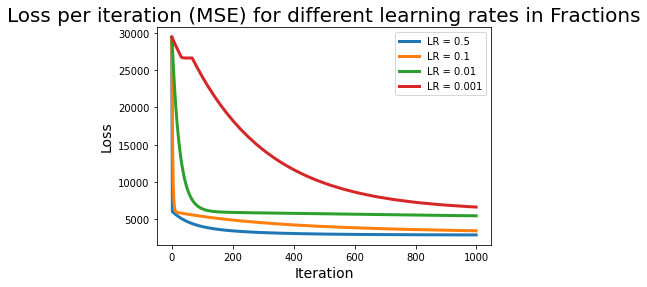

In [209]:
# losses = {}
# for lr in [0.5, 0.1, 0.01, 0.001]:
#     model = LinearRegression(learning_rate=lr)
#     model.fit(X_train, y_train)
#     losses[f'LR={str(lr)}'] = model.loss
    
import matplotlib.pyplot as plt  
xs = np.arange(len(loss5))

plt.plot(xs, loss5, lw=3, label="LR = 0.5")
plt.plot(xs, loss10, lw=3, label="LR = 0.1")
plt.plot(xs, loss100, lw=3, label="LR = 0.01")
plt.plot(xs, loss1000, lw=3, label="LR = 0.001")
plt.title('Loss per iteration (MSE) for different learning rates in Fractions', size=20)
plt.xlabel('Iteration', size=14)
plt.ylabel('Loss', size=14)
plt.legend()
plt.show()

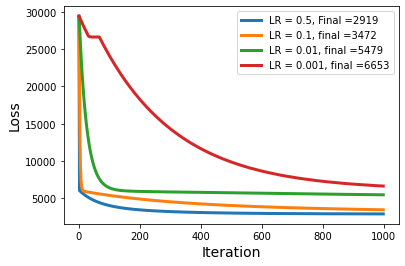

In [219]:
import matplotlib.pyplot as plt  
xs = np.arange(len(loss5))
# plt.plot(xs, losses['LR=0.5'], lw=3, label=f"LR = 0.5, Final = {losses['LR=0.5'][-1]:.2f}")


plt.plot(xs, loss5, lw=3, label=f"LR = 0.5, Final ={int(loss5[-1])} ")
plt.plot(xs, loss10, lw=3, label=f"LR = 0.1, final ={int(loss10[-1])}")
plt.plot(xs, loss100, lw=3, label=f"LR = 0.01, final ={int(loss100[-1])}")
plt.plot(xs, loss1000, lw=3, label=f"LR = 0.001, final ={int(loss1000[-1])}")
# plt.title('Fraction computation MSE for different learning rate', size=20)
plt.xlabel('Iteration', size=14)
plt.ylabel('Loss', size=14)
plt.legend()

plt.savefig("python-fraction.pdf")
plt.show()

In [211]:
gcd(10,100)

10